# 0. Imports and definitions

In [199]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Reproducibility
SEED = 42
np.random.seed(SEED)

In [200]:
def plot_series(df=None, columns=None, series=pd.Series([]),
                label=None, ylabel=None, title=None, start=0, end=None,
                marker='o', markersize=4, linestyle='-', figsize=(14, 6)):
    """
    Plots one or multiple time-series from a dataframe or a custom pandas series.
    'columns' accepts a single string or a list of strings.
    'label' accepts a single string or a list of strings matching the columns.
    'start' and 'end' accept both integer positions and UTC timestamp strings
    like '2015-01-05 11:00:00+00:00'.
    """
    def _slice(data):
        if isinstance(start, str) or isinstance(end, str):
            s = pd.Timestamp(start) if isinstance(start, str) else data.index[start]
            e = pd.Timestamp(end)   if isinstance(end, str)   else (data.index[end] if end is not None else data.index[-1])
            return data.loc[s:e]
        return data.iloc[start:end]

    # Normalize columns and labels to lists
    if isinstance(columns, str):
        columns = [columns]
    if isinstance(label, str):
        label = [label]
    if columns and label and len(label) != len(columns):
        raise ValueError(f"'label' length ({len(label)}) must match 'columns' length ({len(columns)})")

    sns.set()
    fig, ax = plt.subplots(figsize=figsize)
    ax.set_xlabel('Date', fontsize=16)

    if columns is not None:
        alpha = 0.6 if len(columns) > 1 else 1.0
        for i, col in enumerate(columns):
            lbl = label[i] if label else col
            ax.plot(_slice(df[col]), marker=marker, linestyle=linestyle,
                    markersize=markersize, label=lbl, alpha=alpha)
        ax.set_ylabel(ylabel, fontsize=16)

    if series.any():
        lbl = label[0] if label else None
        ax.plot(_slice(series), marker=marker, linestyle=linestyle,
                markersize=markersize, label=lbl)
        ax.set_ylabel(ylabel, fontsize=16)

    ax.legend(fontsize=16)
    if title:
        ax.set_title(title, fontsize=24)

    ax.grid(True)
    plt.tight_layout()
    return ax

# 1. Exploration and cleaning

## 1.1 Energy Dataset

In [201]:
df_energy = pd.read_csv('../data/raw/energy_dataset.csv')

In [202]:
df_energy.head()

,time,generation biomass,generation fossil brown coal/lignite,generation fossil coal-derived gas,generation fossil gas,generation fossil hard coal,generation fossil oil,generation fossil oil shale,generation fossil peat,generation geothermal,...,generation waste,generation wind offshore,generation wind onshore,forecast solar day ahead,forecast wind offshore eday ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual
0,2015-01-01 00:00:00+01:00,447.0,329.0,0.0,4844.0,4821.0,162.0,0.0,0.0,0.0,...,196.0,0.0,6378.0,17.0,NaN,6436.0,26118.0,25385.0,50.10,65.41
1,2015-01-01 01:00:00+01:00,449.0,328.0,0.0,5196.0,4755.0,158.0,0.0,0.0,0.0,...,195.0,0.0,5890.0,16.0,NaN,5856.0,24934.0,24382.0,48.10,64.92
2,2015-01-01 02:00:00+01:00,448.0,323.0,0.0,4857.0,4581.0,157.0,0.0,0.0,0.0,...,196.0,0.0,5461.0,8.0,NaN,5454.0,23515.0,22734.0,47.33,64.48
3,2015-01-01 03:00:00+01:00,438.0,254.0,0.0,4314.0,4131.0,160.0,0.0,0.0,0.0,...,191.0,0.0,5238.0,2.0,NaN,5151.0,22642.0,21286.0,42.27,59.32
4,2015-01-01 04:00:00+01:00,428.0,187.0,0.0,4130.0,3840.0,156.0,0.0,0.0,0.0,...,189.0,0.0,4935.0,9.0,NaN,4861.0,21785.0,20264.0,38.41,56.04


In [203]:
# We set 'time' as time index with hourly frequency
df_energy['time'] = pd.to_datetime(df_energy['time'], utc=True)
df_energy.set_index('time', inplace=True)
df_energy = df_energy.resample('h').asfreq()
df_energy.head()

,generation biomass,generation fossil brown coal/lignite,generation fossil coal-derived gas,generation fossil gas,generation fossil hard coal,generation fossil oil,generation fossil oil shale,generation fossil peat,generation geothermal,generation hydro pumped storage aggregated,...,generation waste,generation wind offshore,generation wind onshore,forecast solar day ahead,forecast wind offshore eday ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual
time,,,,,,,,,,,,,,,,,,,,,
2014-12-31 23:00:00+00:00,447.0,329.0,0.0,4844.0,4821.0,162.0,0.0,0.0,0.0,NaN,...,196.0,0.0,6378.0,17.0,NaN,6436.0,26118.0,25385.0,50.10,65.41
2015-01-01 00:00:00+00:00,449.0,328.0,0.0,5196.0,4755.0,158.0,0.0,0.0,0.0,NaN,...,195.0,0.0,5890.0,16.0,NaN,5856.0,24934.0,24382.0,48.10,64.92
2015-01-01 01:00:00+00:00,448.0,323.0,0.0,4857.0,4581.0,157.0,0.0,0.0,0.0,NaN,...,196.0,0.0,5461.0,8.0,NaN,5454.0,23515.0,22734.0,47.33,64.48
2015-01-01 02:00:00+00:00,438.0,254.0,0.0,4314.0,4131.0,160.0,0.0,0.0,0.0,NaN,...,191.0,0.0,5238.0,2.0,NaN,5151.0,22642.0,21286.0,42.27,59.32
2015-01-01 03:00:00+00:00,428.0,187.0,0.0,4130.0,3840.0,156.0,0.0,0.0,0.0,NaN,...,189.0,0.0,4935.0,9.0,NaN,4861.0,21785.0,20264.0,38.41,56.04


In [204]:
df_energy.describe().round(2)

,generation biomass,generation fossil brown coal/lignite,generation fossil coal-derived gas,generation fossil gas,generation fossil hard coal,generation fossil oil,generation fossil oil shale,generation fossil peat,generation geothermal,generation hydro pumped storage aggregated,...,generation waste,generation wind offshore,generation wind onshore,forecast solar day ahead,forecast wind offshore eday ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual
count,35045.00,35046.00,35046.0,35046.00,35046.00,35045.00,35046.0,35046.0,35046.0,0.0,...,35045.00,35046.0,35046.00,35064.00,0.0,35064.00,35064.00,35028.00,35064.00,35064.00
mean,383.51,448.06,0.0,5622.74,4256.07,298.32,0.0,0.0,0.0,NaN,...,269.45,0.0,5464.48,1439.07,NaN,5471.22,28712.13,28696.94,49.87,57.88
std,85.35,354.57,0.0,2201.83,1961.60,52.52,0.0,0.0,0.0,NaN,...,50.20,0.0,3213.69,1677.70,NaN,3176.31,4594.10,4574.99,14.62,14.20
min,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.0,0.0,NaN,...,0.00,0.0,0.00,0.00,NaN,237.00,18105.00,18041.00,2.06,9.33
25%,333.00,0.00,0.0,4126.00,2527.00,263.00,0.0,0.0,0.0,NaN,...,240.00,0.0,2933.00,69.00,NaN,2979.00,24793.75,24807.75,41.49,49.35
50%,367.00,509.00,0.0,4969.00,4474.00,300.00,0.0,0.0,0.0,NaN,...,279.00,0.0,4849.00,576.00,NaN,4855.00,28906.00,28901.00,50.52,58.02
75%,433.00,757.00,0.0,6429.00,5838.75,330.00,0.0,0.0,0.0,NaN,...,310.00,0.0,7398.00,2636.00,NaN,7353.00,32263.25,32192.00,60.53,68.01
max,592.00,999.00,0.0,20034.00,8359.00,449.00,0.0,0.0,0.0,NaN,...,357.00,0.0,17436.00,5836.00,NaN,17430.00,41390.00,41015.00,101.99,116.80


In [205]:
# We find the columns that don't have values
cols_zero_or_nan = [
    col for col in df_energy.columns
    if df_energy[col].isna().all() or (df_energy[col].fillna(0) == 0).all()
]

print(cols_zero_or_nan)

['generation fossil coal-derived gas', 'generation fossil oil shale', 'generation fossil peat', 'generation geothermal', 'generation hydro pumped storage aggregated', 'generation marine', 'generation wind offshore', 'forecast wind offshore eday ahead']


<span style="color: darkblue;">Columns composed entirely of zeros or NaN values will be removed, as they contain no usable information</span>

In [206]:
# Drop useless columns
df_energy = df_energy.drop(cols_zero_or_nan, axis=1)
df_energy.describe().round(2)

,generation biomass,generation fossil brown coal/lignite,generation fossil gas,generation fossil hard coal,generation fossil oil,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation nuclear,generation other,generation other renewable,generation solar,generation waste,generation wind onshore,forecast solar day ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual
count,35045.00,35046.00,35046.00,35046.00,35045.00,35045.00,35045.00,35046.00,35047.00,35046.00,35046.00,35046.00,35045.00,35046.00,35064.00,35064.00,35064.00,35028.00,35064.00,35064.00
mean,383.51,448.06,5622.74,4256.07,298.32,475.58,972.12,2605.11,6263.91,60.23,85.64,1432.67,269.45,5464.48,1439.07,5471.22,28712.13,28696.94,49.87,57.88
std,85.35,354.57,2201.83,1961.60,52.52,792.41,400.78,1835.20,839.67,20.24,14.08,1680.12,50.20,3213.69,1677.70,3176.31,4594.10,4574.99,14.62,14.20
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,237.00,18105.00,18041.00,2.06,9.33
25%,333.00,0.00,4126.00,2527.00,263.00,0.00,637.00,1077.25,5760.00,53.00,73.00,71.00,240.00,2933.00,69.00,2979.00,24793.75,24807.75,41.49,49.35
50%,367.00,509.00,4969.00,4474.00,300.00,68.00,906.00,2164.00,6566.00,57.00,88.00,616.00,279.00,4849.00,576.00,4855.00,28906.00,28901.00,50.52,58.02
75%,433.00,757.00,6429.00,5838.75,330.00,616.00,1250.00,3757.00,7025.00,80.00,97.00,2578.00,310.00,7398.00,2636.00,7353.00,32263.25,32192.00,60.53,68.01
max,592.00,999.00,20034.00,8359.00,449.00,4523.00,2000.00,9728.00,7117.00,106.00,119.00,5792.00,357.00,17436.00,5836.00,17430.00,41390.00,41015.00,101.99,116.80


<span style="color: darkblue;">We also remove the forecasted variables and the variables that contain temporal leakage

In [207]:
# Drop forbidden variables
df_energy = df_energy.drop([
    'forecast solar day ahead',
    'forecast wind onshore day ahead',
    'price day ahead',
    'price actual'
], axis=1)
df_energy.describe().round(2)

,generation biomass,generation fossil brown coal/lignite,generation fossil gas,generation fossil hard coal,generation fossil oil,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation nuclear,generation other,generation other renewable,generation solar,generation waste,generation wind onshore,total load forecast,total load actual
count,35045.00,35046.00,35046.00,35046.00,35045.00,35045.00,35045.00,35046.00,35047.00,35046.00,35046.00,35046.00,35045.00,35046.00,35064.00,35028.00
mean,383.51,448.06,5622.74,4256.07,298.32,475.58,972.12,2605.11,6263.91,60.23,85.64,1432.67,269.45,5464.48,28712.13,28696.94
std,85.35,354.57,2201.83,1961.60,52.52,792.41,400.78,1835.20,839.67,20.24,14.08,1680.12,50.20,3213.69,4594.10,4574.99
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,18105.00,18041.00
25%,333.00,0.00,4126.00,2527.00,263.00,0.00,637.00,1077.25,5760.00,53.00,73.00,71.00,240.00,2933.00,24793.75,24807.75
50%,367.00,509.00,4969.00,4474.00,300.00,68.00,906.00,2164.00,6566.00,57.00,88.00,616.00,279.00,4849.00,28906.00,28901.00
75%,433.00,757.00,6429.00,5838.75,330.00,616.00,1250.00,3757.00,7025.00,80.00,97.00,2578.00,310.00,7398.00,32263.25,32192.00
max,592.00,999.00,20034.00,8359.00,449.00,4523.00,2000.00,9728.00,7117.00,106.00,119.00,5792.00,357.00,17436.00,41390.00,41015.00


In [208]:
df_energy.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 35064 entries, 2014-12-31 23:00:00+00:00 to 2018-12-31 22:00:00+00:00
Freq: h
Data columns (total 16 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   generation biomass                           35045 non-null  float64
 1   generation fossil brown coal/lignite         35046 non-null  float64
 2   generation fossil gas                        35046 non-null  float64
 3   generation fossil hard coal                  35046 non-null  float64
 4   generation fossil oil                        35045 non-null  float64
 5   generation hydro pumped storage consumption  35045 non-null  float64
 6   generation hydro run-of-river and poundage   35045 non-null  float64
 7   generation hydro water reservoir             35046 non-null  float64
 8   generation nuclear                           35047 non-null  float64
 9   generation other 

### 1.1.1 Outlier handling

In [209]:
(df_energy == 0).sum()

generation biomass                                 4
generation fossil brown coal/lignite           10517
generation fossil gas                              1
generation fossil hard coal                        3
generation fossil oil                              3
generation hydro pumped storage consumption    12607
generation hydro run-of-river and poundage         3
generation hydro water reservoir                   3
generation nuclear                                 3
generation other                                   4
generation other renewable                         3
generation solar                                   3
generation waste                                   3
generation wind onshore                            3
total load forecast                                0
total load actual                                  0
dtype: int64

<span style="color: darkblue;">`generation fossil brown coal/lignite` and `generation hydro pumped storage consumption` have too many zero values to be noise or outliers, but the rest of the variables have very few values. Let's check them.</span>

In [210]:
few_zeros_cols = [col for col in df_energy.columns 
                  if 0 < (df_energy[col] == 0).sum() <= 10]

for col in few_zeros_cols:
    timestamps = df_energy.index[df_energy[col] == 0].tolist()
    print(f"\n{col} ({len(timestamps)} zeros):")
    for ts in timestamps:
        print(f"  {ts}")


generation biomass (4 zeros):
  2017-11-12 20:00:00+00:00
  2017-11-14 11:00:00+00:00
  2017-11-14 18:00:00+00:00
  2018-05-06 10:00:00+00:00

generation fossil gas (1 zeros):
  2018-06-02 09:00:00+00:00

generation fossil hard coal (3 zeros):
  2017-11-12 20:00:00+00:00
  2017-11-14 11:00:00+00:00
  2017-11-14 18:00:00+00:00

generation fossil oil (3 zeros):
  2017-11-12 20:00:00+00:00
  2017-11-14 11:00:00+00:00
  2017-11-14 18:00:00+00:00

generation hydro run-of-river and poundage (3 zeros):
  2017-11-12 20:00:00+00:00
  2017-11-14 11:00:00+00:00
  2017-11-14 18:00:00+00:00

generation hydro water reservoir (3 zeros):
  2017-11-12 20:00:00+00:00
  2017-11-14 11:00:00+00:00
  2017-11-14 18:00:00+00:00

generation nuclear (3 zeros):
  2017-11-12 20:00:00+00:00
  2017-11-14 11:00:00+00:00
  2017-11-14 18:00:00+00:00

generation other (4 zeros):
  2017-11-12 20:00:00+00:00
  2017-11-14 11:00:00+00:00
  2017-11-14 18:00:00+00:00
  2018-05-06 10:00:00+00:00

generation other renewable (

<span style="color: darkblue;">Most of those zeros share the same timestamp, so this must be due to data corruption or bad value imputation. We will set those values to NaN and handle them in the next section.</span>

In [211]:
corrupt_timestamps = [
    '2017-11-12 20:00:00+00:00',
    '2017-11-14 11:00:00+00:00',
    '2017-11-14 18:00:00+00:00',
    '2018-05-06 10:00:00+00:00',
    '2018-06-02 09:00:00+00:00',
]

df_energy.loc[corrupt_timestamps] = df_energy.loc[corrupt_timestamps].replace(0, np.nan)

# Verify
print((df_energy == 0).sum()[few_zeros_cols])

generation biomass                            0
generation fossil gas                         0
generation fossil hard coal                   0
generation fossil oil                         0
generation hydro run-of-river and poundage    0
generation hydro water reservoir              0
generation nuclear                            0
generation other                              0
generation other renewable                    0
generation solar                              0
generation waste                              0
generation wind onshore                       0
dtype: int64


### 1.1.2 Missing values handling

In [212]:
# Find NaNs
print(f'Found {df_energy.isnull().values.sum()} missing values')
print(f'Found {df_energy.duplicated().values.sum()} duplicated values')

Found 335 missing values
Found 0 duplicated values


In [213]:
# Find the number of NaNs in each column
df_energy.isnull().sum(axis=0)

generation biomass                             23
generation fossil brown coal/lignite           21
generation fossil gas                          19
generation fossil hard coal                    21
generation fossil oil                          22
generation hydro pumped storage consumption    23
generation hydro run-of-river and poundage     22
generation hydro water reservoir               21
generation nuclear                             20
generation other                               22
generation other renewable                     21
generation solar                               21
generation waste                               22
generation wind onshore                        21
total load forecast                             0
total load actual                              36
dtype: int64

<span style="color: darkblue;">There are some NaNs, mostly on the target variable 'total load actual'. Let's have a look first of how long the missing value gaps are.</span>

#### Target variable

In [214]:
df_energy[df_energy['total load actual'].isnull()]['total load actual']

time
2015-01-05 11:00:00+00:00   NaN
2015-01-05 12:00:00+00:00   NaN
2015-01-05 13:00:00+00:00   NaN
2015-01-05 14:00:00+00:00   NaN
2015-01-05 15:00:00+00:00   NaN
2015-01-05 16:00:00+00:00   NaN
2015-01-28 12:00:00+00:00   NaN
2015-02-01 06:00:00+00:00   NaN
2015-02-01 07:00:00+00:00   NaN
2015-02-01 08:00:00+00:00   NaN
2015-02-01 11:00:00+00:00   NaN
2015-02-01 12:00:00+00:00   NaN
2015-02-01 13:00:00+00:00   NaN
2015-02-01 14:00:00+00:00   NaN
2015-02-01 15:00:00+00:00   NaN
2015-02-01 16:00:00+00:00   NaN
2015-02-01 17:00:00+00:00   NaN
2015-02-01 18:00:00+00:00   NaN
2015-04-05 01:00:00+00:00   NaN
2015-04-16 07:00:00+00:00   NaN
2015-04-20 06:00:00+00:00   NaN
2015-04-23 19:00:00+00:00   NaN
2015-05-02 08:00:00+00:00   NaN
2015-05-29 01:00:00+00:00   NaN
2015-10-02 06:00:00+00:00   NaN
2015-10-02 09:00:00+00:00   NaN
2015-12-02 08:00:00+00:00   NaN
2016-04-25 03:00:00+00:00   NaN
2016-04-25 05:00:00+00:00   NaN
2016-05-10 21:00:00+00:00   NaN
2016-07-09 20:00:00+00:00   NaN
201

<span style="color: darkblue;">Most of the missing values are punctual hourly gaps, but there are two bigger gaps of a few hours. Let's plot those parts and see how they look like.</span>

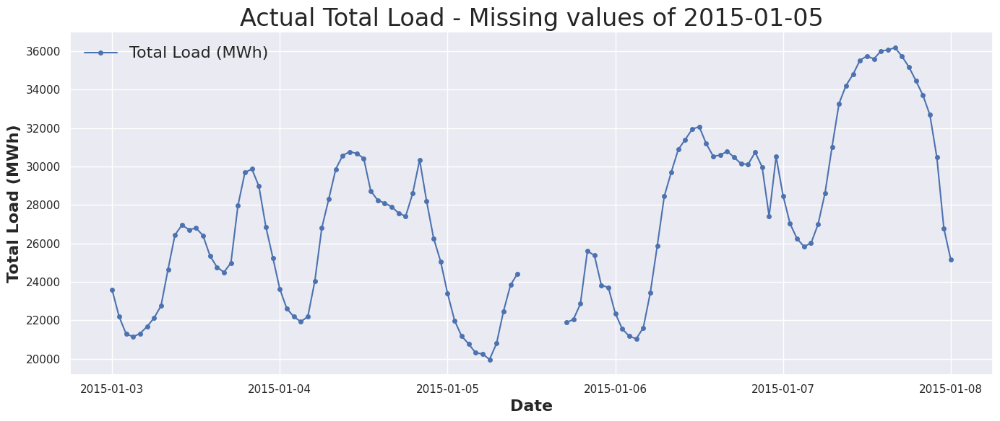

In [215]:
# Missing values of 2015-01-05
plot_series(
    df=df_energy,
    columns='total load actual',
    start='2015-01-03 00:00:00+00:00',
    end='2015-01-08 00:00:00+00:00',
    label='Total Load (MWh)',
    ylabel='Total Load (MWh)',
    title='Actual Total Load - Missing values of 2015-01-05'
)
plt.savefig('../report/figures/original_target_missing_1.png', dpi=80)

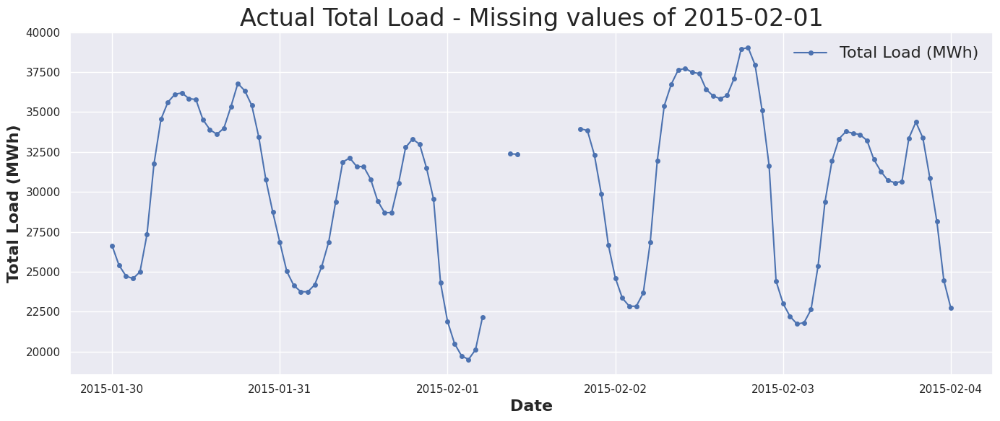

In [216]:
# Missing values of 2015-02-01
plot_series(
    df=df_energy,
    columns='total load actual',
    start='2015-01-30 00:00:00+00:00',
    end='2015-02-04 00:00:00+00:00',
    label='Total Load (MWh)',
    ylabel='Total Load (MWh)',
    title='Actual Total Load - Missing values of 2015-02-01'
)
plt.savefig('../report/figures/original_target_missing_2.png', dpi=80)

<span style="color: darkblue;">In order to replicate those curvy patterns we will try different interplotation methods.</span>

In [217]:
df_energy['total load actual linear'] = df_energy['total load actual'].interpolate(method='linear')
df_energy['total load actual quadratic'] = df_energy['total load actual'].interpolate(method='quadratic')
df_energy['total load actual cubic'] = df_energy['total load actual'].interpolate(method='cubic')

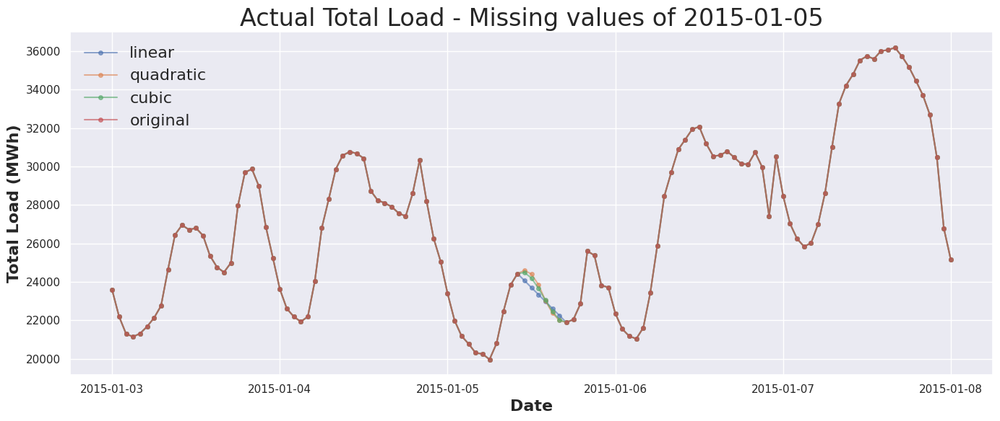

In [218]:
plot_series(
    df=df_energy,
    columns=[
        'total load actual linear',
        'total load actual quadratic',
        'total load actual cubic',
        'total load actual',
    ],
    start='2015-01-03 00:00:00+00:00',
    end='2015-01-08 00:00:00+00:00',
    label=[
        'linear',
        'quadratic',
        'cubic',
        'original',
    ],
    ylabel='Total Load (MWh)',
    title='Actual Total Load - Missing values of 2015-01-05'
)
plt.savefig('../report/figures/original_target_inter_1.png', dpi=80)

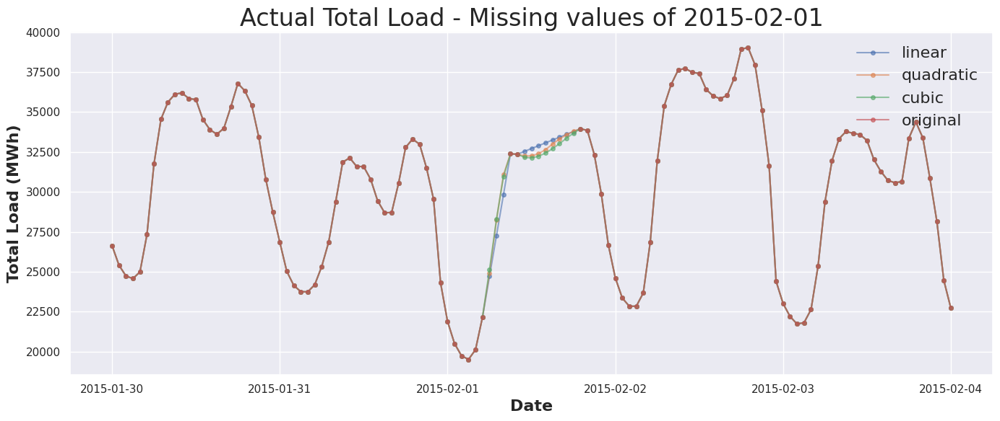

In [219]:
plot_series(
    df=df_energy,
    columns=[
        'total load actual linear',
        'total load actual quadratic',
        'total load actual cubic',
        'total load actual',
    ],
    start='2015-01-30 00:00:00+00:00',
    end='2015-02-04 00:00:00+00:00',
    label=[
        'linear',
        'quadratic',
        'cubic',
        'original',
    ],
    ylabel='Total Load (MWh)',
    title='Actual Total Load - Missing values of 2015-02-01'
)
plt.savefig('../report/figures/original_target_inter_2.png', dpi=80)

<span style="color: darkblue;">The best interpolation method seems to be the cuadratic one, so we will use that and remove the others.</span>

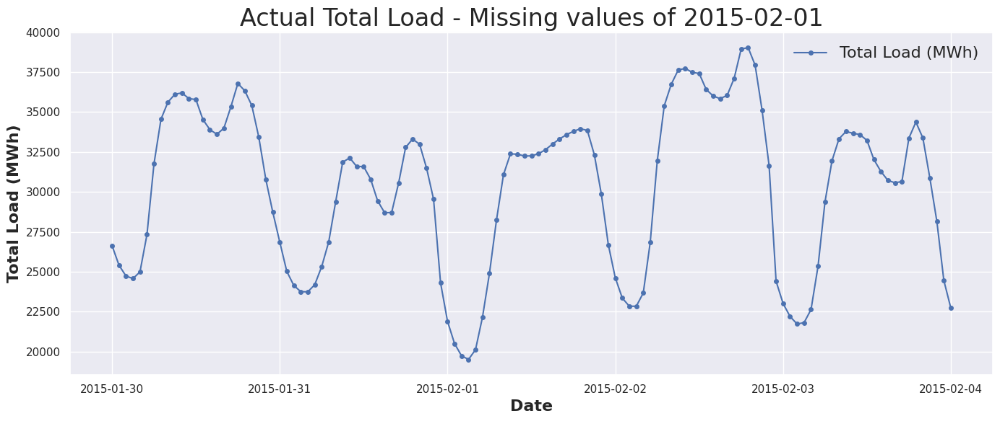

In [220]:
df_energy['total load actual'] = df_energy['total load actual'].interpolate(method='quadratic')
plot_series(
    df=df_energy,
    columns='total load actual',
    start='2015-01-30 00:00:00+00:00',
    end='2015-02-04 00:00:00+00:00',
    label='Total Load (MWh)',
    ylabel='Total Load (MWh)',
    title='Actual Total Load - Missing values of 2015-02-01'
)
plt.savefig('../report/figures/interpolated_target_2.png', dpi=80)
df_energy = df_energy.drop([
    'total load actual linear',
    'total load actual quadratic',
    'total load actual cubic'
], axis=1)

#### Rest of variables

In [221]:
# Find the number of NaNs in each column
df_energy.isnull().sum(axis=0)

generation biomass                             23
generation fossil brown coal/lignite           21
generation fossil gas                          19
generation fossil hard coal                    21
generation fossil oil                          22
generation hydro pumped storage consumption    23
generation hydro run-of-river and poundage     22
generation hydro water reservoir               21
generation nuclear                             20
generation other                               22
generation other renewable                     21
generation solar                               21
generation waste                               22
generation wind onshore                        21
total load forecast                             0
total load actual                               0
dtype: int64

In [222]:
df_energy[df_energy['generation biomass'].isnull()]['generation biomass']

time
2015-01-05 02:00:00+00:00   NaN
2015-01-05 11:00:00+00:00   NaN
2015-01-05 12:00:00+00:00   NaN
2015-01-05 13:00:00+00:00   NaN
2015-01-05 14:00:00+00:00   NaN
2015-01-05 15:00:00+00:00   NaN
2015-01-05 16:00:00+00:00   NaN
2015-01-19 18:00:00+00:00   NaN
2015-01-19 19:00:00+00:00   NaN
2015-01-27 18:00:00+00:00   NaN
2015-01-28 12:00:00+00:00   NaN
2015-04-16 07:00:00+00:00   NaN
2015-04-23 19:00:00+00:00   NaN
2015-06-15 07:00:00+00:00   NaN
2015-10-02 09:00:00+00:00   NaN
2015-12-02 08:00:00+00:00   NaN
2016-07-09 20:00:00+00:00   NaN
2016-11-23 03:00:00+00:00   NaN
2017-11-12 20:00:00+00:00   NaN
2017-11-14 11:00:00+00:00   NaN
2017-11-14 18:00:00+00:00   NaN
2018-05-06 10:00:00+00:00   NaN
2018-07-11 07:00:00+00:00   NaN
Name: generation biomass, dtype: float64

<Axes: title={'center': 'Generation Biomass - Missing values of 2015-01-05'}, xlabel='Date', ylabel='Generation Biomass'>

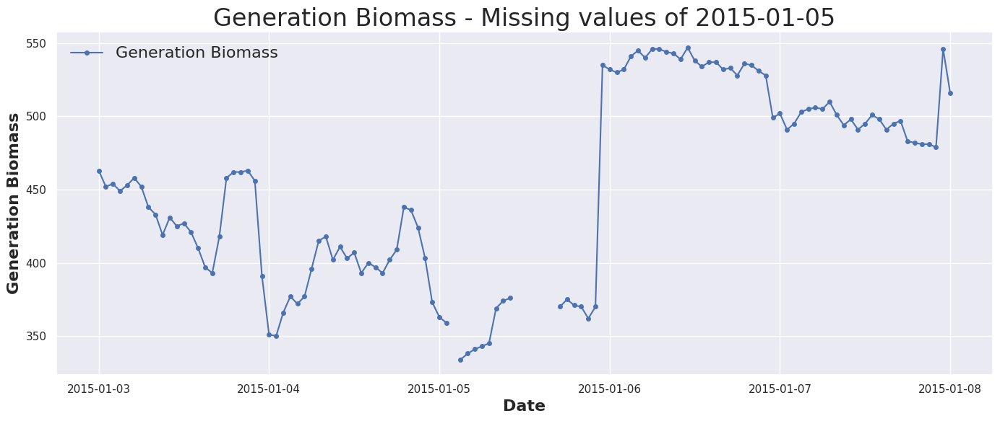

In [223]:
# Missing values of 2015-01-05
plot_series(
    df=df_energy,
    columns='generation biomass',
    start='2015-01-03 00:00:00+00:00',
    end='2015-01-08 00:00:00+00:00',
    label='Generation Biomass',
    ylabel='Generation Biomass',
    title='Generation Biomass - Missing values of 2015-01-05'
)

In [224]:
df_energy[df_energy['generation fossil brown coal/lignite'].isnull()]['generation fossil brown coal/lignite']

time
2015-01-05 02:00:00+00:00   NaN
2015-01-05 11:00:00+00:00   NaN
2015-01-05 12:00:00+00:00   NaN
2015-01-05 13:00:00+00:00   NaN
2015-01-05 14:00:00+00:00   NaN
2015-01-05 15:00:00+00:00   NaN
2015-01-05 16:00:00+00:00   NaN
2015-01-19 18:00:00+00:00   NaN
2015-01-19 19:00:00+00:00   NaN
2015-01-27 18:00:00+00:00   NaN
2015-01-28 12:00:00+00:00   NaN
2015-04-16 07:00:00+00:00   NaN
2015-04-23 19:00:00+00:00   NaN
2015-06-15 07:00:00+00:00   NaN
2015-10-02 09:00:00+00:00   NaN
2015-12-02 08:00:00+00:00   NaN
2016-07-09 20:00:00+00:00   NaN
2017-11-12 20:00:00+00:00   NaN
2017-11-14 11:00:00+00:00   NaN
2017-11-14 18:00:00+00:00   NaN
2018-07-11 07:00:00+00:00   NaN
Name: generation fossil brown coal/lignite, dtype: float64

<Axes: title={'center': 'Generation Fossil Brown Coal/Lignite - Missing values of 2015-01-05'}, xlabel='Date', ylabel='Generation Fossil Brown Coal/Lignite'>

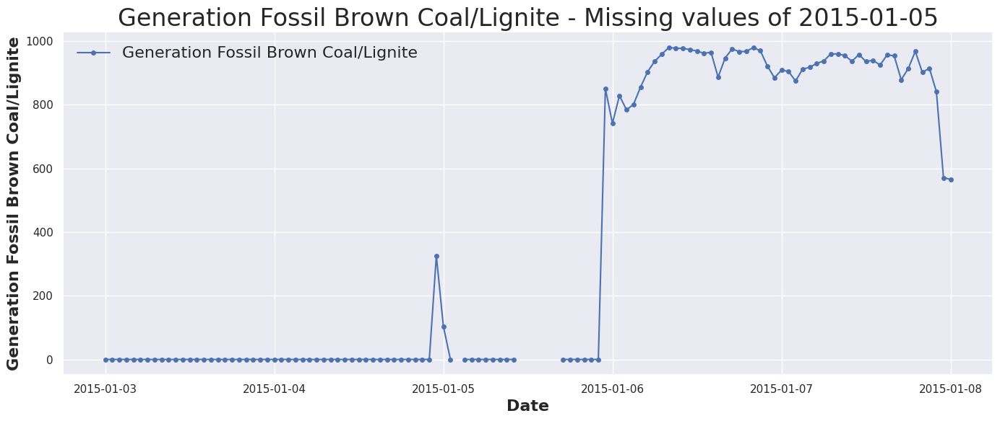

In [225]:
# Missing values of 2015-01-05
plot_series(
    df=df_energy,
    columns='generation fossil brown coal/lignite',
    start='2015-01-03 00:00:00+00:00',
    end='2015-01-08 00:00:00+00:00',
    label='Generation Fossil Brown Coal/Lignite',
    ylabel='Generation Fossil Brown Coal/Lignite',
    title='Generation Fossil Brown Coal/Lignite - Missing values of 2015-01-05'
)

<span style="color: darkblue;">It seems that most of the variables have missing values on the same period of 2015-01-05. Let's check that.</span>

In [226]:
for column in df_energy.columns:
    if df_energy[column].isnull().sum():
        print('='*60)
        print(column)
        print(df_energy[df_energy[column].isnull()][column])
        print('='*60)
        print()

generation biomass
time
2015-01-05 02:00:00+00:00   NaN
2015-01-05 11:00:00+00:00   NaN
2015-01-05 12:00:00+00:00   NaN
2015-01-05 13:00:00+00:00   NaN
2015-01-05 14:00:00+00:00   NaN
2015-01-05 15:00:00+00:00   NaN
2015-01-05 16:00:00+00:00   NaN
2015-01-19 18:00:00+00:00   NaN
2015-01-19 19:00:00+00:00   NaN
2015-01-27 18:00:00+00:00   NaN
2015-01-28 12:00:00+00:00   NaN
2015-04-16 07:00:00+00:00   NaN
2015-04-23 19:00:00+00:00   NaN
2015-06-15 07:00:00+00:00   NaN
2015-10-02 09:00:00+00:00   NaN
2015-12-02 08:00:00+00:00   NaN
2016-07-09 20:00:00+00:00   NaN
2016-11-23 03:00:00+00:00   NaN
2017-11-12 20:00:00+00:00   NaN
2017-11-14 11:00:00+00:00   NaN
2017-11-14 18:00:00+00:00   NaN
2018-05-06 10:00:00+00:00   NaN
2018-07-11 07:00:00+00:00   NaN
Name: generation biomass, dtype: float64

generation fossil brown coal/lignite
time
2015-01-05 02:00:00+00:00   NaN
2015-01-05 11:00:00+00:00   NaN
2015-01-05 12:00:00+00:00   NaN
2015-01-05 13:00:00+00:00   NaN
2015-01-05 14:00:00+00:00   

<span style="color: darkblue;">Most of the time stamps of the missing values coincide between variables. As there are only a few missing values, instead of studing each variable, we will apply a linear interpolation to all of them. The noise introduced by doing this should be low.</span>

In [227]:
df_energy.interpolate(method='linear', inplace=True, axis=0)

In [228]:
# Find the number of NaNs in each column
df_energy.isnull().sum(axis=0)

generation biomass                             0
generation fossil brown coal/lignite           0
generation fossil gas                          0
generation fossil hard coal                    0
generation fossil oil                          0
generation hydro pumped storage consumption    0
generation hydro run-of-river and poundage     0
generation hydro water reservoir               0
generation nuclear                             0
generation other                               0
generation other renewable                     0
generation solar                               0
generation waste                               0
generation wind onshore                        0
total load forecast                            0
total load actual                              0
dtype: int64

### 1.1.3 Preventing temporal leakage
<span style="color: darkblue;">In order to prevent temporal leakage from energy generation covariates, we will shift those variables by 24h.</span>

In [229]:
gen_covariates = list(filter(lambda x: 'generation' in x, df_energy.columns))
gen_covariates_renamed = [x + ' shift24h' for x in gen_covariates]
df_energy[gen_covariates_renamed] = df_energy[gen_covariates].shift(24)
df_energy = df_energy.drop(columns=gen_covariates, axis=1)
df_energy.isnull().sum(axis=0)

total load forecast                                      0
total load actual                                        0
generation biomass shift24h                             24
generation fossil brown coal/lignite shift24h           24
generation fossil gas shift24h                          24
generation fossil hard coal shift24h                    24
generation fossil oil shift24h                          24
generation hydro pumped storage consumption shift24h    24
generation hydro run-of-river and poundage shift24h     24
generation hydro water reservoir shift24h               24
generation nuclear shift24h                             24
generation other shift24h                               24
generation other renewable shift24h                     24
generation solar shift24h                               24
generation waste shift24h                               24
generation wind onshore shift24h                        24
dtype: int64

In [230]:
df_energy = df_energy.dropna()
df_energy.isnull().sum(axis=0)

total load forecast                                     0
total load actual                                       0
generation biomass shift24h                             0
generation fossil brown coal/lignite shift24h           0
generation fossil gas shift24h                          0
generation fossil hard coal shift24h                    0
generation fossil oil shift24h                          0
generation hydro pumped storage consumption shift24h    0
generation hydro run-of-river and poundage shift24h     0
generation hydro water reservoir shift24h               0
generation nuclear shift24h                             0
generation other shift24h                               0
generation other renewable shift24h                     0
generation solar shift24h                               0
generation waste shift24h                               0
generation wind onshore shift24h                        0
dtype: int64

### 1.1.4 Saving dataframes
<span style="color: darkblue;">Finally, we will separate target variables (TSO forecast and total actual load) and save the three dataframes as CSV in an ordered way.</span>

In [231]:
df_TSO_forecast = df_energy['total load forecast'].copy()
df_energy_target = df_energy['total load actual'].copy()
df_energy = df_energy.drop([
    'total load forecast',
    'total load actual'
], axis=1)

In [232]:
df_TSO_forecast.describe().round(2)

count    35040.00
mean     28714.88
std       4593.86
min      18105.00
25%      24796.00
50%      28908.00
75%      32265.00
max      41390.00
Name: total load forecast, dtype: float64

In [233]:
df_energy_target.describe().round(2)

count    35040.00
mean     28701.75
std       4575.18
min      18041.00
25%      24810.75
50%      28910.00
75%      32197.00
max      41015.00
Name: total load actual, dtype: float64

In [234]:
df_energy.describe().round(2)

,generation biomass shift24h,generation fossil brown coal/lignite shift24h,generation fossil gas shift24h,generation fossil hard coal shift24h,generation fossil oil shift24h,generation hydro pumped storage consumption shift24h,generation hydro run-of-river and poundage shift24h,generation hydro water reservoir shift24h,generation nuclear shift24h,generation other shift24h,generation other renewable shift24h,generation solar shift24h,generation waste shift24h,generation wind onshore shift24h
count,35040.00,35040.00,35040.00,35040.00,35040.00,35040.00,35040.00,35040.00,35040.00,35040.00,35040.00,35040.00,35040.00,35040.00
mean,383.63,448.47,5622.46,4258.50,298.44,475.78,972.21,2605.99,6264.10,60.23,85.64,1433.18,269.43,5467.16
std,85.25,354.54,2201.93,1961.60,52.40,792.52,400.76,1835.46,838.61,20.24,14.06,1680.08,50.17,3213.75
min,101.00,0.00,1518.00,576.00,44.00,0.00,283.00,134.00,998.00,3.00,4.00,2.00,39.00,234.00
25%,333.00,0.00,4126.00,2531.75,263.00,0.00,637.00,1078.00,5758.00,53.00,73.00,71.00,240.00,2935.00
50%,367.00,510.00,4968.00,4477.00,300.00,68.00,906.00,2165.50,6569.50,57.00,88.00,616.00,279.00,4854.00
75%,433.00,757.00,6428.00,5841.00,330.00,617.00,1251.00,3758.25,7025.00,80.00,97.00,2579.00,310.00,7403.00
max,592.00,999.00,20034.00,8359.00,449.00,4523.00,2000.00,9728.00,7117.00,106.00,119.00,5792.00,357.00,17436.00


In [235]:
df_TSO_forecast.to_csv('../data/interim/TSO_forecast.csv')
df_energy_target.to_csv('../data/interim/energy_dataset_target.csv')
df_energy.to_csv('../data/interim/energy_dataset.csv')

## 1.2 Exogenous variables
<span style="color: darkblue;">All exogenous covariates (except for energy generation ones) are prepared in the "exogenous_covariates.ipynb" notebook.</span>

In [236]:
import json

exog_df = pd.read_csv('../data/interim/exogs_df.csv', index_col=0, parse_dates=True)

with open('../data/interim/exog_columns.json', 'r') as f:
    exog_columns = json.load(f)

In [237]:
exog_df.index[0], exog_df.index[-1]

(Timestamp('2014-12-31 23:00:00+0000', tz='UTC'),
 Timestamp('2018-12-31 22:00:00+0000', tz='UTC'))

In [238]:
exog_df.head()

,eurusd_close_shift24h,ttf_gas_eur_shift24h,brent_close_eur_shift24h,is_top_liga_match,is_national_team_match,is_national_holiday,is_weekend,day,day_sin,day_cos,...,barcelona_weather_good,bilbao_weather_good,madrid_weather_good,seville_weather_good,valencia_weather_good,barcelona_weather_mid,bilbao_weather_mid,madrid_weather_mid,seville_weather_mid,valencia_weather_mid
time,,,,,,,,,,,,,,,,,,,,,
2014-12-31 23:00:00+00:00,1.216205,21.296,47.138445,0.0,0.0,0,0,2,0.974928,-0.222521,...,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
2015-01-01 00:00:00+00:00,1.216205,21.296,47.138445,0.0,0.0,1,0,3,0.433884,-0.900969,...,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
2015-01-01 01:00:00+00:00,1.216205,21.296,47.138445,0.0,0.0,1,0,3,0.433884,-0.900969,...,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
2015-01-01 02:00:00+00:00,1.216205,21.296,47.138445,0.0,0.0,1,0,3,0.433884,-0.900969,...,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
2015-01-01 03:00:00+00:00,1.216205,21.296,47.138445,0.0,0.0,1,0,3,0.433884,-0.900969,...,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0


## 1.3 Merging dataframes

In [239]:
df_energy_target.index[0], df_energy_target.index[-1], len(df_energy_target)

(Timestamp('2015-01-01 23:00:00+0000', tz='UTC'),
 Timestamp('2018-12-31 22:00:00+0000', tz='UTC'),
 35040)

In [240]:
exog_df.index[0], exog_df.index[-1], len(exog_df)

(Timestamp('2014-12-31 23:00:00+0000', tz='UTC'),
 Timestamp('2018-12-31 22:00:00+0000', tz='UTC'),
 35064)

In [241]:
df_energy.index[0], df_energy.index[-1], len(df_energy)

(Timestamp('2015-01-01 23:00:00+0000', tz='UTC'),
 Timestamp('2018-12-31 22:00:00+0000', tz='UTC'),
 35040)

In [242]:
whole_df = df_energy_target.to_frame().join(df_energy)
whole_df = whole_df.join(exog_df)
whole_df.head()

,total load actual,generation biomass shift24h,generation fossil brown coal/lignite shift24h,generation fossil gas shift24h,generation fossil hard coal shift24h,generation fossil oil shift24h,generation hydro pumped storage consumption shift24h,generation hydro run-of-river and poundage shift24h,generation hydro water reservoir shift24h,generation nuclear shift24h,...,barcelona_weather_good,bilbao_weather_good,madrid_weather_good,seville_weather_good,valencia_weather_good,barcelona_weather_mid,bilbao_weather_mid,madrid_weather_mid,seville_weather_mid,valencia_weather_mid
time,,,,,,,,,,,,,,,,,,,,,
2015-01-01 23:00:00+00:00,27070.0,447.0,329.0,4844.0,4821.0,162.0,863.0,1051.0,1899.0,7096.0,...,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
2015-01-02 00:00:00+00:00,24935.0,449.0,328.0,5196.0,4755.0,158.0,920.0,1009.0,1658.0,7096.0,...,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
2015-01-02 01:00:00+00:00,23214.0,448.0,323.0,4857.0,4581.0,157.0,1164.0,973.0,1371.0,7099.0,...,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
2015-01-02 02:00:00+00:00,22540.0,438.0,254.0,4314.0,4131.0,160.0,1503.0,949.0,779.0,7098.0,...,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
2015-01-02 03:00:00+00:00,22096.0,428.0,187.0,4130.0,3840.0,156.0,1826.0,953.0,720.0,7097.0,...,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0


### 1.3.1 Correlation study
<span style="color: darkblue;">We analyze the correlation between the target variable `total load actual` and the rest of the variables. As we have a lot of data (4 years of data at hourly frequency), apart from computing the correlation over the whole data, which gives us a global view, we will also calculate quaterly rolling correlation windows. That will help us to see how the correlation between the variables change over the time (if it changes at all).</span>

In [250]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
from statsmodels.tsa.seasonal import STL

def show_correlation_window(df, col, n_months=3):
    """
    Calculates and plots the rolling correlation between a specific column 
    and the 'total load actual' shifted by -1.
    
    Improvements:
    - Fixes the AttributeError by using standard tick retrieval.
    - Adds vertical dashed lines at every N-month interval.
    - Forces bold formatting on X-axis labels.
    """
    
    # 1. Ensure index is Datetime
    if not isinstance(df.index, pd.DatetimeIndex):
        df.index = pd.to_datetime(df.index)
    
    # 2. Window configuration (24h * 7d * 4w * n_months)
    window_size = 24 * 7 * 4 * n_months 
    
    # 3. Rolling Correlation Calculation
    # We use .dropna() to remove the initial period where the window is not full
    rolling_corr = (
        df[col]
        .rolling(window=window_size)
        .corr(df['total load actual'])
    ).dropna()
    
    # 4. Plotting
    fig, ax = plt.subplots(figsize=(15, 6))

    ax.axhline(0, color='black', linestyle='--', 
               linewidth=1.5, label=f'Zero Corr', alpha = 0.6)
    
    # Plot the rolling correlation line
    ax.plot(rolling_corr.index, rolling_corr, 
            label=f'Rolling Corr ({n_months} Mo)', 
            color='#1f77b4', alpha=0.9, linewidth=1.8)
    
    # Global mean reference line
    mean_val = rolling_corr.mean()
    ax.axhline(mean_val, color='red', linestyle='--', 
               linewidth=1.5, label=f'Global Mean: {mean_val:.2f}')

    # --- X-AXIS CUSTOMIZATION ---
    
    # Set the frequency of ticks (every N months)
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=n_months))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%m/%y'))
    
    # Crucial: Trigger a draw to populate the ticks before we try to read them
    plt.gcf().canvas.draw()
    
    # Get tick positions for vertical lines
    # We use ax.get_xticks() which is safe and standard
    ticks = ax.get_xticks()
    for t in ticks:
        ax.axvline(t, color='gray', linestyle='--', alpha=0.3, linewidth=1)

    # Set bold font for the labels and rotate
    for label in ax.get_xticklabels():
        label.set_fontweight('bold')
        label.set_rotation(45)
    
    # Aesthetics and Labels
    ax.set_title(f'Rolling Correlation: {col} vs total load actual', fontsize=15, pad=20, fontweight='bold')
    ax.set_ylabel('Pearson Coefficient ($r$)', fontsize=12)
    ax.set_ylim(-1.05, 1.05) # Pearson is strictly between -1 and 1
    ax.grid(True, which='both', linestyle=':', alpha=0.4)
    ax.legend(loc='best', frameon=True)
    
    plt.tight_layout()
    col = col.replace("/", "__")
    plt.savefig(f'../report/figures/corr/{col} vs total load actual.png', dpi=80)
    plt.show()

In [251]:
correlations = whole_df.corr(method='pearson')
print(correlations['total load actual'].sort_values(ascending=False).to_string())

total load actual                                       1.000000
generation solar shift24h                               0.392078
generation fossil gas shift24h                          0.376717
generation hydro water reservoir shift24h               0.329529
generation fossil hard coal shift24h                    0.247160
valencia_temp_min                                       0.234267
generation fossil oil shift24h                          0.221681
valencia_temp                                           0.219715
day_sin                                                 0.210056
seville_temp_min                                        0.205617
madrid_temp_max                                         0.203724
seville_temp                                            0.203559
valencia_temp_max                                       0.198715
valencia_wind_y                                         0.197510
bilbao_temp                                             0.195517
bilbao_temp_max          

In [252]:
sorted_cols = np.abs(correlations['total load actual']).sort_values(ascending=False).keys()[1:]

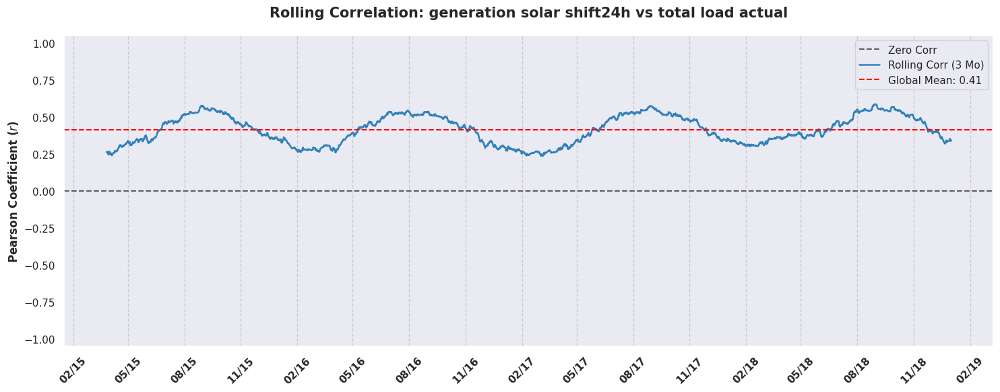

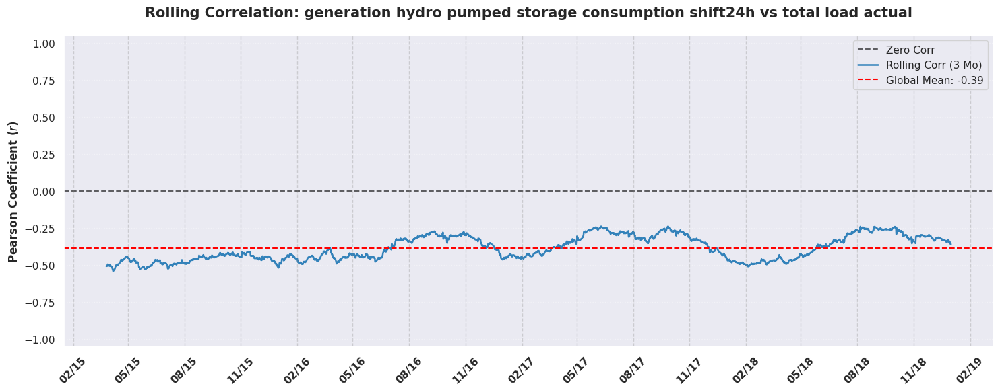

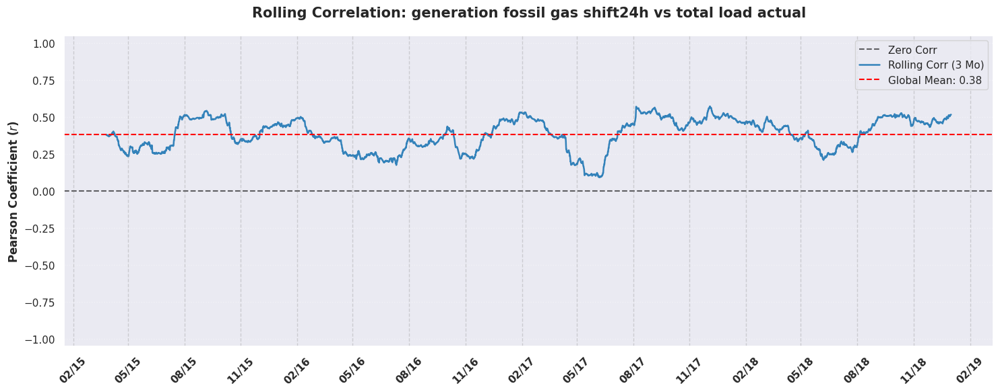

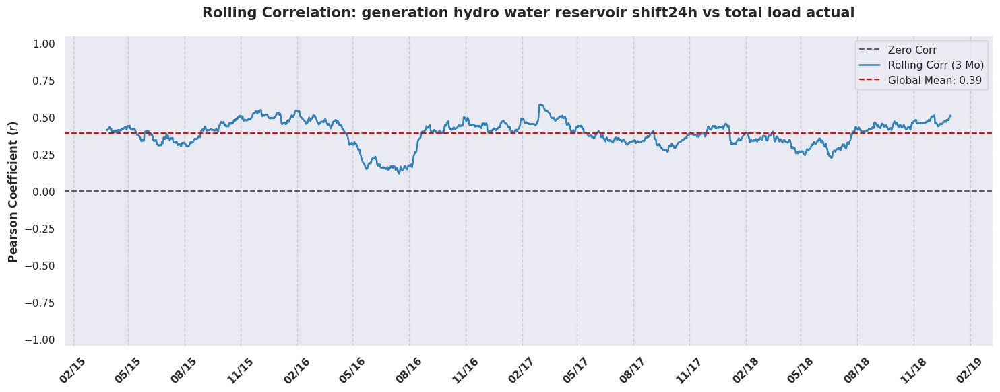

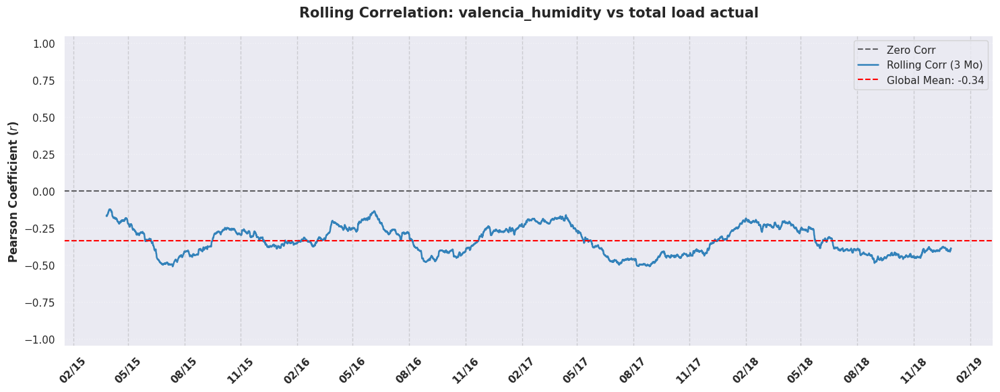

...

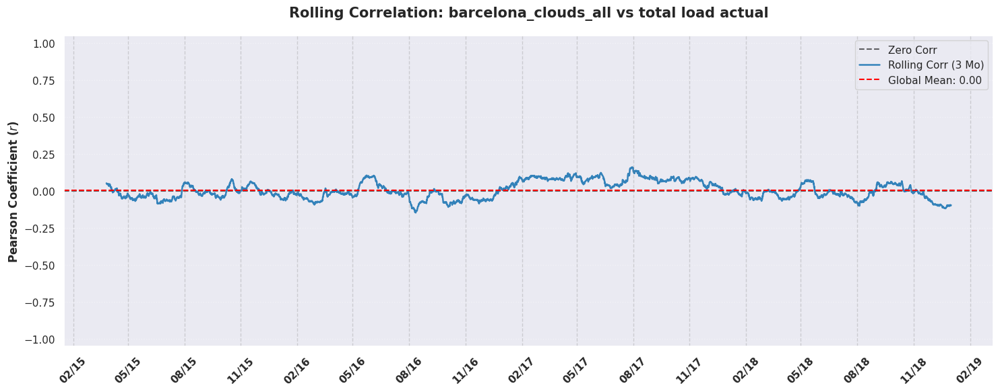

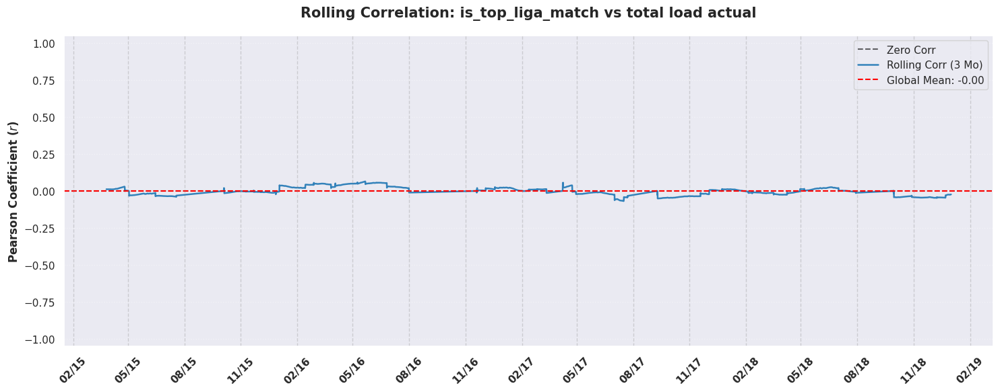

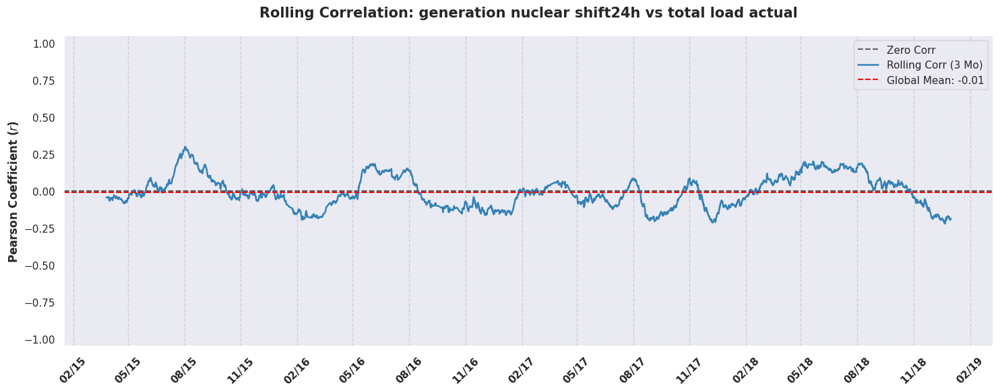

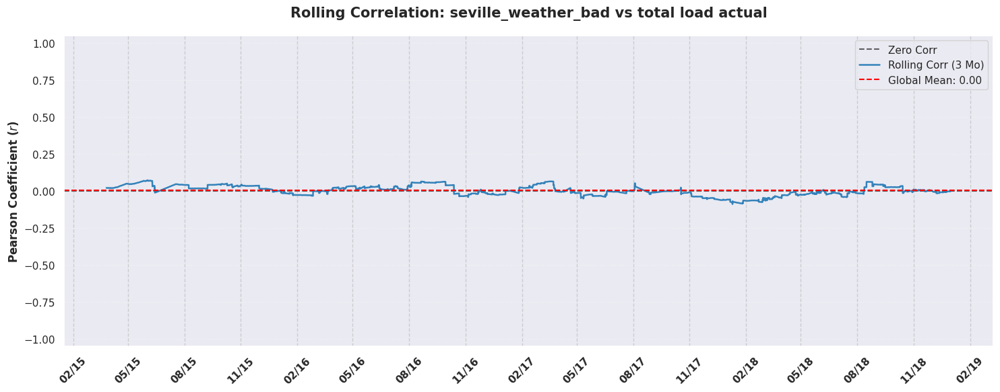

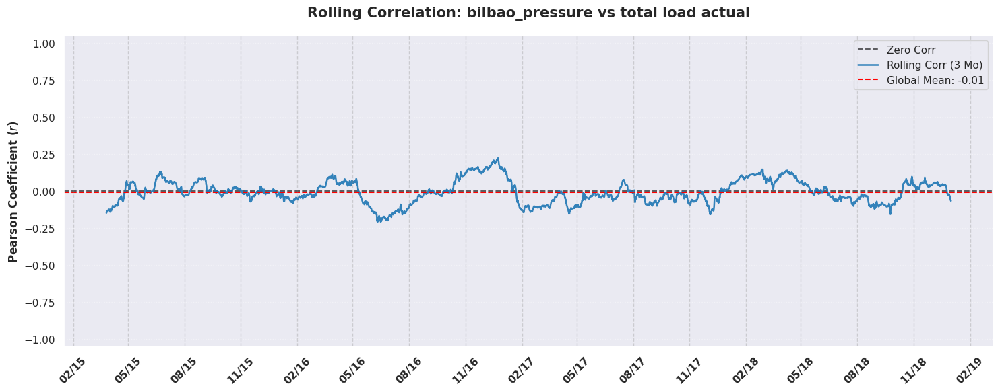

In [253]:
for col in sorted_cols:
    show_correlation_window(df = whole_df, col = col, n_months = 3)

<span style="color: darkblue;">By analyzing the rolling correlation plots, we observe that the highest values in absolute terms are mainly associated with climatic and meteorological covariates. In particular, temperature shows a stronger relationship during warmer periods, while humidity becomes more relevant during colder seasons. This complementary behavior suggests that different weather variables capture different demand drivers across the year, which may help the models better explain electricity demand depending on the seasonal context.</span>\
<span style="color: darkblue;">Regarding energy related covariates, such as gas and pumped hydro generation, we observe a moderate correlation with the target. This behavior is coherent with their role as flexible or backup energy sources, whose production typically adjusts in response to demand levels rather than acting as direct drivers of demand.</span>\
<span style="color: darkblue;">Economic covariates exhibit both positive and negative correlation peaks without following clear or easily interpretable temporal patterns. Further analysis will be required to assess whether these signals reflect any meaningful causal relationship or if they mainly introduce noise.</span>\
<span style="color: darkblue;">Calendar-related variables show more intuitive patterns, with weekends being associated with lower demand levels.</span>\
<span style="color: darkblue;">Finally, other sources of information, such as holidays or major sports events, do not present strong overall correlations, although they may still be relevant at a micro scale or during specific time periods.</span>

# 2. Trend and Seasonality analysis

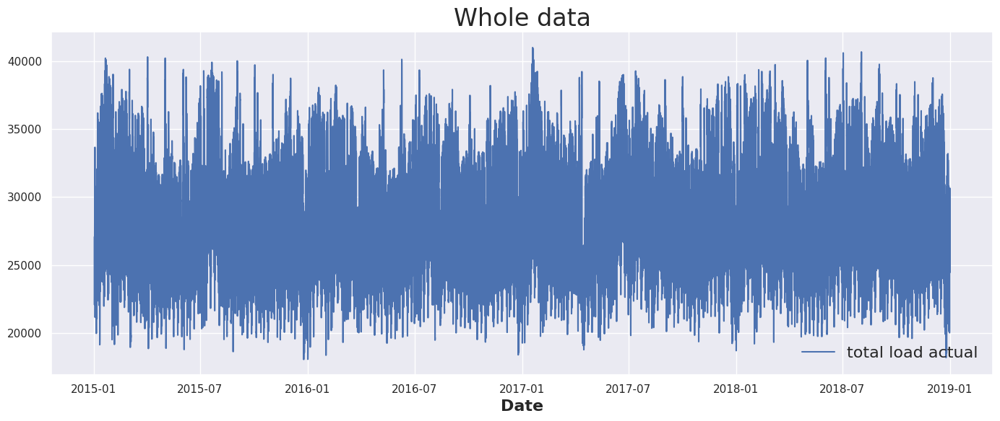

In [254]:
plot_series(series = whole_df['total load actual'], label = 'total load actual', title = 'Whole data', marker = None)
plt.show()

<span style="color: darkblue;">Variance seems constant, but we cannot conclude nothing because at this scale we can't see nothing clearly. Might be additive model instead of multiplicative</span>

Whole Data


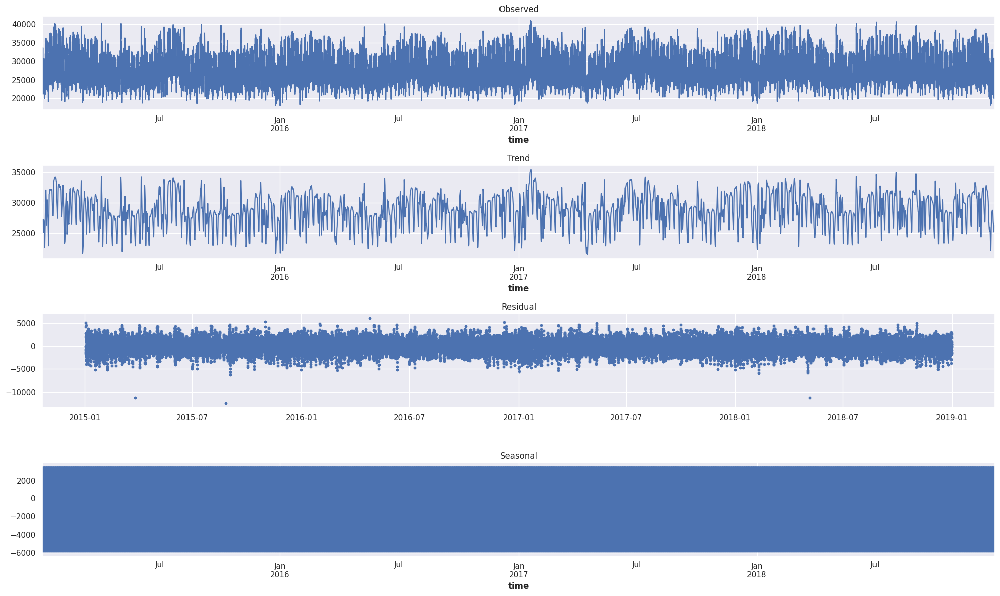

In [255]:
print('Whole Data')
res = sm.tsa.seasonal_decompose(whole_df['total load actual'], model='additive')

fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(20, 12))
res.observed.plot(ax=ax1, title='Observed')
res.trend.plot(ax=ax2, title='Trend')
ax3.scatter(res.resid.index, res.resid.values, s=10)
ax3.set_title('Residual')
res.seasonal.plot(ax=ax4, title='Seasonal')
plt.tight_layout()
plt.show()

<span style="color: darkblue;">There can be some kind of cycles on the trend.</span>

In [256]:
aux_df = whole_df.copy()
aux_df['Q-MA'] = aux_df['total load actual'].rolling(
    window=24*7*4*3, 
    center=True, 
    min_periods=24*7*4*3
).mean()

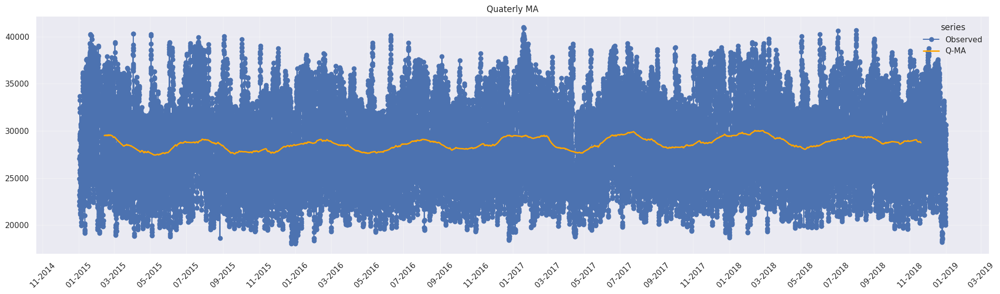

In [257]:
import matplotlib.dates as mdates

# To see what the trend-cycle estimate looks like, we plot it along with the original data
fig, ax = plt.subplots(figsize=(20, 6))

ax.plot(aux_df.index, aux_df['total load actual'], marker='o', label="Observed")
ax.plot(aux_df.index, aux_df['Q-MA'], color='orange', linewidth=2, label='Q-MA')

ax.set_title('Quaterly MA')

# ---- AUMENTAR DENSIDAD DE MESES EN EL EJE X ----
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))  # cada 2 meses
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%Y'))
plt.xticks(rotation=45)

plt.legend(title='series')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('../report/figures/cyclic_trend.png', dpi=80)
plt.show()

<span style="color: darkblue;">There is a clear cyclic pattern on the macro-scale. This might be useful information for some kind of models. Now, let's zoom in to a quarter so me can see if there is any seasonal pattern.</span>

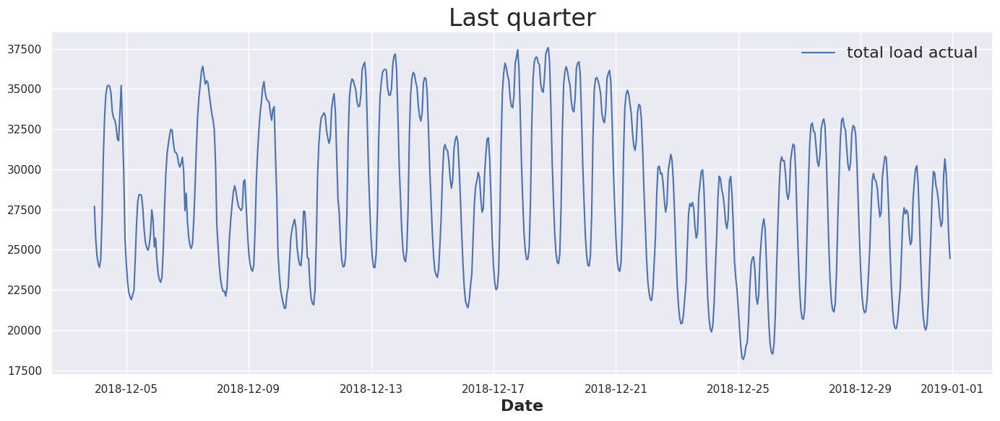

In [258]:
plot_series(series = whole_df['total load actual'].iloc[-(24*7)*4:], label = 'total load actual', title = 'Last quarter', marker = None)
plt.savefig('../report/figures/target_last_quarter.png', dpi=80)
plt.show()

Last quarter - Additive model


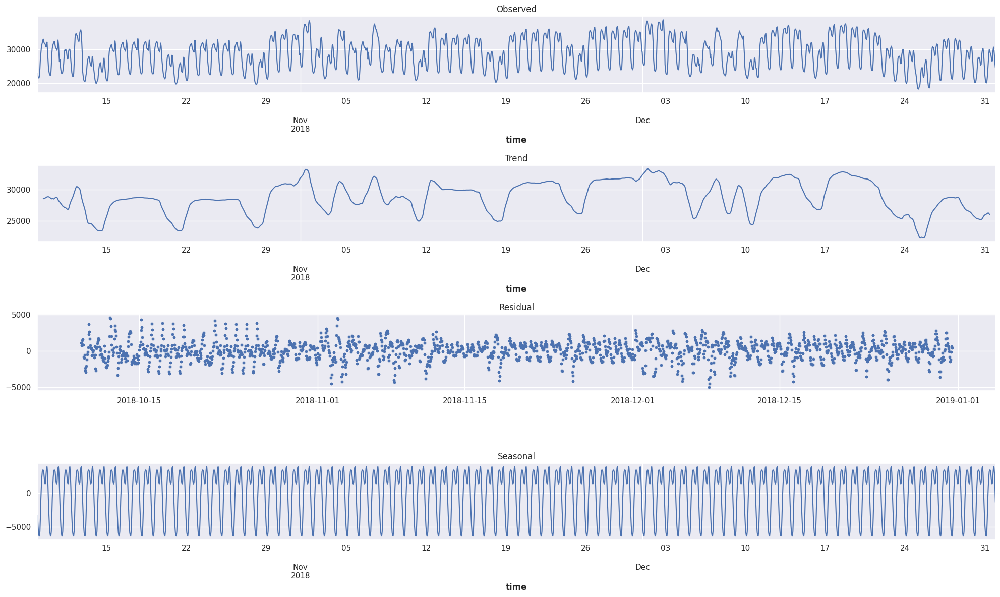

In [259]:
print('Last quarter - Additive model')
res = sm.tsa.seasonal_decompose(whole_df['total load actual'].iloc[-24*7*4*3:], model='additive')

fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(20, 12))
res.observed.plot(ax=ax1, title='Observed')
res.trend.plot(ax=ax2, title='Trend')
ax3.scatter(res.resid.index, res.resid.values, s=10)
ax3.set_title('Residual')
res.seasonal.plot(ax=ax4, title='Seasonal')
plt.tight_layout()
plt.show()

<span style="color: darkblue;">Although residuals don't look random, seasonality seems to have a daily behaviour. We can also see how the load also decreases during two days after every five days. Those must be the weekend days (Saturday and Sunday).</span>

# 3. Train / Val / Test splits
<span style="color: darkblue;">For most of ML problems it is very common to split the dataset into the main "train", "val" and "test" sets on a stratified way (so the three splits are similar regarding the class or value distribution).</span>\
<span style="color: darkblue;">In order to do something similar in a time series problem, we somehow need to analyze the similarity between these sets. We will not care too much for the train split and instead we will focus on choosing the best validation and test splits.</span>\
<span style="color: darkblue;">To do so, we will calculate the similarity between ACF plots and the similarity between naive (mean) MAE errors.</span>

In [260]:
import numpy as np
import pandas as pd
from statsmodels.tsa.stattools import acf
import warnings
warnings.filterwarnings("ignore")

HOURS_PER_DAY  = 24
HOURS_PER_YEAR = 365 * HOURS_PER_DAY  # 8_760


def _make_splits(series: pd.Series, n_chunks: int):
    """Consecutive train / val / test with no gaps."""
    chunk_h = n_chunks * HOURS_PER_DAY
    train = series.iloc[: -(chunk_h * 2)]
    val   = series.iloc[-(chunk_h * 2) : -chunk_h]
    test  = series.iloc[-chunk_h :]
    return train, val, test


def _acf_similarity(a: np.ndarray, b: np.ndarray) -> float:
    nlags = min(168, len(a) // 4, len(b) // 4)
    dist  = np.linalg.norm(acf(a, nlags=nlags, fft=True) - acf(b, nlags=nlags, fft=True))
    return 1.0 / (1.0 + dist)


def _naive_ratio_score(train: np.ndarray, val: np.ndarray, test: np.ndarray) -> float:
    pattern = train[-HOURS_PER_DAY:]
    def _mae(s):
        errors = [np.mean(np.abs(s[i:i+HOURS_PER_DAY] - pattern[:len(s[i:i+HOURS_PER_DAY])]))
                  for i in range(0, len(s) - HOURS_PER_DAY + 1, HOURS_PER_DAY)]
        return float(np.mean(errors)) if errors else np.nan
    mae_v, mae_t = _mae(val), _mae(test)
    if np.isnan(mae_v) or mae_v == 0:
        return 0.0
    return 1.0 / (1.0 + abs(mae_t / mae_v - 1.0))


def find_optimal_chunks(series, candidates=None, weights=None):
    if candidates is None:
        candidates = sorted({365, 365//2, 365//4, 365//12}, reverse=True)
    rows = []
    for n in candidates:
        chunk_h = n * HOURS_PER_DAY
        if len(series) < chunk_h * 2 + 48:
            continue
        train, val, test = _make_splits(series, n)
        a, b, tr = val.values, test.values, train.values
        acf_s   = _acf_similarity(a, b)
        naive_s = _naive_ratio_score(tr, a, b)
        rows.append({
            "n_chunks": n, "train_size_days": len(train)//HOURS_PER_DAY,
            "val_start": val.index[0].date(), "val_end": val.index[-1].date(),
            "test_start": test.index[0].date(), "test_end": test.index[-1].date(),
            "acf_similarity": round(acf_s,4), "naive_ratio_score": round(naive_s,4)
        })
    return pd.DataFrame(rows).sort_values("n_chunks", ascending=True).reset_index(drop=True)

results = find_optimal_chunks(whole_df['total load actual'])
print(results.to_string(index=False))

 n_chunks  train_size_days  val_start    val_end test_start   test_end  acf_similarity  naive_ratio_score
       30             1400 2018-11-01 2018-12-01 2018-12-01 2018-12-31          0.4690             0.8517
       91             1278 2018-07-02 2018-10-01 2018-10-01 2018-12-31          0.5183             0.9040
      182             1096 2018-01-01 2018-07-02 2018-07-02 2018-12-31          0.5688             0.9824
      365              730 2016-12-31 2017-12-31 2017-12-31 2018-12-31          0.6606             0.9759


<span style="color: darkblue;">Looking to the results, the best tested combination seems to be the `n_chunks = 365` option. The `naive_ratio_score` is slightly lower than the `n_chunks = 182` option, but the ACF similarity is the highest by far.</span>\
<span style="color: darkblue;">So, for this time series problem, we will use the first two years for training, the next year for validation and the last year for testing.</span>

In [261]:
train_df = whole_df.iloc[:365*24*2]
val_df = whole_df.iloc[365*24*2 : 365*24*3]
test_df = whole_df.iloc[365*24*3:]

In [262]:
print(f'Train split:\tlength = {int(len(train_df) / 24)}, start = {train_df.index[0]}, end = {train_df.index[-1]}')
print(f'Val split:\tlength = {int(len(val_df) / 24)}, start = {val_df.index[0]}, end = {val_df.index[-1]}')
print(f'Test split:\tlength = {int(len(test_df) / 24)}, start = {test_df.index[0]}, end = {test_df.index[-1]}')

Train split:	length = 730, start = 2015-01-01 23:00:00+00:00, end = 2016-12-31 22:00:00+00:00
Val split:	length = 365, start = 2016-12-31 23:00:00+00:00, end = 2017-12-31 22:00:00+00:00
Test split:	length = 365, start = 2017-12-31 23:00:00+00:00, end = 2018-12-31 22:00:00+00:00


In [263]:
y_train = train_df['total load actual']
y_val = val_df['total load actual']
y_test = test_df['total load actual']

# 4. TSO error reference
<span style="color: darkblue;">One of the objectives of this work is to try to beat the TSO forecast. So, now that we already have choosed the data splits, we can measure its error and use it as a reference.</span>

In [264]:
TSO_forecast_on_test = df_TSO_forecast.iloc[365*24*3:]
print(f'TSO Forecast (Test set): length = {int(len(TSO_forecast_on_test) / 24)}, start = {TSO_forecast_on_test.index[0]}, end = {TSO_forecast_on_test.index[-1]}')

TSO Forecast (Test set): length = 365, start = 2017-12-31 23:00:00+00:00, end = 2018-12-31 22:00:00+00:00


In [265]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error

In [266]:
y_test = test_df['total load actual']
y_pred_TSO = TSO_forecast_on_test.squeeze()

rmse_TSO = np.sqrt(mean_squared_error(y_test, y_pred_TSO))
mae_TSO = mean_absolute_error(y_test, y_pred_TSO)
mape_TSO = mean_absolute_percentage_error(y_test, y_pred_TSO)

print(f"--- Predictive Performance Metrics ---")
print(f"RMSE (Root Mean Squared Error): {rmse_TSO:.2f}")
print(f"MAE (Mean Absolute Error):      {mae_TSO:.2f}")
print(f"MAPE (Mean Absolute Pct Error): {mape_TSO*100:.2f}")

--- Predictive Performance Metrics ---
RMSE (Root Mean Squared Error): 389.32
MAE (Mean Absolute Error):      269.85
MAPE (Mean Absolute Pct Error): 0.93


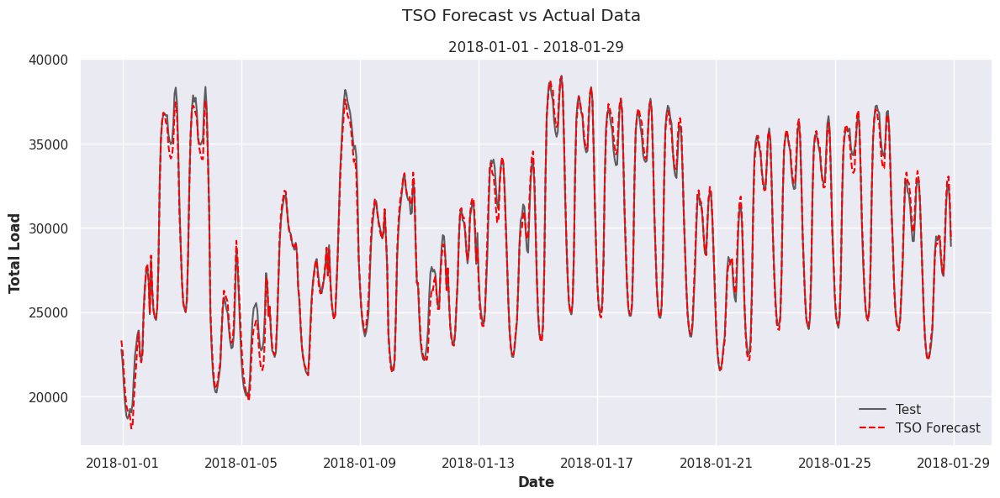

In [267]:
plt.figure(figsize=(14, 6))
plt.plot(y_test.index[:24*7*4], y_test[:24*7*4], label='Test', color='black', alpha=0.6)
plt.plot(y_test.index[:24*7*4], y_pred_TSO[:24*7*4], label='TSO Forecast', color='red', linestyle='--')

plt.suptitle('TSO Forecast vs Actual Data')
plt.title('2018-01-01 - 2018-01-29')
plt.xlabel('Date')
plt.ylabel('Total Load')
plt.legend()
plt.savefig('../report/figures/TSO_forecast.png', dpi=80)
plt.show()

<span style="color: darkblue;">We have to admit that the TSO forecast is really good. Beating it isn't going to be easy.</span>

# 5. Statistical Models
<span style="color: darkblue;">Even if we don't expect to beat TSO forecast with it, our first approach will be based on statistical models due to their simplicity and to set up a baseline for our own development. We will try two models: SARIMA and SARIMAX.</span>\
<span style="color: darkblue;">In order to use both of them, we need to get stationarity on the time series. So let's start with the process.</span>

## 5.1 Stationarity study

In [268]:
from statsmodels.tsa.stattools import adfuller, kpss

def test_stationarity(timeseries, ct=True, title=""):
    # --- Clean the series first ---
    timeseries = timeseries.replace([np.inf, -np.inf], np.nan).dropna()

    print(f"--- ADF Test Results {title} ---")
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(
        dftest[0:4],
        index=['Test Statistic', 'p-value', '#Lags Used', 'Number of Observations Used']
    )
    for key, value in dftest[4].items():
        dfoutput[f'Critical Value ({key})'] = value
    print(dfoutput)

    if dftest[1] <= 0.05:
        print("\nConclusion: We reject H0. The series IS STATIONARY.")
    else:
        print("\nConclusion: We cannot reject H0. The series is NOT STATIONARY.")

    # --- KPSS Test ---
    regression = 'ct' if ct else 'c'
    result_kpss = kpss(timeseries, regression=regression, nlags='auto')

    print(f"\n{'='*65}")
    print(f"KPSS Test: {'Trend Stationarity' if ct else 'Level Stationarity'}")
    print('='*65)
    print(f"Test Statistic:         {result_kpss[0]:.4f}")
    print(f"P-value:                {result_kpss[1]:.4f}")   # was result_stationary (undefined)
    print(f"Lags Used:              {result_kpss[2]}")        # was result_stationary (undefined)
    for key, value in result_kpss[3].items():
        print(f"Critical Value ({key}):  {value:.4f}")

    if result_kpss[1] < 0.05:
        print("\nKPSS Conclusion: We reject H0. The series is NOT STATIONARY.")
    else:
        print("\nKPSS Conclusion: We cannot reject H0. The series IS STATIONARY.")

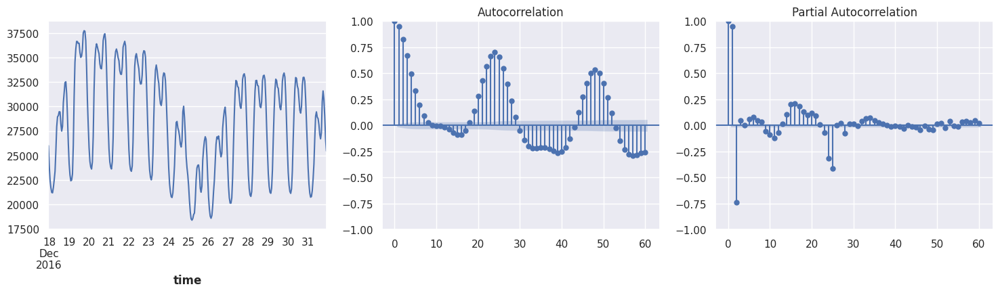

--- ADF Test Results for Original Series ---
Test Statistic                -1.559068e+01
p-value                        1.881890e-28
#Lags Used                     4.400000e+01
Number of Observations Used    1.747500e+04
Critical Value (1%)           -3.430724e+00
Critical Value (5%)           -2.861705e+00
Critical Value (10%)          -2.566858e+00
dtype: float64

Conclusion: We reject H0. The series IS STATIONARY.

KPSS Test: Level Stationarity
Test Statistic:         0.1794
P-value:                0.1000
Lags Used:              55
Critical Value (10%):  0.3470
Critical Value (5%):  0.4630
Critical Value (2.5%):  0.5740
Critical Value (1%):  0.7390

KPSS Conclusion: We cannot reject H0. The series IS STATIONARY.


In [269]:
fig, axes = plt.subplots(1, 3, figsize=(18, 4))
y_train[-24*7*2:].plot(ax=axes[0])
plot_acf(y_train, ax=axes[1], lags=60)
plot_pacf(y_train, ax=axes[2], lags=60)
plt.savefig('../report/figures/target_ACF_PACF.png', dpi=80)
plt.show()

test_stationarity(y_train, ct=False, title="for Original Series")

<span style="color: darkblue;">The series is already stationary, so we will apply auto-arima with `d = 0`, because the trend seems to be horizontal, and `D = 1`, because we have a 24h seasonality.</span>

## 5.2 SARIMA

<span style="color: darkblue;">We had to reduce train set length to 28 days because `auto-arima` got stuck (PC freezes due to RAM overflow) with larger sizes.</span>

<span style="color: darkblue;">Even if we could finally use `auto_arima`, too much RAM memory was still in use. So, we decided to take the employed code and obtained results and paste them here below, as markdown text. As we use `auto_arima` with exploratory purposes, this doesn't affect the pipeline.</span>


```python
import pmdarima as pm

# m = 24 due to daily seasonal pattern
auto_SARIMA = pm.auto_arima(y_train[-24*7*4:], 
                           start_p=0, start_q=0,
                           max_p=2, max_q=2, 
                           m=24,
                           start_P=0, start_Q=0,
                           max_P=2, max_Q=2,
                           seasonal=True,
                           d=0, D=1, 
                           trace=True,
                           error_action='ignore',  
                           suppress_warnings=True, 
                           stepwise=True,
                           random_state=SEED)

print("\n--- Best selected model summary ---")
print(auto_SARIMA.summary())
```
```text
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,1,0)[24] intercept   : AIC=12445.154, Time=0.07 sec
 ARIMA(1,0,0)(1,1,0)[24] intercept   : AIC=10999.854, Time=4.58 sec
 ARIMA(0,0,1)(0,1,1)[24] intercept   : AIC=inf, Time=3.44 sec
 ARIMA(0,0,0)(0,1,0)[24]             : AIC=12444.240, Time=0.10 sec
 ARIMA(1,0,0)(0,1,0)[24] intercept   : AIC=11096.244, Time=1.70 sec
 ARIMA(1,0,0)(2,1,0)[24] intercept   : AIC=10939.999, Time=11.63 sec
 ARIMA(1,0,0)(2,1,1)[24] intercept   : AIC=inf, Time=16.02 sec
 ARIMA(1,0,0)(1,1,1)[24] intercept   : AIC=10937.172, Time=4.90 sec
 ARIMA(1,0,0)(0,1,1)[24] intercept   : AIC=10935.483, Time=3.82 sec
 ARIMA(1,0,0)(0,1,2)[24] intercept   : AIC=10937.151, Time=15.37 sec
 ARIMA(1,0,0)(1,1,2)[24] intercept   : AIC=inf, Time=14.76 sec
 ARIMA(0,0,0)(0,1,1)[24] intercept   : AIC=12416.825, Time=1.16 sec
 ARIMA(2,0,0)(0,1,1)[24] intercept   : AIC=10780.351, Time=4.66 sec
 ARIMA(2,0,0)(0,1,0)[24] intercept   : AIC=10940.855, Time=0.90 sec
 ARIMA(2,0,0)(1,1,1)[24] intercept   : AIC=10781.649, Time=6.05 sec
 ARIMA(2,0,0)(0,1,2)[24] intercept   : AIC=10781.631, Time=15.66 sec
 ARIMA(2,0,0)(1,1,0)[24] intercept   : AIC=10849.308, Time=5.44 sec
 ARIMA(2,0,0)(1,1,2)[24] intercept   : AIC=inf, Time=17.99 sec
 ARIMA(2,0,1)(0,1,1)[24] intercept   : AIC=10767.707, Time=6.07 sec
 ARIMA(2,0,1)(0,1,0)[24] intercept   : AIC=10941.656, Time=0.88 sec
 ARIMA(2,0,1)(1,1,1)[24] intercept   : AIC=10770.441, Time=7.51 sec
 ARIMA(2,0,1)(0,1,2)[24] intercept   : AIC=10769.690, Time=18.23 sec
 ARIMA(2,0,1)(1,1,0)[24] intercept   : AIC=10842.760, Time=3.95 sec
 ARIMA(2,0,1)(1,1,2)[24] intercept   : AIC=inf, Time=17.60 sec
 ARIMA(1,0,1)(0,1,1)[24] intercept   : AIC=10789.192, Time=4.82 sec
 ARIMA(2,0,2)(0,1,1)[24] intercept   : AIC=10756.344, Time=5.87 sec
 ARIMA(2,0,2)(0,1,0)[24] intercept   : AIC=10935.916, Time=1.56 sec
 ARIMA(2,0,2)(1,1,1)[24] intercept   : AIC=10758.310, Time=7.68 sec
 ARIMA(2,0,2)(0,1,2)[24] intercept   : AIC=10758.329, Time=17.11 sec
 ARIMA(2,0,2)(1,1,0)[24] intercept   : AIC=10829.914, Time=4.96 sec
 ARIMA(2,0,2)(1,1,2)[24] intercept   : AIC=inf, Time=25.54 sec
 ARIMA(1,0,2)(0,1,1)[24] intercept   : AIC=10754.337, Time=6.19 sec
 ARIMA(1,0,2)(0,1,0)[24] intercept   : AIC=10934.158, Time=1.22 sec
 ARIMA(1,0,2)(1,1,1)[24] intercept   : AIC=10756.677, Time=4.84 sec
 ARIMA(1,0,2)(0,1,2)[24] intercept   : AIC=10756.693, Time=13.11 sec
 ARIMA(1,0,2)(1,1,0)[24] intercept   : AIC=10828.444, Time=3.95 sec
 ARIMA(1,0,2)(1,1,2)[24] intercept   : AIC=inf, Time=22.02 sec
 ARIMA(0,0,2)(0,1,1)[24] intercept   : AIC=11286.425, Time=7.07 sec
 ARIMA(1,0,2)(0,1,1)[24]             : AIC=10754.184, Time=4.98 sec
 ARIMA(1,0,2)(0,1,0)[24]             : AIC=10932.483, Time=0.67 sec
 ARIMA(1,0,2)(1,1,1)[24]             : AIC=10756.169, Time=5.96 sec
 ARIMA(1,0,2)(0,1,2)[24]             : AIC=10756.169, Time=14.31 sec
 ARIMA(1,0,2)(1,1,0)[24]             : AIC=10826.483, Time=2.47 sec
 ARIMA(1,0,2)(1,1,2)[24]             : AIC=inf, Time=24.58 sec
 ARIMA(0,0,2)(0,1,1)[24]             : AIC=11283.377, Time=7.99 sec
 ARIMA(1,0,1)(0,1,1)[24]             : AIC=10788.643, Time=3.29 sec
 ARIMA(2,0,2)(0,1,1)[24]             : AIC=10755.876, Time=6.26 sec
 ARIMA(0,0,1)(0,1,1)[24]             : AIC=11712.305, Time=3.03 sec
 ARIMA(2,0,1)(0,1,1)[24]             : AIC=10767.586, Time=4.19 sec

Best model:  ARIMA(1,0,2)(0,1,1)[24]          
Total fit time: 386.207 seconds

--- Best selected model summary ---
                                      SARIMAX Results                                       
============================================================================================
Dep. Variable:                                    y   No. Observations:                  672
Model:             SARIMAX(1, 0, 2)x(0, 1, [1], 24)   Log Likelihood               -5372.092
Date:                              Sat, 11 Apr 2026   AIC                          10754.184
Time:                                      19:52:16   BIC                          10776.553
Sample:                                  12-03-2016   HQIC                         10762.861
                                       - 12-31-2016                                         
Covariance Type:                                opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8778      0.007    131.492      0.000       0.865       0.891
ma.L1          0.6636      0.012     53.999      0.000       0.640       0.688
ma.L2          0.3208      0.019     16.852      0.000       0.283       0.358
ma.S.L24      -0.7189      0.020    -36.764      0.000      -0.757      -0.681
sigma2        6.7e+05   2.12e+04     31.533      0.000    6.28e+05    7.12e+05
===================================================================================
Ljung-Box (L1) (Q):                  12.26   Jarque-Bera (JB):            111568.54
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               0.10   Skew:                            -3.43
Prob(H) (two-sided):                  0.00   Kurtosis:                        66.92
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
```

<span style="color: darkblue;">All coefficients are statistically significant, but Ljung-Box test indicates that residuals are still correlated and Jarque-Bera states that they don't follow a normal distribution. This means that SARIMA didn't capture all the series' dynamics and we can't generate exact confidence intervals. However, we can still use it as a baseline.</span>

<span style="color: darkblue;">Now, before evaluating the model, we will follow the widely used ML practise of refitting the model with train plus validation set. As for training `auto_arima` we have used the last 28 days long window, we will use the same amount of data for the refit (so, we will only need validation set for refitting).</span>

In [270]:
import statsmodels.api as sm


sarima = sm.tsa.SARIMAX(
    y_val[-24*7*4:],
    order=(1, 0, 2),
    seasonal_order=(0, 1, 1, 24),
    trend='n',  # no intercept
    enforce_stationarity=False,
    enforce_invertibility=False
)


sarima_results = sarima.fit(disp=False)
print(sarima_results.summary())

                                      SARIMAX Results                                       
Dep. Variable:                    total load actual   No. Observations:                  672
Model:             SARIMAX(1, 0, 2)x(0, 1, [1], 24)   Log Likelihood               -4900.510
Date:                              Mon, 13 Apr 2026   AIC                           9811.020
Time:                                      09:33:36   BIC                           9833.177
Sample:                                  12-03-2017   HQIC                          9819.632
                                       - 12-31-2017                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9569      0.011     84.710      0.000       0.935       0.979
ma.L1          0.60

<span style="color: darkblue;">Coefficients still are significant and Jarque-Bera still rejects normality, but this time Ljung-Box states that residuals aren't correlated. At first sight, this is better, but we don't expect this SARIMA to generalize too well.</span>

In [271]:
y_test = test_df['total load actual']
y_pred_sarima = sarima_results.get_forecast(steps=len(y_test)).predicted_mean

rmse_sarima = np.sqrt(mean_squared_error(y_test, y_pred_sarima))
mae_sarima = mean_absolute_error(y_test, y_pred_sarima)
mape_sarima = mean_absolute_percentage_error(y_test, y_pred_sarima)

print(f"--- Predictive Performance Metrics ---")
print(f"RMSE (Root Mean Squared Error): {rmse_sarima:.2f}")
print(f"MAE (Mean Absolute Error):      {mae_sarima:.2f}")
print(f"MAPE (Mean Absolute Pct Error): {mape_sarima*100:.2f}")

--- Predictive Performance Metrics ---
RMSE (Root Mean Squared Error): 5005.39
MAE (Mean Absolute Error):      4135.67
MAPE (Mean Absolute Pct Error): 13.63


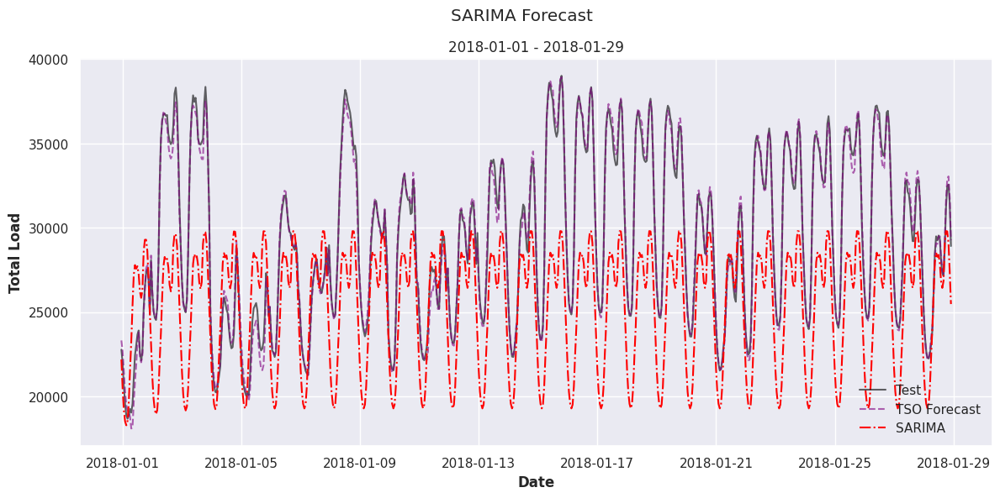

In [272]:
plt.figure(figsize=(14, 6))
plt.plot(y_test.index[:24*7*4], y_test[:24*7*4], label='Test', color='black', alpha=0.6)
plt.plot(y_test.index[:24*7*4], y_pred_TSO[:24*7*4], label='TSO Forecast', color='purple', linestyle='--', alpha=0.6)
plt.plot(y_test.index[:24*7*4], y_pred_sarima[:24*7*4], label='SARIMA', color='red', linestyle='-.')

plt.suptitle('SARIMA Forecast')
plt.title('2018-01-01 - 2018-01-29')
plt.xlabel('Date')
plt.ylabel('Total Load')
plt.legend()
plt.savefig('../report/figures/SARIMA_forecast.png', dpi=80)
plt.show()

<span style="color: darkblue;">As we have predicted, the error of this SARIMA is really high compared to the TSO Forecast. However, we can still use it as a solid baseline.</span>

| Model                     | RMSE  | MAE   | MAPE (%) |
|---------------------------|-------|-------|----------|
| TSO Forecast                    | 389.32 | 269.85 | 0.93 |
| SARIMA                    | 5005.39 | 4135.67 | 13.63 |

## 5.3 SARIMAX

<span style="color: darkblue;">Now we will try to improve previous results by adding exogenous covariates. We will use the same parameters as before and we will analyze which set of source datasets is the best by computing the RMSE over validation set.</span>

In [273]:
train_df = train_df.astype(float)
val_df = val_df.astype(float)
test_df = test_df.astype(float)

In [274]:
# Target
TARGET = 'total load actual'

# --- Exog blocks ---
BLOCKS = {
    "none": None,
    
    "calendar": [
        'is_weekend', 'is_national_holiday',
        'day_sin', 'day_cos',
        'month_sin', 'month_cos',
        'year_normalized'
    ],

    "weather": [c for c in whole_df.columns if any(
        kw in c for kw in [
            '_temp', '_humidity', '_wind_', '_clouds_',
            '_weather_good', '_weather_mid', '_weather_bad'
        ]
    )],

    "generation": [c for c in whole_df.columns if c.startswith('generation')],

    "macro": [
        'eurusd_close_shift24h',
        'ttf_gas_eur_shift24h',
        'brent_close_eur_shift24h'
    ],

    "events": [
        'is_top_liga_match',
        'is_national_team_match'
    ]
}

In [275]:
def fit_eval_sarimax(
    y_tr, y_va,
    X_train=None, X_val=None,
    order=(1, 0, 2),
    seasonal_order=(0, 1, 1, 24)
):
    model = sm.tsa.SARIMAX(
        y_tr,
        exog=X_train,
        order=order,
        seasonal_order=seasonal_order,
        trend='n',  # no intercept
        enforce_stationarity=False,
        enforce_invertibility=False
    )

    res = model.fit(disp=False)

    y_pred = res.forecast(
        steps=len(y_va),
        exog=X_val
    )

    rmse = np.sqrt(mean_squared_error(y_va, y_pred))
    return rmse

In [276]:
TRAIN_LEN = 24*7*4

results_list = []

for name, cols in BLOCKS.items():

    if name != "none":
        X_tr = train_df[cols][-TRAIN_LEN:]
        X_va = val_df[cols]
    else:
        X_tr = None
        X_va = None

    rmse = fit_eval_sarimax(
        y_train[-TRAIN_LEN:], y_val,
        X_train=X_tr,
        X_val=X_va
    )

    results_list.append({
        "model": f"SARIMAX + {name}",
        "blocks": name,
        "rmse_val": rmse
    })

    print(f"{name:>12} | RMSE (val): {rmse:.2f}")

        none | RMSE (val): 3729.31
    calendar | RMSE (val): 3545.46
     weather | RMSE (val): 5452.07
  generation | RMSE (val): 4780.61
       macro | RMSE (val): 14152.41
      events | RMSE (val): 3729.78


In [277]:
results_df = pd.DataFrame(results_list).sort_values("rmse_val")
results_df

,model,blocks,rmse_val
1,SARIMAX + calendar,calendar,3545.462565
0,SARIMAX + none,none,3729.306695
5,SARIMAX + events,events,3729.779596
3,SARIMAX + generation,generation,4780.610865
2,SARIMAX + weather,weather,5452.069208
4,SARIMAX + macro,macro,14152.413577


<span style="color: darkblue;">We can see how calendar covariates improve the forecast while sport event related ones get almost the same results (because maybe there isn't any relevant sport event in the training period). The rest of the covariates seem to confuse the model.</span>

<span style="color: darkblue;">As previous SARIMA, we will refit this model with the validation set and compute the metrics with the test set.</span>

In [278]:
sarimax = sm.tsa.SARIMAX(
    y_val[-24*7*4:],
    exog=val_df[BLOCKS["calendar"]][-TRAIN_LEN:].astype(float),
    order=(1, 0, 2),
    seasonal_order=(0, 1, 1, 24),
    trend='n',  # no intercept
    enforce_stationarity=False,
    enforce_invertibility=False
)


sarimax_results = sarimax.fit(disp=False)
print(sarimax_results.summary())

                                      SARIMAX Results                                       
Dep. Variable:                    total load actual   No. Observations:                  672
Model:             SARIMAX(1, 0, 2)x(0, 1, [1], 24)   Log Likelihood               -4954.746
Date:                              Mon, 13 Apr 2026   AIC                           9933.492
Time:                                      09:35:55   BIC                           9986.668
Sample:                                  12-03-2017   HQIC                          9954.160
                                       - 12-31-2017                                         
Covariance Type:                                opg                                         
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
is_weekend            330.7619    141.319      2.341      0.019      53.782     

In [279]:
y_pred_sarimax = sarimax_results.get_forecast(
    steps=len(y_test),
    exog=test_df[BLOCKS["calendar"]].astype(float)
).predicted_mean

rmse_sarimax = np.sqrt(mean_squared_error(y_test, y_pred_sarimax))
mae_sarimax = mean_absolute_error(y_test, y_pred_sarimax)
mape_sarimax = mean_absolute_percentage_error(y_test, y_pred_sarimax)

print(f"--- Predictive Performance Metrics ---")
print(f"RMSE (Root Mean Squared Error): {rmse_sarimax:.2f}")
print(f"MAE (Mean Absolute Error):      {mae_sarimax:.2f}")
print(f"MAPE (Mean Absolute Pct Error): {mape_sarimax*100:.2f}")

--- Predictive Performance Metrics ---
RMSE (Root Mean Squared Error): 8052.27
MAE (Mean Absolute Error):      7317.60
MAPE (Mean Absolute Pct Error): 24.63


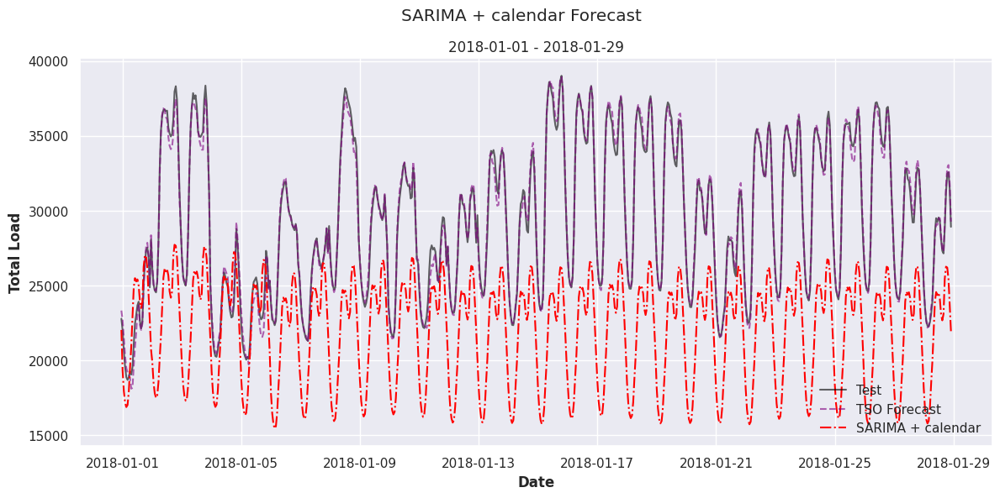

In [280]:
plt.figure(figsize=(14, 6))
plt.plot(y_test.index[:24*7*4], y_test[:24*7*4], label='Test', color='black', alpha=0.6)
plt.plot(y_test.index[:24*7*4], y_pred_TSO[:24*7*4], label='TSO Forecast', color='purple', linestyle='--', alpha=0.6)
plt.plot(y_test.index[:24*7*4], y_pred_sarimax[:24*7*4], label='SARIMA + calendar', color='red', linestyle='-.')

plt.suptitle('SARIMA + calendar Forecast')
plt.title('2018-01-01 - 2018-01-29')
plt.xlabel('Date')
plt.ylabel('Total Load')
plt.legend()
plt.savefig('../report/figures/SARIMAX_forecast.png', dpi=80)
plt.show()

<span style="color: darkblue;">Although the addition of calendar covariates improved the results on validation set, we can see that, after refitting the model, the performance decays on the test set. We suspect this can be because of a kind of overfitting over the calendar covariates, due to the small size of training days (only 28).</span>

| Model                     | RMSE  | MAE   | MAPE (%) |
|---------------------------|-------|-------|----------|
| TSO Forecast                    | 389.32 | 269.85 | 0.93 |
| SARIMA                    | 5005.39 | 4135.67 | 13.63 |
| SARIMAX (SARIMA + Calendar) | 6642.89 | 5780.29 | 19.23 |

# 6. ML Models
<span style="color: darkblue;">Now we will try to solve the problem from a ML approach. To do so, we will try two different models: Prophet and XGBoost. Prophet is the next logical evolution from stadistical models towards ML models, and XGBoost is a powerfull tree-based model that is robust to collinearity (which we already have introduced by adding exogenous covariates and we will add even more when introducing lag features).</span>

## 6.1 Prophet

<span style="color: darkblue;">We will train Prophet in different steps.</span>

<span style="color: darkblue;">First of all, we will search for the best hyperparameters and we will fix them. After that, we will study which exogenous covariates sets benefit more to Prophet. And finally, we will refit the model on train + val sets.</span>

In [281]:
from prophet import Prophet
import itertools

# -----------------------------
# PROPHET TRAIN DATAFRAME
# -----------------------------
df_prophet_train = pd.DataFrame({
    'ds': train_df.index.tz_localize(None),
    'y':  y_train.values
})

# -----------------------------
# PREPARE VALIDATION DATA
# -----------------------------
df_prophet_val = pd.DataFrame({
    'ds': val_df.index.tz_localize(None)
})

# -----------------------------
# HYPERPARAMETER GRID
# -----------------------------
param_grid = {
    'changepoint_prior_scale': [0.01, 0.05, 0.1],
    'seasonality_prior_scale': [0.1, 1.0, 10.0],
    'seasonality_mode': ['additive', 'multiplicative']
}

all_params = [
    dict(zip(param_grid.keys(), v))
    for v in itertools.product(*param_grid.values())
]

results = []

# -----------------------------
# GRID SEARCH
# -----------------------------
for params in all_params:
    model = Prophet(
        yearly_seasonality=True,
        weekly_seasonality=True,
        daily_seasonality=True,
        **params
    )

    model.fit(df_prophet_train)

    forecast_val = model.predict(df_prophet_val)
    y_pred = forecast_val['yhat'].values
    y_true = y_val.values

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))

    results.append({
        **params,
        'rmse_val': rmse
    })

    print(f"{params} -> RMSE(val): {rmse:.2f}")

09:35:58 - cmdstanpy - INFO - Chain [1] start processing
09:35:59 - cmdstanpy - INFO - Chain [1] done processing


{'changepoint_prior_scale': 0.01, 'seasonality_prior_scale': 0.1, 'seasonality_mode': 'additive'} -> RMSE(val): 2921.54


09:36:03 - cmdstanpy - INFO - Chain [1] start processing
09:36:04 - cmdstanpy - INFO - Chain [1] done processing


{'changepoint_prior_scale': 0.01, 'seasonality_prior_scale': 0.1, 'seasonality_mode': 'multiplicative'} -> RMSE(val): 3150.50


09:36:08 - cmdstanpy - INFO - Chain [1] start processing
09:36:09 - cmdstanpy - INFO - Chain [1] done processing


{'changepoint_prior_scale': 0.01, 'seasonality_prior_scale': 1.0, 'seasonality_mode': 'additive'} -> RMSE(val): 2921.45


09:36:13 - cmdstanpy - INFO - Chain [1] start processing
09:36:14 - cmdstanpy - INFO - Chain [1] done processing


{'changepoint_prior_scale': 0.01, 'seasonality_prior_scale': 1.0, 'seasonality_mode': 'multiplicative'} -> RMSE(val): 3135.31


09:36:17 - cmdstanpy - INFO - Chain [1] start processing
09:36:18 - cmdstanpy - INFO - Chain [1] done processing


{'changepoint_prior_scale': 0.01, 'seasonality_prior_scale': 10.0, 'seasonality_mode': 'additive'} -> RMSE(val): 2915.36


09:36:22 - cmdstanpy - INFO - Chain [1] start processing
09:36:23 - cmdstanpy - INFO - Chain [1] done processing


{'changepoint_prior_scale': 0.01, 'seasonality_prior_scale': 10.0, 'seasonality_mode': 'multiplicative'} -> RMSE(val): 3135.01


09:36:26 - cmdstanpy - INFO - Chain [1] start processing
09:36:28 - cmdstanpy - INFO - Chain [1] done processing


{'changepoint_prior_scale': 0.05, 'seasonality_prior_scale': 0.1, 'seasonality_mode': 'additive'} -> RMSE(val): 3557.00


09:36:32 - cmdstanpy - INFO - Chain [1] start processing
09:36:36 - cmdstanpy - INFO - Chain [1] done processing


{'changepoint_prior_scale': 0.05, 'seasonality_prior_scale': 0.1, 'seasonality_mode': 'multiplicative'} -> RMSE(val): 6926.92


09:36:40 - cmdstanpy - INFO - Chain [1] start processing
09:36:42 - cmdstanpy - INFO - Chain [1] done processing


{'changepoint_prior_scale': 0.05, 'seasonality_prior_scale': 1.0, 'seasonality_mode': 'additive'} -> RMSE(val): 3563.70


09:36:47 - cmdstanpy - INFO - Chain [1] start processing
09:36:50 - cmdstanpy - INFO - Chain [1] done processing


{'changepoint_prior_scale': 0.05, 'seasonality_prior_scale': 1.0, 'seasonality_mode': 'multiplicative'} -> RMSE(val): 6521.22


09:36:53 - cmdstanpy - INFO - Chain [1] start processing
09:36:55 - cmdstanpy - INFO - Chain [1] done processing


{'changepoint_prior_scale': 0.05, 'seasonality_prior_scale': 10.0, 'seasonality_mode': 'additive'} -> RMSE(val): 3416.11


09:36:58 - cmdstanpy - INFO - Chain [1] start processing
09:37:02 - cmdstanpy - INFO - Chain [1] done processing


{'changepoint_prior_scale': 0.05, 'seasonality_prior_scale': 10.0, 'seasonality_mode': 'multiplicative'} -> RMSE(val): 6612.16


09:37:06 - cmdstanpy - INFO - Chain [1] start processing
09:37:11 - cmdstanpy - INFO - Chain [1] done processing


{'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 0.1, 'seasonality_mode': 'additive'} -> RMSE(val): 4999.88


09:37:15 - cmdstanpy - INFO - Chain [1] start processing
09:37:22 - cmdstanpy - INFO - Chain [1] done processing


{'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 0.1, 'seasonality_mode': 'multiplicative'} -> RMSE(val): 9137.95


09:37:26 - cmdstanpy - INFO - Chain [1] start processing
09:37:31 - cmdstanpy - INFO - Chain [1] done processing


{'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 1.0, 'seasonality_mode': 'additive'} -> RMSE(val): 4876.58


09:37:34 - cmdstanpy - INFO - Chain [1] start processing
09:37:38 - cmdstanpy - INFO - Chain [1] done processing


{'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 1.0, 'seasonality_mode': 'multiplicative'} -> RMSE(val): 9381.86


09:37:42 - cmdstanpy - INFO - Chain [1] start processing
09:37:50 - cmdstanpy - INFO - Chain [1] done processing


{'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 10.0, 'seasonality_mode': 'additive'} -> RMSE(val): 5613.98


09:37:54 - cmdstanpy - INFO - Chain [1] start processing
09:37:58 - cmdstanpy - INFO - Chain [1] done processing


{'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 10.0, 'seasonality_mode': 'multiplicative'} -> RMSE(val): 9544.09


In [282]:
results_df = pd.DataFrame(results).sort_values("rmse_val")
results_df.head()

,changepoint_prior_scale,seasonality_prior_scale,seasonality_mode,rmse_val
4,0.01,10.0,additive,2915.355894
2,0.01,1.0,additive,2921.446292
0,0.01,0.1,additive,2921.541552
5,0.01,10.0,multiplicative,3135.012291
3,0.01,1.0,multiplicative,3135.307175


<span style="color: darkblue;">Additive models outperform multiplicative ones. That makes sense since the time series has a constant variance.</span>

<span style="color: darkblue;">When testing exogenous covariates on SARIMA, we found that calendar variables where the most usefuls. We won't waste time on testing every covariates combinations and we will only try small sets pivoting around calendar.</span>

In [283]:
# -----------------------------
# FIXED PROPHET HYPERPARAMETERS
# -----------------------------
BEST_PROPHET_PARAMS = {
    'changepoint_prior_scale': 0.01,
    'seasonality_prior_scale': 10.0,
    'seasonality_mode': 'additive'
}

# -----------------------------
# DEFINE EXOGENOUS BLOCKS
# -----------------------------
EXOG_BLOCKS = {
    "none": [],

    "calendar": [
        'is_weekend',
        'is_national_holiday',
        'day_sin', 'day_cos',
        'month_sin', 'month_cos',
        'year_normalized'
    ],

    "calendar_weather": (
        [
            'is_weekend',
            'is_national_holiday',
            'day_sin', 'day_cos',
            'month_sin', 'month_cos',
            'year_normalized'
        ]
        +
        [c for c in whole_df.columns if any(
            kw in c for kw in [
                '_temp', '_humidity', '_wind_', '_clouds_',
                '_weather_good', '_weather_mid', '_weather_bad'
            ]
        )]
    ),

    "calendar_generation": (
        [
            'is_weekend',
            'is_national_holiday',
            'day_sin', 'day_cos',
            'month_sin', 'month_cos',
            'year_normalized'
        ]
        +
        [c for c in whole_df.columns if c.startswith('generation')]
    ),

    "calendar_events": (
        [
            'is_weekend',
            'is_national_holiday',
            'day_sin', 'day_cos',
            'month_sin', 'month_cos',
            'year_normalized'
        ]
        +
        [
            'is_top_liga_match',
            'is_national_team_match'
        ]
    ),

    "calendar_macro": (
        [
            'is_weekend',
            'is_national_holiday',
            'day_sin', 'day_cos',
            'month_sin', 'month_cos',
            'year_normalized'
        ]
        +
        [
            'eurusd_close_shift24h',
            'ttf_gas_eur_shift24h',
            'brent_close_eur_shift24h'
        ]
    )
}

# -----------------------------
# BASE PROPHET TRAIN DATAFRAME
# -----------------------------
df_prophet_train_base = pd.DataFrame({
    'ds': y_train.index.tz_localize(None),
    'y':  y_train.values
})

df_prophet_val_base = pd.DataFrame({
    'ds': y_val.index.tz_localize(None)
})

# -----------------------------
# EXOGENOUS BLOCK EVALUATION
# -----------------------------
results = []

for block_name, exog_cols in EXOG_BLOCKS.items():

    # Copy base dataframes
    df_train = df_prophet_train_base.copy()
    df_val   = df_prophet_val_base.copy()

    # Add exogenous variables if any
    for col in exog_cols:
        df_train[col] = train_df[col].values
        df_val[col]   = val_df[col].values

    # Define Prophet model
    model = Prophet(
        yearly_seasonality=True,
        weekly_seasonality=True,
        daily_seasonality=True,
        **BEST_PROPHET_PARAMS
    )

    # Add regressors
    for col in exog_cols:
        model.add_regressor(col)

    # Fit model
    model.fit(df_train)

    # Forecast validation
    forecast_val = model.predict(df_val)

    y_pred = forecast_val['yhat'].values
    y_true = y_val.values

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))

    results.append({
        'exog_block': block_name,
        'n_exog': len(exog_cols),
        'rmse_val': rmse
    })

    print(f"{block_name:>20} | RMSE (val): {rmse:.2f}")

# -----------------------------
# RESULTS SUMMARY
# -----------------------------
results_df = pd.DataFrame(results).sort_values('rmse_val')
results_df

09:38:02 - cmdstanpy - INFO - Chain [1] start processing
09:38:03 - cmdstanpy - INFO - Chain [1] done processing


                none | RMSE (val): 2915.36


09:38:07 - cmdstanpy - INFO - Chain [1] start processing
09:38:08 - cmdstanpy - INFO - Chain [1] done processing


            calendar | RMSE (val): 2977.15


09:38:14 - cmdstanpy - INFO - Chain [1] start processing
09:38:19 - cmdstanpy - INFO - Chain [1] done processing


    calendar_weather | RMSE (val): 3026.60


09:38:24 - cmdstanpy - INFO - Chain [1] start processing
09:38:25 - cmdstanpy - INFO - Chain [1] done processing


 calendar_generation | RMSE (val): 2727.80


09:38:29 - cmdstanpy - INFO - Chain [1] start processing
09:38:31 - cmdstanpy - INFO - Chain [1] done processing


     calendar_events | RMSE (val): 2939.42


09:38:35 - cmdstanpy - INFO - Chain [1] start processing
09:38:37 - cmdstanpy - INFO - Chain [1] done processing


      calendar_macro | RMSE (val): 2841.35


,exog_block,n_exog,rmse_val
3,calendar_generation,21,2727.801497
5,calendar_macro,10,2841.352214
0,none,0,2915.355894
4,calendar_events,9,2939.418914
1,calendar,7,2977.151351
2,calendar_weather,62,3026.598747


<span style="color: darkblue;">It seems that energy generation related variables are meaningful this time, so we will repeat the experiment by focusing on this set.</span>

In [284]:
# -----------------------------
# FIXED PROPHET HYPERPARAMETERS
# -----------------------------
BEST_PROPHET_PARAMS = {
    'changepoint_prior_scale': 0.01,
    'seasonality_prior_scale': 10.0,
    'seasonality_mode': 'additive'
}

# -----------------------------
# DEFINE EXOGENOUS BLOCKS (generation as pivot)
# -----------------------------
GEN_BASE = [c for c in whole_df.columns if c.startswith('generation')]

EXOG_BLOCKS = {
    "generation": GEN_BASE,

    "generation_calendar": (
        GEN_BASE
        +
        [
            'is_weekend',
            'is_national_holiday',
            'day_sin', 'day_cos',
            'month_sin', 'month_cos',
            'year_normalized'
        ]
    ),

    "generation_macro": (
        GEN_BASE
        +
        [
            'eurusd_close_shift24h',
            'ttf_gas_eur_shift24h',
            'brent_close_eur_shift24h'
        ]
    ),

    "generation_events": (
        GEN_BASE
        +
        [
            'is_top_liga_match',
            'is_national_team_match'
        ]
    ),

    "generation_weather": (
        GEN_BASE
        +
        [c for c in whole_df.columns if any(
            kw in c for kw in [
                '_temp', '_humidity', '_wind_', '_clouds_',
                '_weather_good', '_weather_mid', '_weather_bad'
            ]
        )]
    )
}

# -----------------------------
# BASE PROPHET TRAIN DATAFRAME
# -----------------------------
df_prophet_train_base = pd.DataFrame({
    'ds': y_train.index.tz_localize(None),
    'y':  y_train.values
})

df_prophet_val_base = pd.DataFrame({
    'ds': y_val.index.tz_localize(None)
})

# -----------------------------
# EXOGENOUS BLOCK EVALUATION
# -----------------------------
results = []

for block_name, exog_cols in EXOG_BLOCKS.items():

    # Copy base dataframes
    df_train = df_prophet_train_base.copy()
    df_val   = df_prophet_val_base.copy()

    # Add exogenous variables if any
    for col in exog_cols:
        df_train[col] = train_df[col].values
        df_val[col]   = val_df[col].values

    # Define Prophet model
    model = Prophet(
        yearly_seasonality=True,
        weekly_seasonality=True,
        daily_seasonality=True,
        **BEST_PROPHET_PARAMS
    )

    # Add regressors
    for col in exog_cols:
        model.add_regressor(col)

    # Fit model
    model.fit(df_train)

    # Forecast validation
    forecast_val = model.predict(df_val)

    y_pred = forecast_val['yhat'].values
    y_true = y_val.values

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))

    results.append({
        'exog_block': block_name,
        'n_exog': len(exog_cols),
        'rmse_val': rmse
    })

    print(f"{block_name:>20} | RMSE (val): {rmse:.2f}")

# -----------------------------
# RESULTS SUMMARY
# -----------------------------
results_df = pd.DataFrame(results).sort_values('rmse_val')
results_df

09:38:41 - cmdstanpy - INFO - Chain [1] start processing
09:38:43 - cmdstanpy - INFO - Chain [1] done processing


          generation | RMSE (val): 2736.90


09:38:47 - cmdstanpy - INFO - Chain [1] start processing
09:38:49 - cmdstanpy - INFO - Chain [1] done processing


 generation_calendar | RMSE (val): 2720.44


09:38:53 - cmdstanpy - INFO - Chain [1] start processing
09:38:55 - cmdstanpy - INFO - Chain [1] done processing


    generation_macro | RMSE (val): 2723.23


09:38:59 - cmdstanpy - INFO - Chain [1] start processing
09:39:03 - cmdstanpy - INFO - Chain [1] done processing


   generation_events | RMSE (val): 2733.94


09:39:09 - cmdstanpy - INFO - Chain [1] start processing
09:39:16 - cmdstanpy - INFO - Chain [1] done processing


  generation_weather | RMSE (val): 2826.09


,exog_block,n_exog,rmse_val
1,generation_calendar,21,2720.440977
2,generation_macro,17,2723.225989
3,generation_events,16,2733.936520
0,generation,14,2736.904801
4,generation_weather,69,2826.088655


<span style="color: darkblue;">The winning set is the same as before. Now we will refit on train + val.</span>

In [285]:
# -----------------------------
# SELECT FINAL EXOG BLOCK
# -----------------------------
FINAL_EXOG = (
    [c for c in whole_df.columns if c.startswith('generation')]
    +
    [
        'is_weekend',
        'is_national_holiday',
        'day_sin', 'day_cos',
        'month_sin', 'month_cos',
        'year_normalized'
    ]
)

# -----------------------------
# FIXED PROPHET HYPERPARAMETERS
# -----------------------------
BEST_PROPHET_PARAMS = {
    'changepoint_prior_scale': 0.01,
    'seasonality_prior_scale': 1.0,
    'seasonality_mode': 'additive'
}

# -----------------------------
# BUILD TRAIN + VAL DATAFRAME
# -----------------------------
df_prophet_trainval = pd.DataFrame({
    'ds': pd.concat([train_df, val_df]).index.tz_localize(None),
    'y':  pd.concat([y_train, y_val]).values
})

for col in FINAL_EXOG:
    df_prophet_trainval[col] = pd.concat([train_df[col], val_df[col]]).values

# -----------------------------
# FIT FINAL PROPHET MODEL
# -----------------------------
final_prophet = Prophet(
    yearly_seasonality=True,
    weekly_seasonality=True,
    daily_seasonality=True,
    **BEST_PROPHET_PARAMS
)

for col in FINAL_EXOG:
    final_prophet.add_regressor(col)

final_prophet.fit(df_prophet_trainval)

# -----------------------------
# PREPARE TEST DATA
# -----------------------------
df_prophet_test = pd.DataFrame({
    'ds': test_df.index.tz_localize(None)
})

for col in FINAL_EXOG:
    df_prophet_test[col] = test_df[col].values

# -----------------------------
# FORECAST TEST
# -----------------------------
forecast_test = final_prophet.predict(df_prophet_test)

y_pred_test = forecast_test['yhat'].values
y_true_test = test_df['total load actual'].values

# -----------------------------
# EVALUATION METRICS
# -----------------------------
rmse = np.sqrt(mean_squared_error(y_true_test, y_pred_test))
mae  = mean_absolute_error(y_true_test, y_pred_test)
mape = mean_absolute_percentage_error(y_true_test, y_pred_test)

print("--- Prophet (generation + calendar) | Test performance ---")
print(f"RMSE:  {rmse:.2f}")
print(f"MAE:   {mae:.2f}")
print(f"MAPE:  {mape*100:.2f}%")

09:39:22 - cmdstanpy - INFO - Chain [1] start processing
09:39:25 - cmdstanpy - INFO - Chain [1] done processing


--- Prophet (generation + calendar) | Test performance ---
RMSE:  2645.50
MAE:   1973.55
MAPE:  6.96%


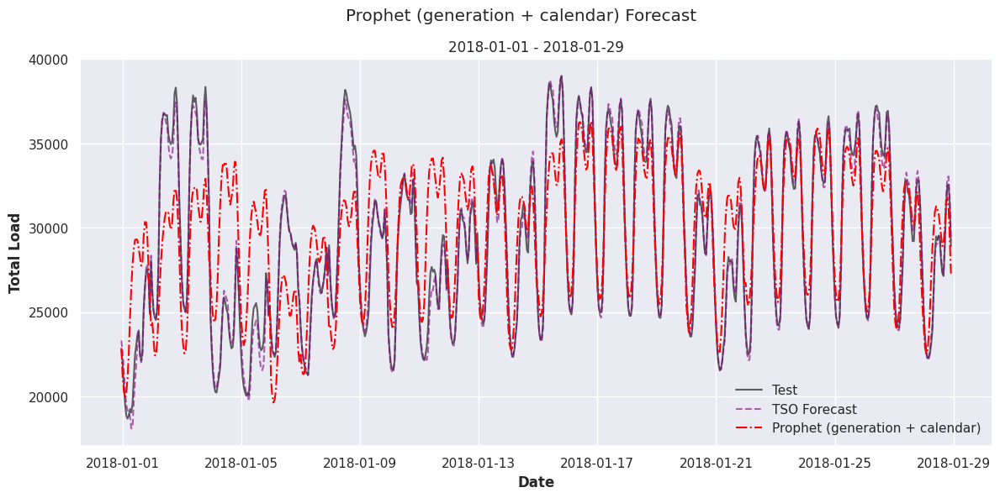

In [286]:
plt.figure(figsize=(14, 6))
plt.plot(y_test.index[:24*7*4], y_test[:24*7*4], label='Test', color='black', alpha=0.6)
plt.plot(y_test.index[:24*7*4], y_pred_TSO[:24*7*4], label='TSO Forecast', color='purple', linestyle='--', alpha=0.6)
plt.plot(y_test.index[:24*7*4], y_pred_test[:24*7*4], label='Prophet (generation + calendar)', color='red', linestyle='-.')

plt.suptitle('Prophet (generation + calendar) Forecast')
plt.title('2018-01-01 - 2018-01-29')
plt.xlabel('Date')
plt.ylabel('Total Load')
plt.legend()
plt.savefig('../report/figures/Prophet_forecast.png', dpi=80)
plt.show()

<span style="color: darkblue;">Even if we still are far from beating TSO forecast, the results obtained from Prophet are way better than SARIMA/SARIMAX results. This time the whole train and validation data was used to fit the model, which prevented the model from overfitting. Additionally, some exogenous covariates, like calendar and energy related ones, probed to be helpful. However, Prophet is still unable of taking advantage from other covariates like climatic ones, which are known to be useful for this kind of forecasting problem.</span>

| Model                     | RMSE  | MAE   | MAPE (%) |
|---------------------------|-------|-------|----------|
| TSO Forecast                    | 389.32 | 269.85 | 0.93 |
| SARIMA                    | 5005.39 | 4135.67 | 13.63 |
| SARIMAX (SARIMA + Calendar) | 6642.89 | 5780.29 | 19.23 |
| Prophet (Generation + Calendar) | 2645.61 | 1973.74 | 6.96% |

## 6.2 XGBoost

<span style="color: darkblue;">We need to perform some feature engineering in order to insert temporal context and trend behaviour to the XGBoost model. We will do it by computing lag and rolling features. These features aim to capture short-term, daily and weekly trends.</span>

<span style="color: darkblue;">In order to prevent a dimensionality explosion on the first try, we won't compute lag and rolling features for the exogenous covariates.</span>

In [287]:
def create_ml_features(df, target_col, 
                       lags=None, 
                       rolling_windows=None, 
                       rolling_funcs=['mean', 'std']):
    """
    Complete feature engineering pipeline for ML-based time series forecasting.
    
    Parameters
    ----------
    df : pd.DataFrame
        DataFrame with DatetimeIndex and target column
    target_col : str
        Name of target variable
    lags : list of int, optional
        Lag values to create
    rolling_windows : list of int, optional
        Window sizes for rolling statistics
    rolling_funcs : list of str
        Aggregation functions for rolling windows
        
    Returns
    -------
    pd.DataFrame
        DataFrame with all features
    """
    result = df.copy()
    
    # 1. Lag features
    if lags is not None:
        for lag in lags:
            result[f'{target_col} lag{lag}'] = result[target_col].shift(lag)
    
    # 2. Rolling features
    if rolling_windows is not None:
        # We shift by 1 to ensure no leakage (using past data only)
        shifted_target = result[target_col].shift(1)
        for window in rolling_windows:
            for func in rolling_funcs:
                col_name = f'{target_col} rolling_{func}_{window}'
                if func == 'mean':
                    result[col_name] = shifted_target.rolling(window).mean()
                elif func == 'std':
                    result[col_name] = shifted_target.rolling(window).std()
                elif func == 'min':
                    result[col_name] = shifted_target.rolling(window).min()
                elif func == 'max':
                    result[col_name] = shifted_target.rolling(window).max()
    
    return result

# Apply complete feature engineering
df_features = create_ml_features(
    whole_df, 
    target_col='total load actual',
    lags=[1, 2, 3, 24, 48, 24*7],           # Include seasonal lag
    rolling_windows=[24, 24*7],      # Multiple windows
    rolling_funcs=['mean', 'std', 'min', 'max']
)

train_feat = df_features.loc[train_df.index.intersection(df_features.index)]
val_feat = df_features.loc[val_df.index.intersection(df_features.index)]
test_feat = df_features.loc[test_df.index.intersection(df_features.index)]

print(f'Before dropping NaNs')
print(f'Train len = {len(train_feat)}\tVal len = {len(val_feat)}\tTest len = {len(test_feat)}')

train_feat = train_feat.dropna()
val_feat = val_feat.dropna()
test_feat = test_feat.dropna()

print(f'\nAfter dropping NaNs')
print(f'Train len = {len(train_feat)}\tVal len = {len(val_feat)}\tTest len = {len(test_feat)}')

print(f"\nFeatures created: {len(df_features.columns) - len(whole_df.columns)}")

Before dropping NaNs
Train len = 17520	Val len = 8760	Test len = 8760

After dropping NaNs
Train len = 17352	Val len = 8760	Test len = 8760

Features created: 14


In [288]:
from skforecast.recursive import ForecasterRecursive
from skforecast.model_selection import grid_search_forecaster, TimeSeriesFold
from xgboost import XGBRegressor
from sklearn.metrics import root_mean_squared_error

TARGET = 'total load actual'
HORIZON = 24

# We remove 'total load actual lag1' because we are forced to use lags=1 at least on ForecasterRecursive
X_train = train_feat.drop(columns=[TARGET]).astype(float)
y_train = train_feat[TARGET].astype(float)
X_val = val_feat.drop(columns=[TARGET]).astype(float)
y_val = val_feat[TARGET].astype(float)

y_cv = pd.concat([y_train, y_val]).astype(float)
y_cv.index = pd.DatetimeIndex(y_cv.index.tz_localize(None), freq='H')
X_cv = pd.concat([X_train, X_val]).astype(float)
X_cv.index = y_cv.index

forecaster_xgb = ForecasterRecursive(
    regressor=XGBRegressor(
        objective='reg:squarederror',
        random_state=SEED,
        n_jobs=2
    ),
    lags=1
)

param_grid = {
    'n_estimators':     [900, 1200],
    'learning_rate':    [0.005, 0.01],
    'max_depth':        [7, 9],
    'colsample_bytree': [0.1, 0.25]
}

cv = TimeSeriesFold(
    steps                = HORIZON,
    initial_train_size   = len(y_train),
    fold_stride          = HORIZON,
    refit                = False,
    fixed_train_size     = True,
    gap                  = 0,
    allow_incomplete_fold = False
)

results_grid_xgb = grid_search_forecaster(
    forecaster    = forecaster_xgb,
    y             = y_cv,
    exog          = X_cv,
    param_grid    = param_grid,
    cv            = cv,
    metric        = root_mean_squared_error,
    return_best   = True,
    n_jobs        = 2,
    verbose       = False,
    show_progress = True
)

lags grid:   0%|          | 0/1 [00:00<?, ?it/s]

params grid:   0%|          | 0/16 [00:00<?, ?it/s]

`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [1] 
  Parameters: {'colsample_bytree': 0.25, 'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 1200}
  Backtesting metric: 1382.708267259575


In [289]:
print("Best parameters (XGBoost):")
print(results_grid_xgb.iloc[0]['params'])
print(f"Best RMSE (CV train+val): {results_grid_xgb.iloc[0]['root_mean_squared_error']:.2f}")

Best parameters (XGBoost):
{'colsample_bytree': 0.25, 'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 1200}
Best RMSE (CV train+val): 1382.71


<span style="color: darkblue;">Even if in the code above are a few hyperparameter combinations, we have tested some more. We have seen that the RMSE on validation set was reduced when incresing `n_estimators` and when reducing `colsample_bytree`. The rest of parameters were always the same. So, this means that there are a lot of covariables that aren't really useful. Let's check the feature importance of the model.</span>

In [290]:
import shap

result = forecaster_xgb._create_train_X_y(
    y    = y_train,
    exog = X_train
)
X_shap = result[0]
y_shap = result[1]
X_explain = X_shap[-365*24:]

explainer   = shap.TreeExplainer(forecaster_xgb.regressor)
shap_values = explainer.shap_values(X_explain)

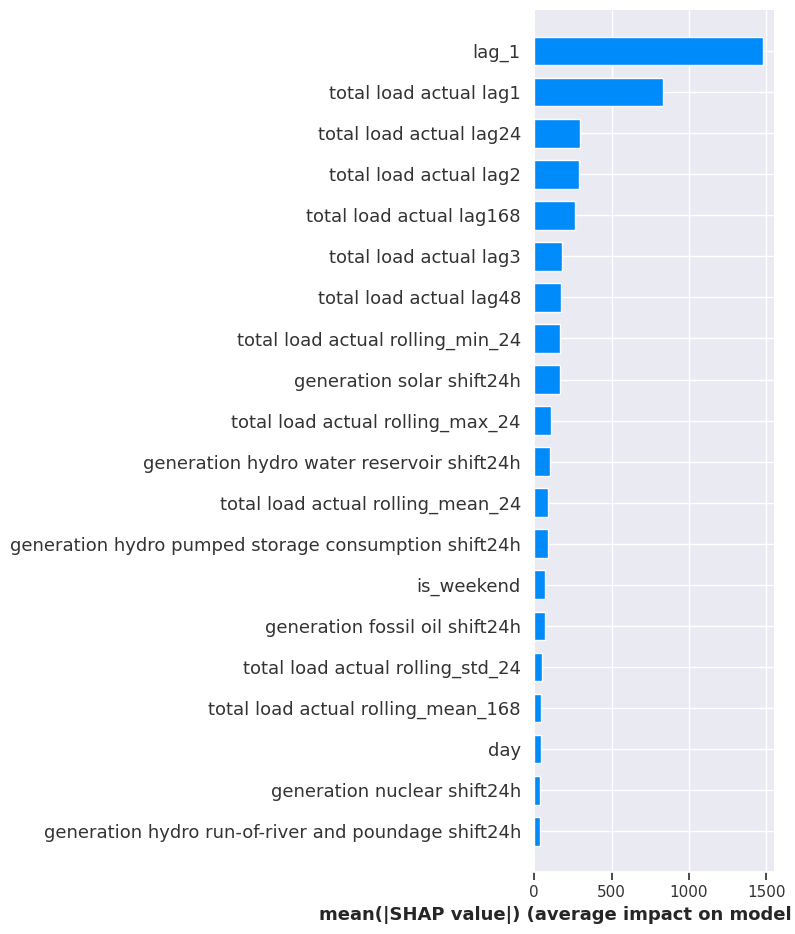

<Figure size 640x480 with 0 Axes>

In [291]:
shap.summary_plot(
    shap_values,
    X_explain,
    plot_type="bar"
)
plt.savefig('../report/figures/SHAP_1.png', dpi=80)

<span style="color: darkblue;">The first thing we observe on the SHAP analysis is that the model is heavily relying on two variables that are identical (`lag_1` and `total load actual lag1` are exactly the same variable). Apart from that, we see that lag and rolling window variables have a huge presence on the SHAP values. Like Prophet, this model is also taking advantage of energy related covariates and calendar covariates. </span>

<span style="color: darkblue;">The presence of `lag_1` and `total load actual lag1` as top tier variables suggest that the XGBoost is giving more weight to that variable. So, we are going to duplicate lag variables and repeat the process in order to see if this benefits the model.</span>

In [292]:
from skforecast.recursive import ForecasterRecursive
from skforecast.model_selection import grid_search_forecaster, TimeSeriesFold
from xgboost import XGBRegressor
from sklearn.metrics import root_mean_squared_error

TARGET = 'total load actual'
HORIZON = 24

# We remove 'total load actual lag1' because we are forced to use lags=1 at least on ForecasterRecursive
X_train = train_feat.drop(columns=[TARGET]).astype(float)
y_train = train_feat[TARGET].astype(float)
X_val = val_feat.drop(columns=[TARGET]).astype(float)
y_val = val_feat[TARGET].astype(float)

y_cv = pd.concat([y_train, y_val]).astype(float)
y_cv.index = pd.DatetimeIndex(y_cv.index.tz_localize(None), freq='H')
X_cv = pd.concat([X_train, X_val]).astype(float)
X_cv.index = y_cv.index

forecaster_xgb = ForecasterRecursive(
    regressor=XGBRegressor(
        objective='reg:squarederror',
        random_state=SEED,
        n_jobs=2
    ),
    lags=[1, 2, 3, 24, 48, 24*7]
)

param_grid = {
    'n_estimators':     [900, 1200],
    'learning_rate':    [0.005, 0.01],
    'max_depth':        [7, 9],
    'colsample_bytree': [0.1, 0.25]
}

cv = TimeSeriesFold(
    steps                = HORIZON,
    initial_train_size   = len(y_train),
    fold_stride          = HORIZON,
    refit                = False,
    fixed_train_size     = True,
    gap                  = 0,
    allow_incomplete_fold = False
)

results_grid_xgb = grid_search_forecaster(
    forecaster    = forecaster_xgb,
    y             = y_cv,
    exog          = X_cv,
    param_grid    = param_grid,
    cv            = cv,
    metric        = root_mean_squared_error,
    return_best   = True,
    n_jobs        = 2,
    verbose       = False,
    show_progress = True
)

lags grid:   0%|          | 0/1 [00:00<?, ?it/s]

params grid:   0%|          | 0/16 [00:00<?, ?it/s]

`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [  1   2   3  24  48 168] 
  Parameters: {'colsample_bytree': 0.25, 'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 1200}
  Backtesting metric: 1243.4546270376445


In [293]:
print("Best parameters (XGBoost):")
print(results_grid_xgb.iloc[0]['params'])
print(f"Best RMSE (CV train+val): {results_grid_xgb.iloc[0]['root_mean_squared_error']:.2f}")

Best parameters (XGBoost):
{'colsample_bytree': 0.25, 'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 1200}
Best RMSE (CV train+val): 1243.45


In [294]:
import shap

result = forecaster_xgb._create_train_X_y(
    y    = y_train,
    exog = X_train
)
X_shap = result[0]
y_shap = result[1]
X_explain = X_shap[-365*24:]

explainer   = shap.TreeExplainer(forecaster_xgb.regressor)
shap_values = explainer.shap_values(X_explain)

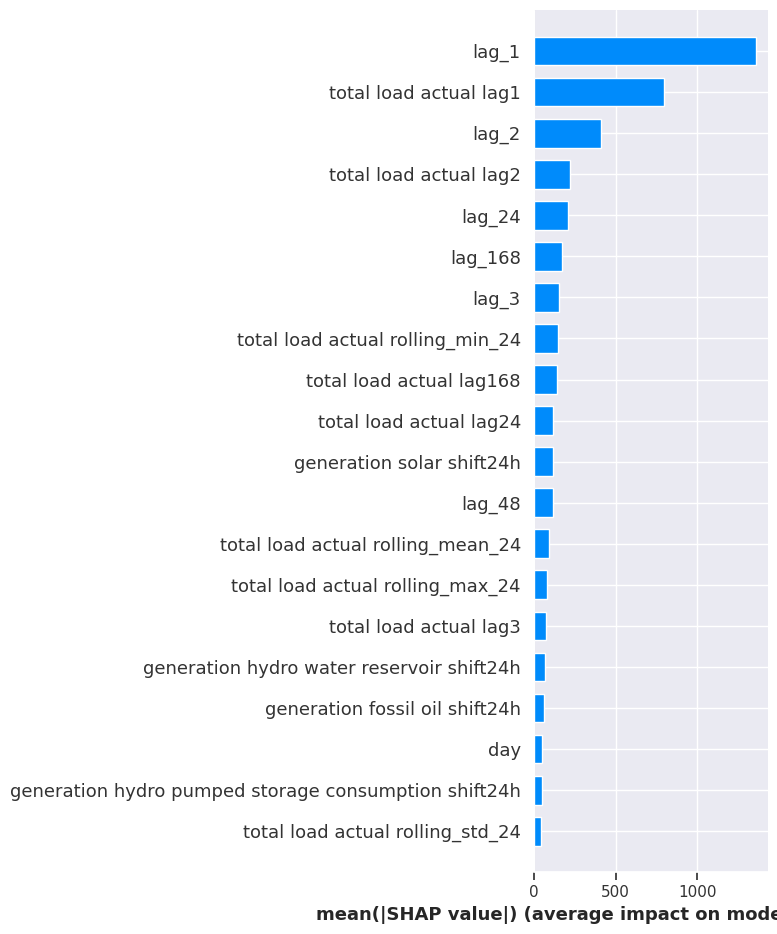

<Figure size 640x480 with 0 Axes>

In [295]:
shap.summary_plot(
    shap_values,
    X_explain,
    plot_type="bar"
)
plt.savefig('../report/figures/SHAP_2.png', dpi=80)

<span style="color: darkblue;">The selected hyperparameters kept the same, but the RMSE on validation set decreased. As we can see on the SHAP values, duplicated variables are helping the model to generalize better.</span>

<span style="color: darkblue;">For the last experiment with XGBoost model, we will create some lag and rolling variables of the energy generation covariates (as they seem to be important).</span>

In [296]:
for c in list(filter(lambda x: 'generation' in x, whole_df.columns)):
    # Apply complete feature engineering
    df_features = create_ml_features(
        df_features, 
        target_col=c,
        lags=[1, 2, 3, 24, 48, 24*7],           # Include seasonal lag
        rolling_windows=[24, 24*7],      # Multiple windows
        rolling_funcs=['mean', 'std', 'min', 'max']
    )

train_feat = df_features.loc[train_df.index.intersection(df_features.index)]
val_feat = df_features.loc[val_df.index.intersection(df_features.index)]
test_feat = df_features.loc[test_df.index.intersection(df_features.index)]

print(f'Before dropping NaNs')
print(f'Train len = {len(train_feat)}\tVal len = {len(val_feat)}\tTest len = {len(test_feat)}')

train_feat = train_feat.dropna()
val_feat = val_feat.dropna()
test_feat = test_feat.dropna()

print(f'\nAfter dropping NaNs')
print(f'Train len = {len(train_feat)}\tVal len = {len(val_feat)}\tTest len = {len(test_feat)}')

print(f"\nFeatures created: {len(df_features.columns) - len(whole_df.columns)}")

Before dropping NaNs
Train len = 17520	Val len = 8760	Test len = 8760

After dropping NaNs
Train len = 17352	Val len = 8760	Test len = 8760

Features created: 210


In [297]:
from skforecast.recursive import ForecasterRecursive
from skforecast.model_selection import grid_search_forecaster, TimeSeriesFold
from xgboost import XGBRegressor
from sklearn.metrics import root_mean_squared_error

TARGET = 'total load actual'
HORIZON = 24

# We remove 'total load actual lag1' because we are forced to use lags=1 at least on ForecasterRecursive
X_train = train_feat.drop(columns=[TARGET]).astype(float)
y_train = train_feat[TARGET].astype(float)
X_val = val_feat.drop(columns=[TARGET]).astype(float)
y_val = val_feat[TARGET].astype(float)

y_cv = pd.concat([y_train, y_val]).astype(float)
y_cv.index = pd.DatetimeIndex(y_cv.index.tz_localize(None), freq='H')
X_cv = pd.concat([X_train, X_val]).astype(float)
X_cv.index = y_cv.index

forecaster_xgb = ForecasterRecursive(
    regressor=XGBRegressor(
        objective='reg:squarederror',
        random_state=SEED,
        n_jobs=2
    ),
    lags=[1, 2, 3, 24, 48, 24*7]
)

param_grid = {
    'n_estimators':     [900, 1200],
    'learning_rate':    [0.005, 0.01],
    'max_depth':        [7, 9],
    'colsample_bytree': [0.1, 0.25]
}

cv = TimeSeriesFold(
    steps                = HORIZON,
    initial_train_size   = len(y_train),
    fold_stride          = HORIZON,
    refit                = False,
    fixed_train_size     = True,
    gap                  = 0,
    allow_incomplete_fold = False
)

results_grid_xgb = grid_search_forecaster(
    forecaster    = forecaster_xgb,
    y             = y_cv,
    exog          = X_cv,
    param_grid    = param_grid,
    cv            = cv,
    metric        = root_mean_squared_error,
    return_best   = True,
    n_jobs        = 2,
    verbose       = False,
    show_progress = True
)

lags grid:   0%|          | 0/1 [00:00<?, ?it/s]

params grid:   0%|          | 0/16 [00:00<?, ?it/s]

`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [  1   2   3  24  48 168] 
  Parameters: {'colsample_bytree': 0.25, 'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 1200}
  Backtesting metric: 1184.085254088935


In [298]:
print("Best parameters (XGBoost):")
print(results_grid_xgb.iloc[0]['params'])
print(f"Best RMSE (CV train+val): {results_grid_xgb.iloc[0]['root_mean_squared_error']:.2f}")

Best parameters (XGBoost):
{'colsample_bytree': 0.25, 'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 1200}
Best RMSE (CV train+val): 1184.09


In [299]:
import shap

result = forecaster_xgb._create_train_X_y(
    y    = y_train,
    exog = X_train
)
X_shap = result[0]
y_shap = result[1]
X_explain = X_shap[-365*24:]

explainer   = shap.TreeExplainer(forecaster_xgb.regressor)
shap_values = explainer.shap_values(X_explain)

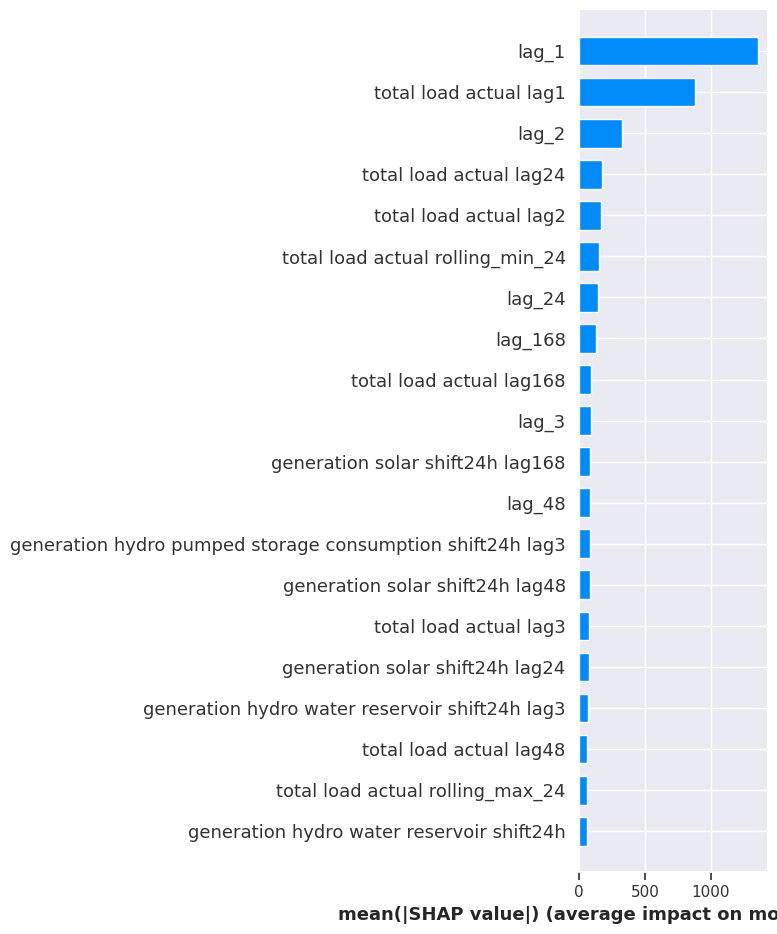

<Figure size 640x480 with 0 Axes>

In [300]:
shap.summary_plot(
    shap_values,
    X_explain,
    plot_type="bar"
)
plt.savefig('../report/figures/SHAP_3.png', dpi=80)

<span style="color: darkblue;">The RMSE of validation set was decreased again. As we can see on the SHAP plot, the model mainly relies on lagged features of the target variable, as well as the lag features of solar generation and hydro pumped generation. Solar generation is related to weather and hydro pumped generation is a backup system. So we could say that this model is finally taking advantage of different source data.</span>

<span style="color: darkblue;">Same as previous models, we will refit it and evaluate it on test data.</span>

In [301]:
X_test = test_feat.drop(columns=[TARGET]).astype(float)
y_test = test_feat[TARGET].astype(float)

X_test.index = pd.DatetimeIndex(X_test.index.tz_localize(None), freq='H')
y_test.index = X_test.index

xgb_preds = forecaster_xgb.predict(steps=len(y_test), exog=X_test)

# -----------------------------
# EVALUATION METRICS
# -----------------------------
rmse_xgb = np.sqrt(mean_squared_error(y_test, xgb_preds))
mae_xgb = mean_absolute_error(y_test, xgb_preds)
mape_xgb = mean_absolute_percentage_error(y_test, xgb_preds)

print("--- XGBoost (Lag + Roll + Exog) | Test performance ---")
print(f"RMSE:  {rmse_xgb:.2f}")
print(f"MAE:   {mae_xgb:.2f}")
print(f"MAPE:  {mape_xgb*100:.2f}%")

--- XGBoost (Lag + Roll + Exog) | Test performance ---
RMSE:  1095.17
MAE:   789.94
MAPE:  2.77%


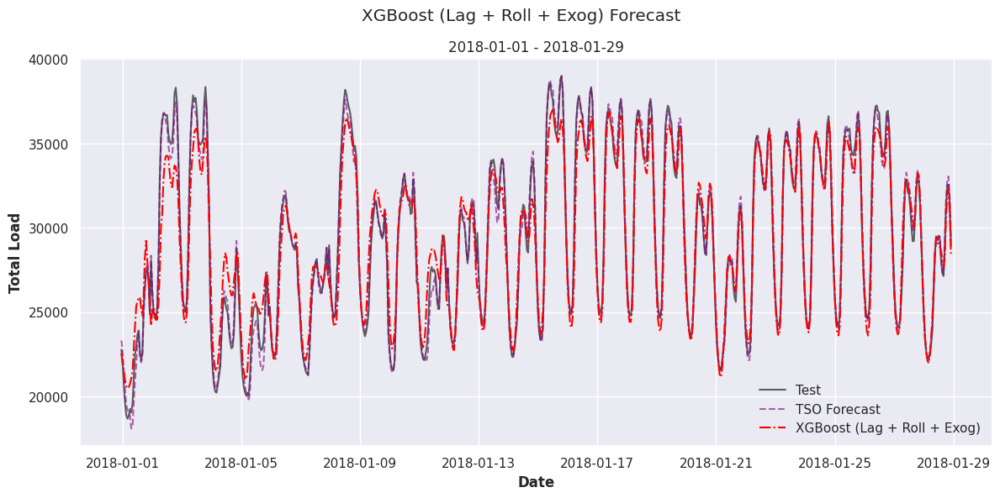

In [302]:
plt.figure(figsize=(14, 6))
plt.plot(y_test.index[:24*7*4], y_test[:24*7*4], label='Test', color='black', alpha=0.6)
plt.plot(y_test.index[:24*7*4], y_pred_TSO[:24*7*4], label='TSO Forecast', color='purple', linestyle='--', alpha=0.6)
plt.plot(y_test.index[:24*7*4], xgb_preds[:24*7*4], label='XGBoost (Lag + Roll + Exog)', color='red', linestyle='-.')

plt.suptitle('XGBoost (Lag + Roll + Exog) Forecast')
plt.title('2018-01-01 - 2018-01-29')
plt.xlabel('Date')
plt.ylabel('Total Load')
plt.legend()
plt.savefig('../report/figures/XGBoost_forecast.png', dpi=80)
plt.show()

<span style="color: darkblue;">We are still far from TSO forecast, but XGBoost outperformed previous models. We believe this is mainly because of the context window it carries with lagged variables.</span>

| Model                     | RMSE  | MAE   | MAPE (%) |
|---------------------------|-------|-------|----------|
| TSO Forecast                    | 389.32 | 269.85 | 0.93 |
| SARIMA                    | 5005.39 | 4135.67 | 13.63 |
| SARIMAX (SARIMA + Calendar) | 6642.89 | 5780.29 | 19.23 |
| Prophet (Generation + Calendar) | 2645.61 | 1973.74 | 6.96% |
| XGBoost (Lag + Roll + Exog) | 1095.17 | 789.94 | 2.77% |

# 7. DL Models

<span style="color: darkblue;">Even if XGBoost performed quite well, there is still room for improvement. We believe that handling a good temporal context window may be the key for achieving a good performance. Furthermore, we saw on the first XGBoost trials that rolling windows were useful too. So, the next approach will be based on DL, specifically on TCN. We can configure it so its receptive field meets the context window we want. Moreover, it will be able to generate the aggregation functions it needs (instead of fixed "mean", "std", etc).</span>

In [303]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
# darts core
from darts import TimeSeries
from darts.dataprocessing.transformers import Scaler
from darts.metrics import rmse, mae, mape
from darts import concatenate


# darts models (we'll import specific models as needed)
from darts.models import (
    TCNModel,
    NHiTSModel
)

# PyTorch Lightning for training configuration
import pytorch_lightning as pl

# Check GPU availability
import torch
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"PyTorch version: {torch.__version__}")
print(f"Using device: {device}")
if device == "cuda":
    print(f"GPU: {torch.cuda.get_device_name(0)}")

# Set style
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

PyTorch version: 2.8.0+cu128
Using device: cuda
GPU: NVIDIA RTX A6000


## 7.1 TCN

In [304]:
TARGET = 'total load actual'

# All covariates = everything except target
COVARIATE_COLS = [c for c in whole_df.columns if c != TARGET]

ts_target = TimeSeries.from_dataframe(
    whole_df,
    value_cols=TARGET,
    freq='H'
)

ts_cov = TimeSeries.from_dataframe(
    whole_df,
    value_cols=COVARIATE_COLS,
    freq='H'
)

train_start = train_df.index[0].tz_localize(None)
train_end = train_df.index[-1].tz_localize(None)

val_start = val_df.index[0].tz_localize(None)
val_end = val_df.index[-1].tz_localize(None)

test_start = test_df.index[0].tz_localize(None)
test_end = test_df.index[-1].tz_localize(None)

ts_train = ts_target.slice(train_start, train_end)
ts_val = ts_target.slice(val_start, val_end)
ts_test = ts_target.slice(test_start, test_end)

ts_cov_train = ts_cov.slice(train_start, train_end)
ts_cov_val = ts_cov.slice(val_start, val_end)
ts_cov_test = ts_cov.slice(test_start, test_end)

print(ts_train)
print(ts_val)
print(ts_test)

print(ts_cov_train)
print(ts_cov_val)
print(ts_cov_test)

The provided DatetimeIndex was associated with a timezone (tz), which is currently not supported. To avoid unexpected behaviour, the tz information was removed. Consider calling `ts.time_index.tz_localize(UTC)` when exporting the results.To plot the series with the right time steps, consider setting the matplotlib.pyplot `rcParams['timezone']` parameter to automatically convert the time axis back to the original timezone.
The provided DatetimeIndex was associated with a timezone (tz), which is currently not supported. To avoid unexpected behaviour, the tz information was removed. Consider calling `ts.time_index.tz_localize(UTC)` when exporting the results.To plot the series with the right time steps, consider setting the matplotlib.pyplot `rcParams['timezone']` parameter to automatically convert the time axis back to the original timezone.


<TimeSeries (DataArray) (time: 17520, component: 1, sample: 1)> Size: 140kB
array([[[27070.]],

       [[24935.]],

       [[23214.]],

       ...,

       [[29061.]],

       [[26699.]],

       [[25452.]]])
Coordinates:
  * time       (time) datetime64[ns] 140kB 2015-01-01T23:00:00 ... 2016-12-31...
  * component  (component) object 8B 'total load actual'
Dimensions without coordinates: sample
Attributes:
    static_covariates:  None
    hierarchy:          None
    metadata:           None
<TimeSeries (DataArray) (time: 8760, component: 1, sample: 1)> Size: 70kB
array([[[24401.]],

       [[23393.]],

       [[21909.]],

       ...,

       [[27260.]],

       [[25043.]],

       [[23680.]]])
Coordinates:
  * time       (time) datetime64[ns] 70kB 2016-12-31T23:00:00 ... 2017-12-31T...
  * component  (component) object 8B 'total load actual'
Dimensions without coordinates: sample
Attributes:
    static_covariates:  None
    hierarchy:          None
    metadata:           None
<TimeS

In [305]:
from darts.dataprocessing.transformers import Scaler
from sklearn.preprocessing import StandardScaler

scaler_target = Scaler(StandardScaler())
scaler_cov = Scaler(StandardScaler())

ts_train_scaled = scaler_target.fit_transform(ts_train)
ts_val_scaled = scaler_target.transform(ts_val)
ts_test_scaled = scaler_target.transform(ts_test)

ts_cov_train_scaled = scaler_cov.fit_transform(ts_cov_train)
ts_cov_val_scaled = scaler_cov.transform(ts_cov_val)
ts_cov_test_scaled = scaler_cov.transform(ts_cov_test)

<span style="color: darkblue;">As for XGBoost we computed lags and rolling windows up to 168h (one week), we will start by training a TCN with the same receptive field.</span>

In [306]:
def calculate_receptive_field(kernel_size, num_layers, dilation_base=2):
    """Calculate the receptive field of a TCN."""
    rf = 1
    for i in range(num_layers):
        dilation = dilation_base ** i
        rf += (kernel_size - 1) * dilation
    return rf

# Example calculations
print('Kernel = 3, dilation base = 2')
for num_layers in [2, 3, 4, 5, 6, 7]:
    rf = calculate_receptive_field(kernel_size=3, num_layers=num_layers, dilation_base=2)
    print(f"Layers: {num_layers}, Receptive Field: {rf} time steps")

print()
print('Kernel = 3, dilation base = 3')
for num_layers in [2, 3, 4, 5, 6, 7]:
    rf = calculate_receptive_field(kernel_size=3, num_layers=num_layers, dilation_base=3)
    print(f"Layers: {num_layers}, Receptive Field: {rf} time steps")

Kernel = 3, dilation base = 2
Layers: 2, Receptive Field: 7 time steps
Layers: 3, Receptive Field: 15 time steps
Layers: 4, Receptive Field: 31 time steps
Layers: 5, Receptive Field: 63 time steps
Layers: 6, Receptive Field: 127 time steps
Layers: 7, Receptive Field: 255 time steps

Kernel = 3, dilation base = 3
Layers: 2, Receptive Field: 9 time steps
Layers: 3, Receptive Field: 27 time steps
Layers: 4, Receptive Field: 81 time steps
Layers: 5, Receptive Field: 243 time steps
Layers: 6, Receptive Field: 729 time steps
Layers: 7, Receptive Field: 2187 time steps


<span style="color: darkblue;">We can't get a RF of exactly 168 days, so we will go for the next value. We will start with a `dilation_base = 3` and `num_layers = 5` (RF of 243h), instead of `dilation_base = 2` and `num_layers = 7` (RF of 255h), because it is a narrower network.</span>

In [307]:
import torch
from pytorch_lightning.callbacks import EarlyStopping, Callback

class LossHistory(Callback):
    def on_train_epoch_end(self, trainer, pl_module):
        self.train_losses.append(trainer.callback_metrics['train_loss'].item())

    def on_validation_epoch_end(self, trainer, pl_module):
        self.val_losses.append(trainer.callback_metrics['val_loss'].item())

    def __init__(self):
        self.train_losses = []
        self.val_losses = []


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | res_blocks      | ModuleList       | 122 K  | train
-------------------------------------------------------------
122 K     Trainable params
0         Non-trainable params
122 K     Total params
0.489     Total estimated model params size (MB)
33        Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

Training: |                                               | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

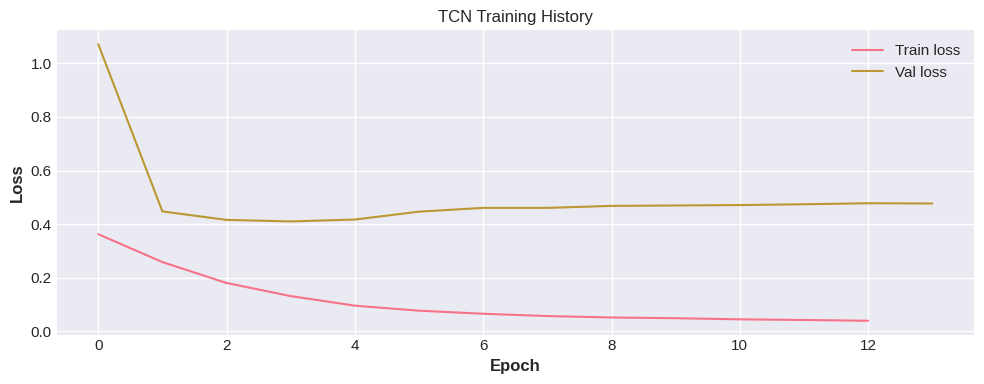

In [308]:
early_stopping = EarlyStopping(
    monitor="val_loss",
    patience=10,
    mode="min"
)

loss_history = LossHistory()

pl_trainer_kwargs = {
    "accelerator": "gpu" if torch.cuda.is_available() else "cpu",
    "devices": 1,
    "enable_progress_bar": True,
    "callbacks": [early_stopping, loss_history],
    "max_epochs": 100
}

tcn_model = TCNModel(
    input_chunk_length=int(243*1.25), # RF is 243 days. We use a slightly bigger size
    output_chunk_length=24, # day-ahead
    kernel_size=3,
    dilation_base=3,
    num_layers=5,
    num_filters=64,
    dropout=0.1,
    batch_size=1024,
    n_epochs=100,
    optimizer_kwargs={"lr": 1e-3},   # Adam by default
    pl_trainer_kwargs=pl_trainer_kwargs,
    random_state=SEED,
    model_name="tcn_electric_load"
)

tcn_model.fit(
    series=ts_train_scaled,
    past_covariates=ts_cov_train_scaled,
    val_series=ts_val_scaled,
    val_past_covariates=ts_cov_val_scaled,
    verbose=True
)

plt.figure(figsize=(10, 4))
plt.plot(loss_history.train_losses, label='Train loss')
plt.plot(loss_history.val_losses, label='Val loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('TCN Training History')
plt.legend()
plt.tight_layout()
plt.savefig('../report/figures/TCN_1.png', dpi=80)
plt.show()

<span style="color: darkblue;">We have a huge overfitting. We need to regularize.</span>

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | res_blocks      | ModuleList       | 12.1 K | train
-------------------------------------------------------------
12.1 K    Trainable params
0         Non-trainable params
12.1 K    Total params
0.049     Total estimated model params size (MB)
33        Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

Training: |                                               | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

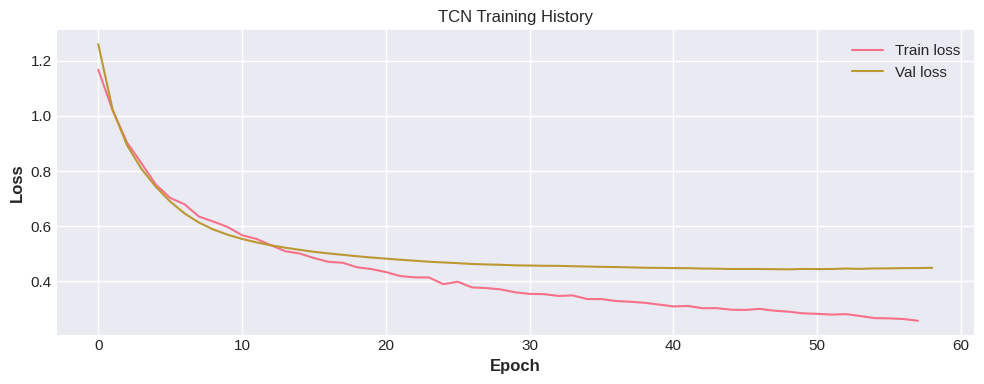

In [309]:
early_stopping = EarlyStopping(
    monitor="val_loss",
    patience=10,
    mode="min"
)

loss_history = LossHistory()

pl_trainer_kwargs = {
    "accelerator": "gpu" if torch.cuda.is_available() else "cpu",
    "devices": 1,
    "enable_progress_bar": True,
    "callbacks": [early_stopping, loss_history],
    "max_epochs": 100
}

tcn_model = TCNModel(
    input_chunk_length=int(243*1.25), # RF is 243 days. We use a slightly bigger size
    output_chunk_length=24, # day-ahead
    kernel_size=3,
    dilation_base=3,
    num_layers=5,
    num_filters=16, # Reduced num_filters
    dropout=0.3, # Augmented dropout
    batch_size=1024,
    n_epochs=100,
    optimizer_kwargs={"lr": 1e-4},   # Reduced Adam's LR
    pl_trainer_kwargs=pl_trainer_kwargs,
    random_state=SEED,
    model_name="tcn_electric_load"
)

tcn_model.fit(
    series=ts_train_scaled,
    past_covariates=ts_cov_train_scaled,
    val_series=ts_val_scaled,
    val_past_covariates=ts_cov_val_scaled,
    verbose=True
)

plt.figure(figsize=(10, 4))
plt.plot(loss_history.train_losses, label='Train loss')
plt.plot(loss_history.val_losses, label='Val loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('TCN Training History')
plt.legend()
plt.tight_layout()
plt.savefig('../report/figures/TCN_2.png', dpi=80)
plt.show()

<span style="color: darkblue;">Still overfitted.</span>

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | res_blocks      | ModuleList       | 3.7 K  | train
-------------------------------------------------------------
3.7 K     Trainable params
0         Non-trainable params
3.7 K     Total params
0.015     Total estimated model params size (MB)
23        Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

Training: |                                               | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

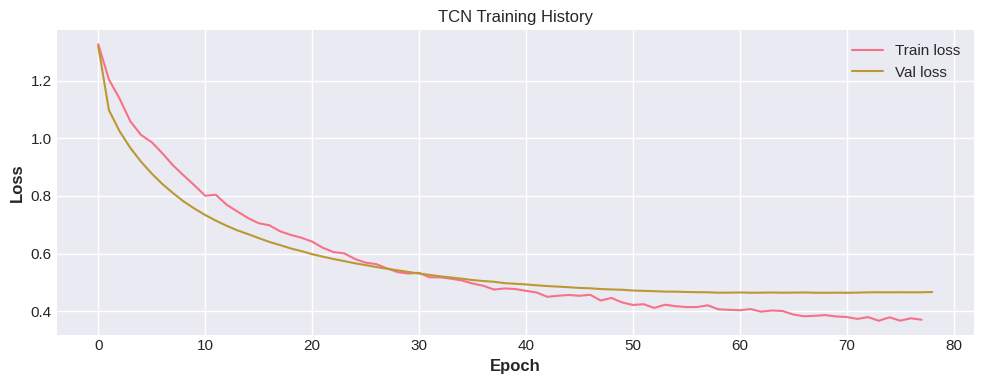

In [310]:
early_stopping = EarlyStopping(
    monitor="val_loss",
    patience=10,
    mode="min"
)

loss_history = LossHistory()

pl_trainer_kwargs = {
    "accelerator": "gpu" if torch.cuda.is_available() else "cpu",
    "devices": 1,
    "enable_progress_bar": True,
    "callbacks": [early_stopping, loss_history],
    "max_epochs": 100
}

tcn_model = TCNModel(
    input_chunk_length=168, # We reduce input chunk length to 1 week
    output_chunk_length=24, # day-ahead
    kernel_size=3,
    dilation_base=3,
    num_layers=3, # Reduced num_layers, now RF is 27 hours
    num_filters=8, # Reduced num_filters
    dropout=0.5, # Augmented dropout
    batch_size=1024,
    n_epochs=100,
    optimizer_kwargs={"lr": 1e-4},   # Adam by default
    pl_trainer_kwargs=pl_trainer_kwargs,
    random_state=SEED,
    model_name="tcn_electric_load"
)

tcn_model.fit(
    series=ts_train_scaled,
    past_covariates=ts_cov_train_scaled,
    val_series=ts_val_scaled,
    val_past_covariates=ts_cov_val_scaled,
    verbose=True
)

plt.figure(figsize=(10, 4))
plt.plot(loss_history.train_losses, label='Train loss')
plt.plot(loss_history.val_losses, label='Val loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('TCN Training History')
plt.legend()
plt.tight_layout()
plt.savefig('../report/figures/TCN_3.png', dpi=80)
plt.show()

<span style="color: darkblue;">Still overfitting.</span>

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | res_blocks      | ModuleList       | 882    | train
-------------------------------------------------------------
882       Trainable params
0         Non-trainable params
882       Total params
0.004     Total estimated model params size (MB)
23        Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

Training: |                                               | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=100` reached.


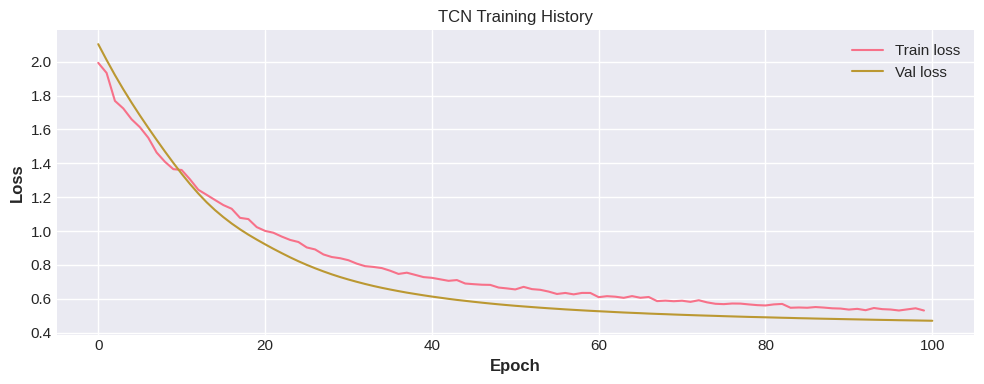

In [311]:
early_stopping = EarlyStopping(
    monitor="val_loss",
    patience=10,
    mode="min"
)

loss_history = LossHistory()

pl_trainer_kwargs = {
    "accelerator": "gpu" if torch.cuda.is_available() else "cpu",
    "devices": 1,
    "enable_progress_bar": True,
    "callbacks": [early_stopping, loss_history],
    "max_epochs": 100
}

tcn_model = TCNModel(
    input_chunk_length=168, # 1 week
    output_chunk_length=24, # day-ahead
    kernel_size=3,
    dilation_base=3,
    num_layers=3,
    num_filters=8,
    dropout=0.5,
    batch_size=1024,
    n_epochs=100,
    optimizer_kwargs={"lr": 1e-4},   # Adam by default
    pl_trainer_kwargs=pl_trainer_kwargs,
    random_state=SEED,
    model_name="tcn_electric_load"
)

# We get rid of the covariates
tcn_model.fit(
    series=ts_train_scaled,
    val_series=ts_val_scaled,
    verbose=True
)

plt.figure(figsize=(10, 4))
plt.plot(loss_history.train_losses, label='Train loss')
plt.plot(loss_history.val_losses, label='Val loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('TCN Training History')
plt.legend()
plt.tight_layout()
plt.savefig('../report/figures/TCN_4.png', dpi=80)
plt.show()

<span style="color: darkblue;">Better train-val gap, but slow convergence.</span>

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | res_blocks      | ModuleList       | 882    | train
-------------------------------------------------------------
882       Trainable params
0         Non-trainable params
882       Total params
0.004     Total estimated model params size (MB)
23        Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

Training: |                                               | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

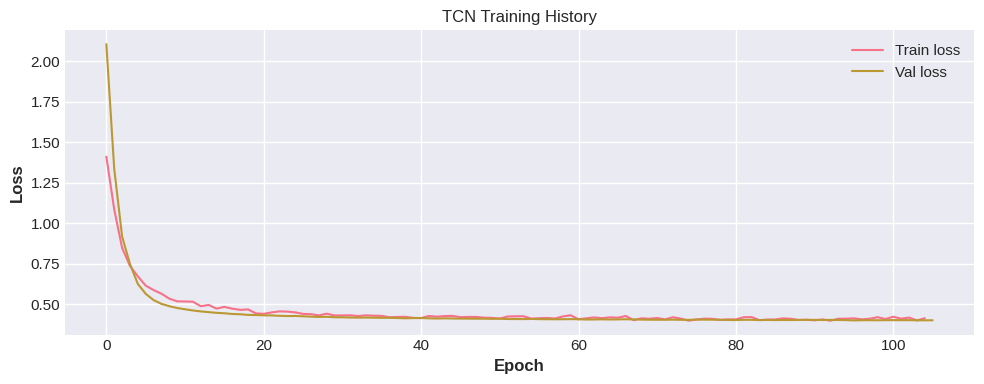

In [312]:
early_stopping = EarlyStopping(
    monitor="val_loss",
    patience=10,
    mode="min"
)

loss_history = LossHistory()

pl_trainer_kwargs = {
    "accelerator": "gpu" if torch.cuda.is_available() else "cpu",
    "devices": 1,
    "enable_progress_bar": True,
    "callbacks": [early_stopping, loss_history],
    "max_epochs": 500 # Augmented epochs
}

tcn_model = TCNModel(
    input_chunk_length=168, # 1 week
    output_chunk_length=24, # day-ahead
    kernel_size=3,
    dilation_base=3,
    num_layers=3,
    num_filters=8,
    dropout=0.5,
    batch_size=1024,
    n_epochs=100,
    optimizer_kwargs={"lr": 1e-3},
    pl_trainer_kwargs=pl_trainer_kwargs,
    random_state=SEED,
    model_name="tcn_electric_load"
)

tcn_model.fit(
    series=ts_train_scaled,
    val_series=ts_val_scaled,
    verbose=True
)

plt.figure(figsize=(10, 4))
plt.plot(loss_history.train_losses, label='Train loss')
plt.plot(loss_history.val_losses, label='Val loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('TCN Training History')
plt.legend()
plt.tight_layout()
plt.savefig('../report/figures/TCN_5.png', dpi=80)
plt.show()

<span style="color: darkblue;">Better train-val gap. Best validation loss for now.</span>

In [313]:
from darts import concatenate
from darts import metrics

ts_context_scaled = concatenate(
    [ts_train_scaled, ts_val_scaled],
    axis=0
)

ts_cov_context_scaled = concatenate(
    [ts_cov_train_scaled, ts_cov_val_scaled, ts_cov_test_scaled],
    axis=0
)

pred_tcn_scaled = tcn_model.predict(
    n=len(ts_test),
    series=ts_context_scaled#,
    #past_covariates=ts_cov_context_scaled
)
pred_tcn = scaler_target.inverse_transform(pred_tcn_scaled)

print("--- TCN | Test performance ---")
print(f"RMSE:  {metrics.rmse(ts_test, pred_tcn):.2f}")
print(f"MAE:   {metrics.mae(ts_test, pred_tcn):.2f}")
print(f"MAPE:  {metrics.mape(ts_test, pred_tcn):.2f}%")

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |                                             | 0/? [00:00<?, ?it/s]

--- TCN | Test performance ---
RMSE:  5082.41
MAE:   4237.14
MAPE:  14.09%


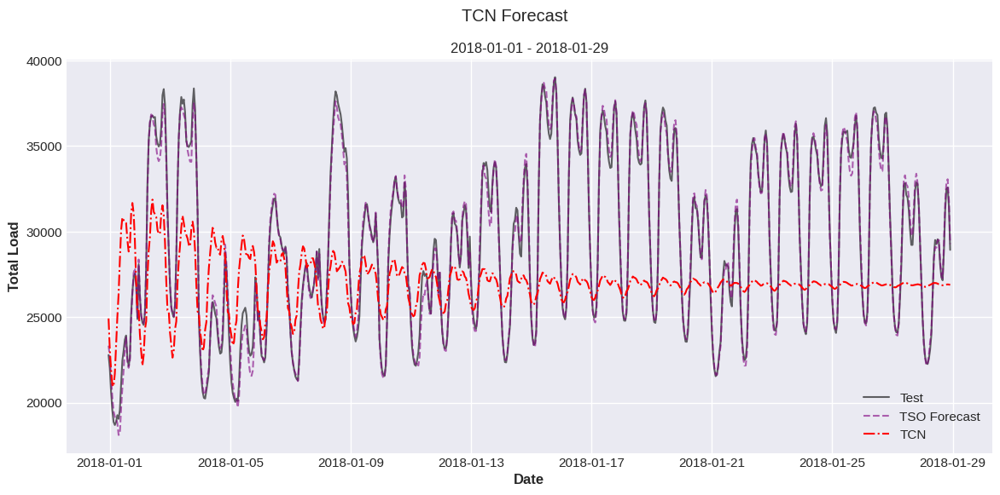

In [314]:
pred_tcn_values = pred_tcn.values().flatten()

plt.figure(figsize=(14, 6))
plt.plot(y_test.index[:24*7*4], y_test[:24*7*4], label='Test', color='black', alpha=0.6)
plt.plot(y_test.index[:24*7*4], y_pred_TSO[:24*7*4], label='TSO Forecast', color='purple', linestyle='--', alpha=0.6)
plt.plot(y_test.index[:24*7*4], pred_tcn_values[:24*7*4], label='TCN', color='red', linestyle='-.')

plt.suptitle('TCN Forecast')
plt.title('2018-01-01 - 2018-01-29')
plt.xlabel('Date')
plt.ylabel('Total Load')
plt.legend()
plt.savefig('../report/figures/TCN_forecast.png', dpi=80)
plt.show()

<span style="color: darkblue;">The TCN resulted in something like a NaiveMean forecaster. This is not good at all. The model isn't overfitting, but it isn't learning anything meaningful neither. We are going to recover one of the previous overfitting configurations and train over train + val sets. This kind of models can be very data hungry. Let's see if that solves (or at least improves) the problem.</span>

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | res_blocks      | ModuleList       | 12.1 K | train
-------------------------------------------------------------
12.1 K    Trainable params
0         Non-trainable params
12.1 K    Total params
0.049     Total estimated model params size (MB)
33        Modules in train mode
0         Modules in eval mode


Training: |                                               | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=100` reached.


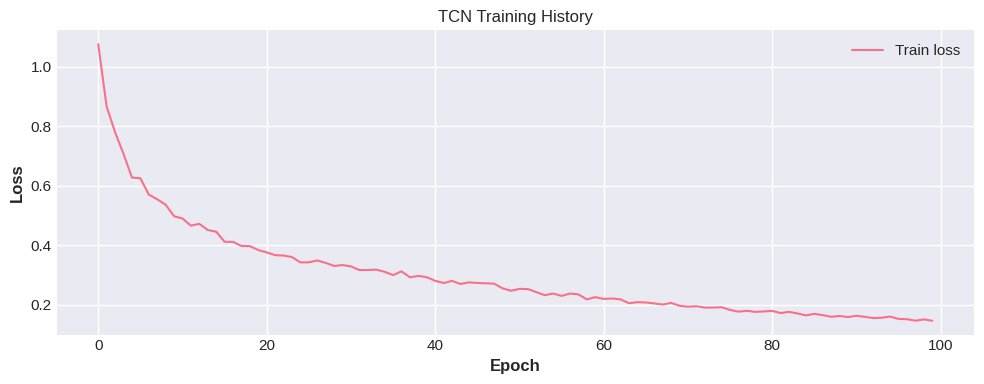

In [315]:
ts_trainval_scaled = concatenate(
    [ts_train_scaled, ts_val_scaled],
    axis=0
)

ts_cov_trainval_scaled = concatenate(
    [ts_cov_train_scaled, ts_cov_val_scaled],
    axis=0
)

loss_history = LossHistory()

pl_trainer_kwargs = {
    "accelerator": "gpu" if torch.cuda.is_available() else "cpu",
    "devices": 1,
    "enable_progress_bar": True,
    "callbacks": [loss_history],
    "max_epochs": 100
}

tcn_model = TCNModel(
    input_chunk_length=int(243*1.25), # RF is 243 days. We use a slightly bigger size
    output_chunk_length=24, # day-ahead
    kernel_size=3,
    dilation_base=3,
    num_layers=5,
    num_filters=16, # Reduced num_filters
    dropout=0.3, # Augmented dropout
    batch_size=1024,
    n_epochs=100,
    optimizer_kwargs={"lr": 1e-4},   # Reduced Adam's LR
    pl_trainer_kwargs=pl_trainer_kwargs,
    random_state=SEED,
    model_name="tcn_electric_load"
)

tcn_model.fit(
    series=ts_trainval_scaled,
    past_covariates=ts_cov_trainval_scaled,
    verbose=True
)

plt.figure(figsize=(10, 4))
plt.plot(loss_history.train_losses, label='Train loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('TCN Training History')
plt.legend()
plt.tight_layout()
plt.savefig('../report/figures/TCN_train_val.png', dpi=80)
plt.show()

In [316]:
from darts import concatenate
from darts import metrics

ts_context_scaled = concatenate(
    [ts_train_scaled, ts_val_scaled],
    axis=0
)

ts_cov_context_scaled = concatenate(
    [ts_cov_train_scaled, ts_cov_val_scaled, ts_cov_test_scaled],
    axis=0
)

pred_tcn_scaled = tcn_model.predict(
    n=len(ts_test),
    series=ts_context_scaled,
    past_covariates=ts_cov_context_scaled
)
pred_tcn = scaler_target.inverse_transform(pred_tcn_scaled)

print("--- TCN | Test performance ---")
print(f"RMSE:  {metrics.rmse(ts_test, pred_tcn):.2f}")
print(f"MAE:   {metrics.mae(ts_test, pred_tcn):.2f}")
print(f"MAPE:  {metrics.mape(ts_test, pred_tcn):.2f}%")

`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |                                             | 0/? [00:00<?, ?it/s]

--- TCN | Test performance ---
RMSE:  4067.13
MAE:   3183.61
MAPE:  10.77%


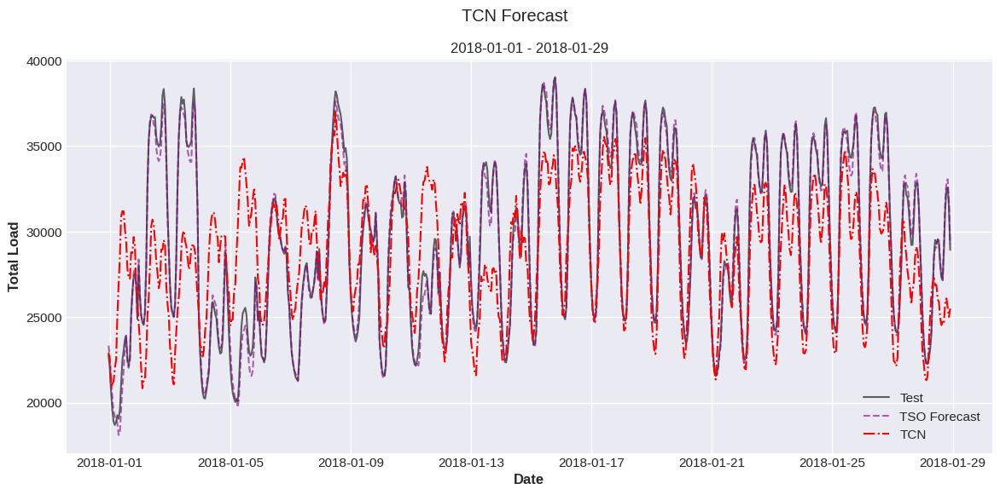

In [317]:
pred_tcn_values = pred_tcn.values().flatten()

plt.figure(figsize=(14, 6))
plt.plot(y_test.index[:24*7*4], y_test[:24*7*4], label='Test', color='black', alpha=0.6)
plt.plot(y_test.index[:24*7*4], y_pred_TSO[:24*7*4], label='TSO Forecast', color='purple', linestyle='--', alpha=0.6)
plt.plot(y_test.index[:24*7*4], pred_tcn_values[:24*7*4], label='TCN', color='red', linestyle='-.')

plt.suptitle('TCN Forecast')
plt.title('2018-01-01 - 2018-01-29')
plt.xlabel('Date')
plt.ylabel('Total Load')
plt.legend()
plt.savefig('../report/figures/TCN_forecast_trainval.png', dpi=80)
plt.show()

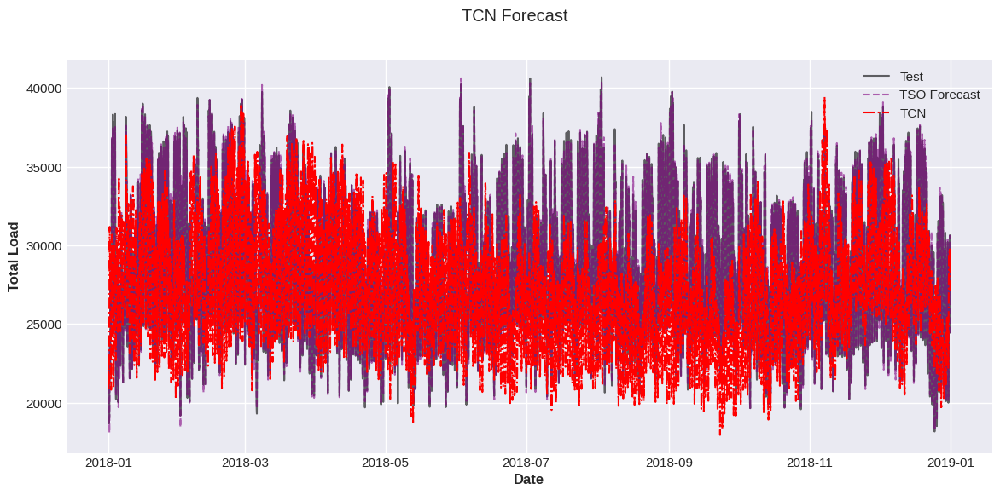

In [318]:
pred_tcn_values = pred_tcn.values().flatten()

plt.figure(figsize=(14, 6))
plt.plot(y_test.index, y_test, label='Test', color='black', alpha=0.6)
plt.plot(y_test.index, y_pred_TSO, label='TSO Forecast', color='purple', linestyle='--', alpha=0.6)
plt.plot(y_test.index, pred_tcn_values, label='TCN', color='red', linestyle='-.')

plt.suptitle('TCN Forecast')
plt.xlabel('Date')
plt.ylabel('Total Load')
plt.legend()
plt.show()

<span style="color: darkblue;">This last TCN is better than the previous one and it seems to have solve the problem of converging towards the mean. However, as we can see in the test metrics, is way worse than Prophet and XGBoost. We believe exogenous covariates benify this model, but with that many variables it is really data hungy, and just 2-3 years of hourly data isn't enough to feed the network.</span>

| Model                     | RMSE  | MAE   | MAPE (%) |
|---------------------------|-------|-------|----------|
| TSO Forecast                    | 389.32 | 269.85 | 0.93 |
| SARIMA                    | 5005.39 | 4135.67 | 13.63 |
| SARIMAX (SARIMA + Calendar) | 6642.89 | 5780.29 | 19.23 |
| Prophet (Generation + Calendar) | 2645.61 | 1973.74 | 6.96% |
| XGBoost (Lag + Roll + Exog) | 1095.17 | 789.94 | 2.77% |
| TCN (with Exog) | 4067.13 | 3183.61 | 10.77% |

## 7.2 N-Hits

<span style="color: darkblue;">For the final model we selected N-Hits. Even if it is a DL model as TCN and it may overfit aswell, it should be more regularized by design (thanks to its hierarchical pooling system).</span>

<span style="color: darkblue;">We will start trainig the model by setting three different scale pooling kernels: weekly scale, daily scale and hourly scale.</span>

In [327]:
import torch.nn as nn

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | stacks          | ModuleList       | 21.4 M | train
-------------------------------------------------------------
17.5 M    Trainable params
3.9 M     Non-trainable params
21.4 M    Total params
85.554    Total estimated model params size (MB)
72        Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

Training: |                                               | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

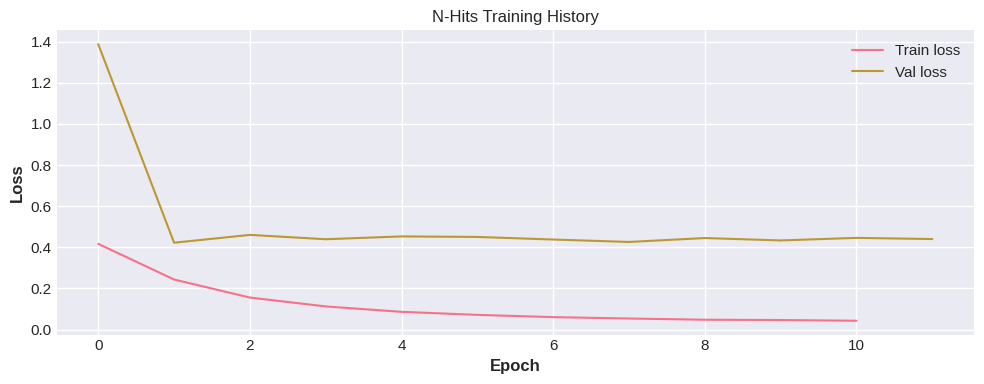

In [328]:
early_stopping = EarlyStopping(
    monitor="val_loss",
    patience=10,
    mode="min"
)

loss_history = LossHistory()

pl_trainer_kwargs = {
    "accelerator": "gpu" if torch.cuda.is_available() else "cpu",
    "devices": 1,
    "enable_progress_bar": True,
    "callbacks": [early_stopping, loss_history],
    "max_epochs": 100
}

# N-HiTS Architecture
nhits_model = NHiTSModel(
    input_chunk_length=168,
    output_chunk_length=24, 
    num_stacks=3,
    pooling_kernel_sizes=[
        [168, 24],
        [24, 12],
        [1, 1]
    ],
    num_blocks=2,
    num_layers=2,
    layer_widths=256,
    dropout= 0.1,
    batch_size=1024,
    n_epochs=100,
    optimizer_kwargs= {"lr": 1e-3, "weight_decay": 1e-5},
    pl_trainer_kwargs= pl_trainer_kwargs,
    random_state= SEED,
    model_name= "nhits_electric_load"
)

nhits_model.fit(
    series = ts_train_scaled,
    past_covariates = ts_cov_train_scaled,
    val_series = ts_val_scaled,
    val_past_covariates = ts_cov_val_scaled,
    verbose = True
)

plt.figure(figsize=(10, 4))
plt.plot(loss_history.train_losses, label='Train loss')
plt.plot(loss_history.val_losses, label='Val loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('N-Hits Training History')
plt.legend()
plt.tight_layout()
plt.savefig('../report/figures/N-Hits_1.png', dpi=80)
plt.show()

<span style="color: darkblue;">Same as TCN, this model is overfitting. Let's reduce its complexity to try to regularize it.</span>

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | stacks          | ModuleList       | 10.6 M | train
-------------------------------------------------------------
8.7 M     Trainable params
2.0 M     Non-trainable params
10.6 M    Total params
42.482    Total estimated model params size (MB)
72        Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

Training: |                                               | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

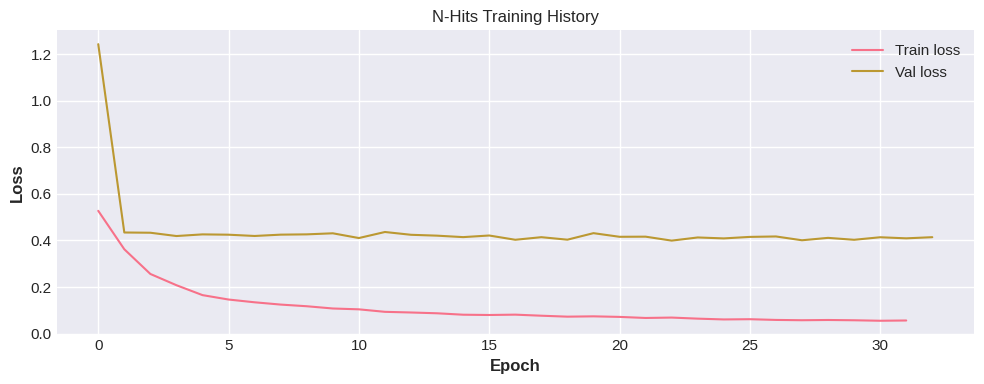

In [329]:
early_stopping = EarlyStopping(
    monitor="val_loss",
    patience=10,
    mode="min"
)

loss_history = LossHistory()

pl_trainer_kwargs = {
    "accelerator": "gpu" if torch.cuda.is_available() else "cpu",
    "devices": 1,
    "enable_progress_bar": True,
    "callbacks": [early_stopping, loss_history],
    "max_epochs": 100
}

# N-HiTS Architecture
nhits_model = NHiTSModel(
    input_chunk_length=168,
    output_chunk_length=24, 
    num_stacks=3,
    pooling_kernel_sizes=[
        [168, 24],
        [24, 12],
        [1, 1]
    ],
    num_blocks=2,
    num_layers=2,
    layer_widths=128,
    dropout= 0.3,
    batch_size=1024,
    n_epochs=100,
    optimizer_kwargs= {"lr": 1e-3, "weight_decay": 1e-5},
    pl_trainer_kwargs= pl_trainer_kwargs,
    random_state= SEED,
    model_name= "nhits_electric_load"
)

nhits_model.fit(
    series = ts_train_scaled,
    past_covariates = ts_cov_train_scaled,
    val_series = ts_val_scaled,
    val_past_covariates = ts_cov_val_scaled,
    verbose = True
)

plt.figure(figsize=(10, 4))
plt.plot(loss_history.train_losses, label='Train loss')
plt.plot(loss_history.val_losses, label='Val loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('N-Hits Training History')
plt.legend()
plt.tight_layout()
plt.savefig('../report/figures/N-Hits_2.png', dpi=80)
plt.show()

<span style="color: darkblue;">Still overfitting. Lets simplify it even more.</span>

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | HuberLoss        | 0      | train
1 | train_criterion | HuberLoss        | 0      | train
2 | val_criterion   | HuberLoss        | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | stacks          | ModuleList       | 1.3 M  | train
-------------------------------------------------------------
815 K     Trainable params
498 K     Non-trainable params
1.3 M     Total params
5.259     Total estimated model params size (MB)
36        Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

Training: |                                               | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

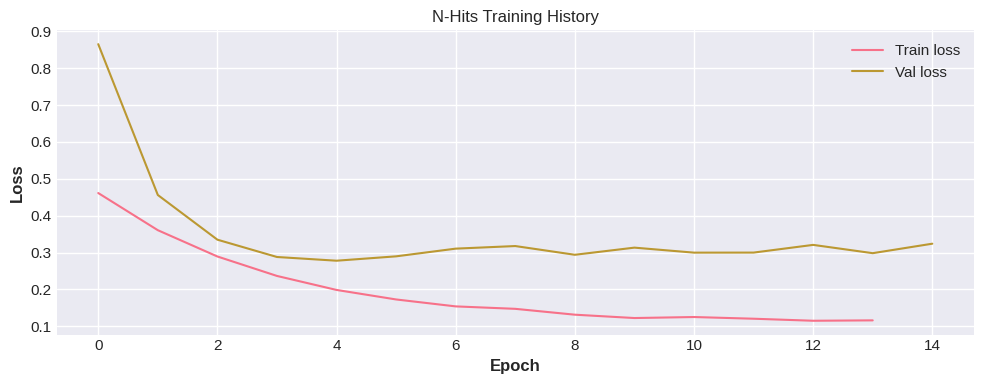

In [331]:
early_stopping = EarlyStopping(
    monitor="val_loss",
    patience=10,
    mode="min"
)

loss_history = LossHistory()

pl_trainer_kwargs = {
    "accelerator": "gpu" if torch.cuda.is_available() else "cpu",
    "devices": 1,
    "enable_progress_bar": True,
    "callbacks": [early_stopping, loss_history],
    "max_epochs": 500
}

# N-HiTS Architecture
nhits_model = NHiTSModel(
    input_chunk_length=168,
    output_chunk_length=24, 
    num_stacks=3,
    pooling_kernel_sizes=[
        [168],
        [24],
        [1]
    ],
    num_blocks=1,
    num_layers=1,
    layer_widths=32,
    dropout= 0.3,
    loss_fn = nn.HuberLoss(),
    batch_size=1024,
    n_epochs=500,
    optimizer_kwargs= {"lr": 1e-3, "weight_decay": 1e-5},
    pl_trainer_kwargs= pl_trainer_kwargs,
    random_state= SEED,
    model_name= "nhits_electric_load"
)

nhits_model.fit(
    series = ts_train_scaled,
    past_covariates = ts_cov_train_scaled,
    val_series = ts_val_scaled,
    val_past_covariates = ts_cov_val_scaled,
    verbose = True
)

plt.figure(figsize=(10, 4))
plt.plot(loss_history.train_losses, label='Train loss')
plt.plot(loss_history.val_losses, label='Val loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('N-Hits Training History')
plt.legend()
plt.tight_layout()
plt.savefig('../report/figures/N-Hits_3.png', dpi=80)
plt.show()

<span style="color: darkblue;">Still overfitting. Let's remove the weekly stack and reduce the input chunk length.</span>

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | HuberLoss        | 0      | train
1 | train_criterion | HuberLoss        | 0      | train
2 | val_criterion   | HuberLoss        | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | stacks          | ModuleList       | 524 K  | train
-------------------------------------------------------------
311 K     Trainable params
213 K     Non-trainable params
524 K     Total params
2.100     Total estimated model params size (MB)
26        Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

Training: |                                               | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

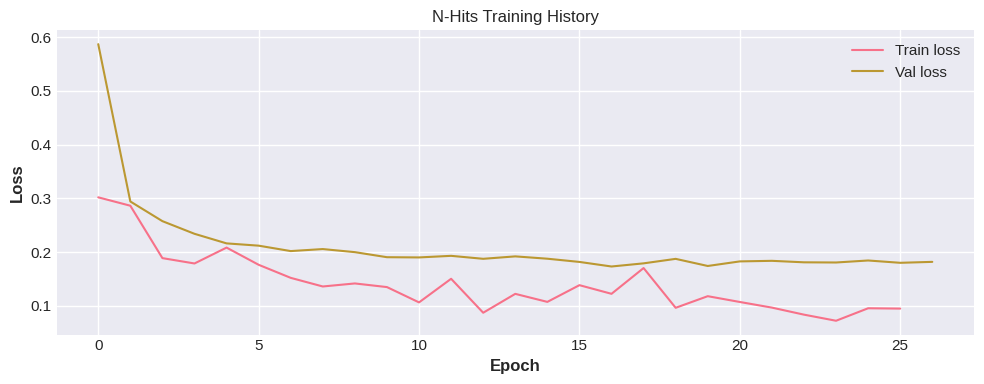

In [336]:
early_stopping = EarlyStopping(
    monitor="val_loss",
    patience=10,
    mode="min"
)

loss_history = LossHistory()

pl_trainer_kwargs = {
    "accelerator": "gpu" if torch.cuda.is_available() else "cpu",
    "devices": 1,
    "enable_progress_bar": True,
    "callbacks": [early_stopping, loss_history],
    "max_epochs": 500
}

# N-HiTS Architecture
nhits_model = NHiTSModel(
    input_chunk_length=72,
    output_chunk_length=24, 
    num_stacks=2,
    pooling_kernel_sizes=[
        [24],
        [1]
    ],
    num_blocks=1,
    num_layers=1,
    layer_widths=32,
    dropout= 0.3,
    loss_fn = nn.HuberLoss(),
    batch_size=1024,
    n_epochs=500,
    optimizer_kwargs= {"lr": 1e-3, "weight_decay": 1e-5},
    pl_trainer_kwargs= pl_trainer_kwargs,
    random_state= SEED,
    model_name= "nhits_electric_load"
)

nhits_model.fit(
    series = ts_train_scaled,
    past_covariates = ts_cov_train_scaled,
    val_series = ts_val_scaled,
    val_past_covariates = ts_cov_val_scaled,
    verbose = True
)

plt.figure(figsize=(10, 4))
plt.plot(loss_history.train_losses, label='Train loss')
plt.plot(loss_history.val_losses, label='Val loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('N-Hits Training History')
plt.legend()
plt.tight_layout()
plt.savefig('../report/figures/N-Hits_4.png', dpi=80)
plt.show()

In [337]:
from darts import concatenate
from darts import metrics

ts_context_scaled = concatenate(
    [ts_train_scaled, ts_val_scaled],
    axis=0
)

ts_cov_context_scaled = concatenate(
    [ts_cov_train_scaled, ts_cov_val_scaled, ts_cov_test_scaled],
    axis=0
)

pred_nhits_scaled = nhits_model.predict(
    n=len(ts_test),
    series=ts_context_scaled,
    past_covariates=ts_cov_context_scaled
)
pred_nhits = scaler_target.inverse_transform(pred_nhits_scaled)

print("--- N-Hits | Test performance ---")
print(f"RMSE:  {metrics.rmse(ts_test, pred_nhits):.2f}")
print(f"MAE:   {metrics.mae(ts_test, pred_nhits):.2f}")
print(f"MAPE:  {metrics.mape(ts_test, pred_nhits):.2f}%")

`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |                                             | 0/? [00:00<?, ?it/s]

--- N-Hits | Test performance ---
RMSE:  3271.60
MAE:   2651.46
MAPE:  9.50%


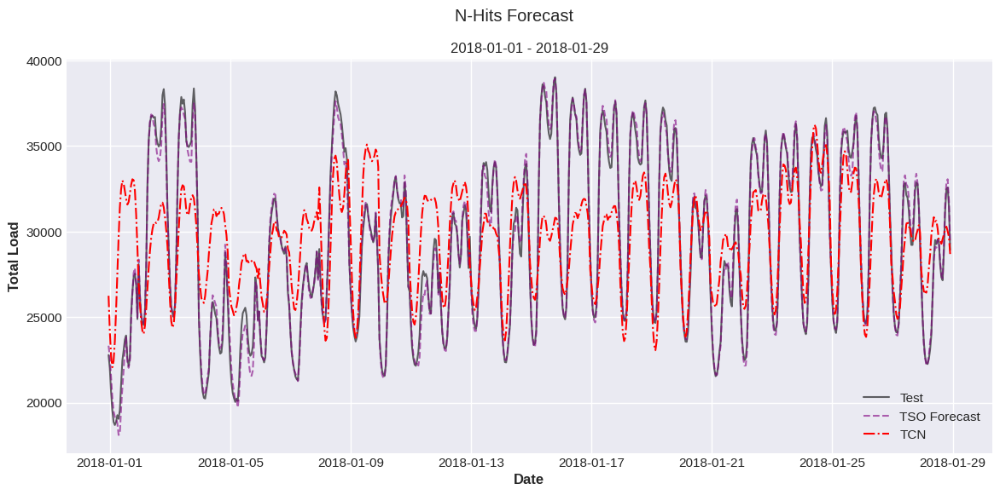

In [338]:
pred_nhits_values = pred_nhits.values().flatten()

plt.figure(figsize=(14, 6))
plt.plot(y_test.index[:24*7*4], y_test[:24*7*4], label='Test', color='black', alpha=0.6)
plt.plot(y_test.index[:24*7*4], y_pred_TSO[:24*7*4], label='TSO Forecast', color='purple', linestyle='--', alpha=0.6)
plt.plot(y_test.index[:24*7*4], pred_nhits_values[:24*7*4], label='TCN', color='red', linestyle='-.')

plt.suptitle('N-Hits Forecast')
plt.title('2018-01-01 - 2018-01-29')
plt.xlabel('Date')
plt.ylabel('Total Load')
plt.legend()
plt.savefig('../report/figures/N-Hits_forecast.png', dpi=80)
plt.show()

<span style="color: darkblue;">Even if the results are slightly better, the N-Hits behaved similar to the TCN, and it is probably suffering from the same problem.</span>

| Model                     | RMSE  | MAE   | MAPE (%) |
|---------------------------|-------|-------|----------|
| TSO Forecast                    | 389.32 | 269.85 | 0.93 |
| SARIMA                    | 5005.39 | 4135.67 | 13.63 |
| SARIMAX (SARIMA + Calendar) | 6642.89 | 5780.29 | 19.23 |
| Prophet (Generation + Calendar) | 2645.61 | 1973.74 | 6.96% |
| XGBoost (Lag + Roll + Exog) | 1095.17 | 789.94 | 2.77% |
| TCN (with Exog) | 4067.13 | 3183.61 | 10.77% |
| N-Hits (with Exog) | 3271.60 | 2651.46 | 9.50% |

# 8. Best model analysis

<span style="color: darkblue;">The best performing model so far is the XGBoost. So, lets compare its predictions with the TSO forecast.</span>

<span style="color: darkblue;">We are going to compare the predictions on different scales:</span>

<span style="color: darkblue;">First, we will compute and plot the daily RMSE for each model, as we can easily identify the peaks and differences between the two forecaster. We will also find when the XGBoost beats the TSO.</span>

<span style="color: darkblue;">Second, we will calculate MAPE grouped by hour and by day of the week. This way we can also identify at what hours and days the model's work better</span>

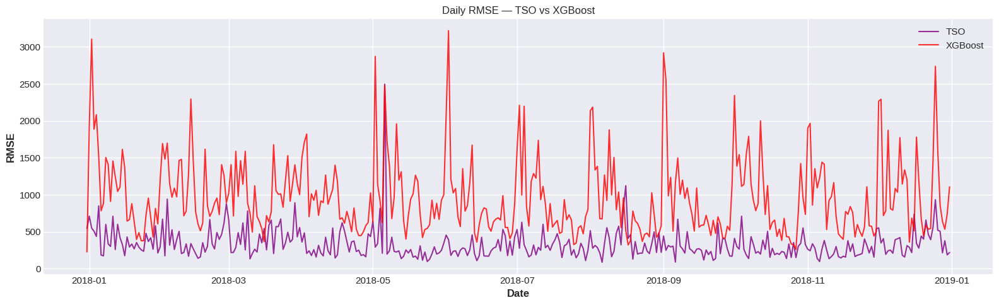

XGBoost beats TSO on 12/366 days (3.3%)

Top 10 days where XGBoost wins by most (RMSE):
2018-08-16    608.790128
2017-12-31    316.824219
2018-12-16    224.491769
2018-03-16    178.422301
2018-08-17     90.722955
2018-08-18     80.849630
2018-12-21     69.911649
2018-11-30     38.546401
2018-10-26     27.225355
2018-08-30     17.486758

Top 10 days where XGBoost loses by most (RMSE):
2018-06-02    2825.475606
2018-05-02    2578.091586
2018-01-02    2554.509780
2018-09-01    2477.341387
2018-09-02    2304.453520
2018-02-13    1955.579844
2018-12-02    1943.004903
2018-10-01    1933.587121
2018-07-02    1932.489836
2018-08-02    1908.560897


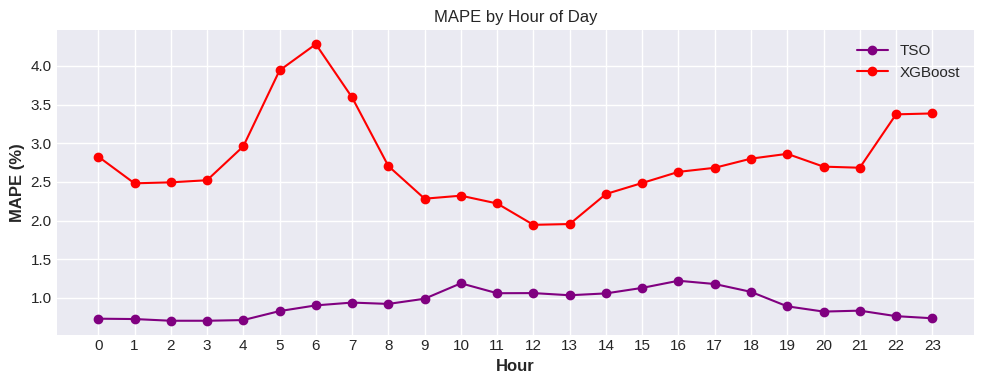

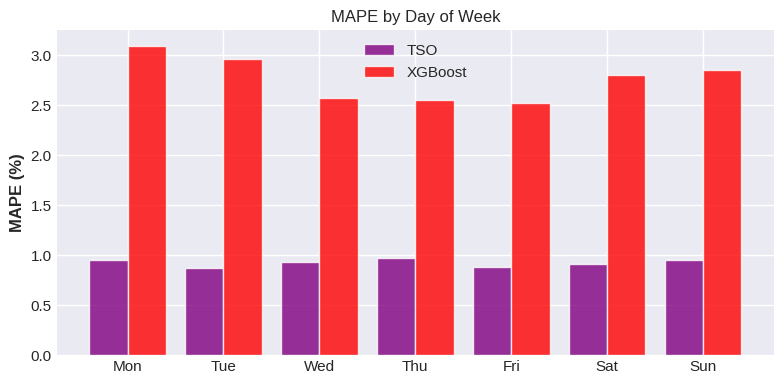

In [340]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error

# --- MAPE helper ---
def mape(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# --- Daily RMSE ---
def daily_rmse(y_true, y_pred, name):
    df = pd.DataFrame({'true': y_true.values, 'pred': y_pred.values}, index=y_true.index)
    return df.groupby(df.index.date).apply(
        lambda x: np.sqrt(mean_squared_error(x['true'], x['pred']))
    ).rename(name)

rmse_tso = daily_rmse(y_test, y_pred_TSO, 'TSO')
rmse_xgb = daily_rmse(y_test, xgb_preds, 'XGBoost')

fig, ax = plt.subplots(figsize=(16, 5))
ax.plot(rmse_tso.index, rmse_tso.values, label='TSO', color='purple', alpha=0.8)
ax.plot(rmse_xgb.index, rmse_xgb.values, label='XGBoost', color='red', alpha=0.8)
ax.set_title('Daily RMSE — TSO vs XGBoost')
ax.set_xlabel('Date')
ax.set_ylabel('RMSE')
ax.legend()
plt.tight_layout()
plt.savefig('../report/figures/daily_rmse.png', dpi=80)
plt.show()

# --- Days where XGBoost beats TSO ---
diff = rmse_tso - rmse_xgb  # positive = XGBoost wins
xgb_wins = diff[diff > 0].sort_values(ascending=False)
xgb_loses = diff[diff < 0].sort_values()

print(f"XGBoost beats TSO on {len(xgb_wins)}/{len(diff)} days ({100*len(xgb_wins)/len(diff):.1f}%)\n")
print("Top 10 days where XGBoost wins by most (RMSE):")
print(xgb_wins.head(10).to_string())
print("\nTop 10 days where XGBoost loses by most (RMSE):")
print(xgb_loses.head(10).abs().to_string())

# --- Hourly MAPE ---
def hourly_mape(y_true, y_pred, name):
    df = pd.DataFrame({'true': y_true.values, 'pred': y_pred.values}, index=y_true.index)
    return df.groupby(df.index.hour).apply(
        lambda x: mape(x['true'], x['pred'])
    ).rename(name)

mape_tso_h = hourly_mape(y_test, y_pred_TSO, 'TSO')
mape_xgb_h = hourly_mape(y_test, xgb_preds, 'XGBoost')

fig, ax = plt.subplots(figsize=(10, 4))
ax.plot(mape_tso_h.index, mape_tso_h.values, label='TSO', color='purple', marker='o')
ax.plot(mape_xgb_h.index, mape_xgb_h.values, label='XGBoost', color='red', marker='o')
ax.set_title('MAPE by Hour of Day')
ax.set_xlabel('Hour')
ax.set_ylabel('MAPE (%)')
ax.set_xticks(range(24))
ax.legend()
plt.tight_layout()
plt.savefig('../report/figures/hourly_mape.png', dpi=80)
plt.show()

# --- Weekday MAPE ---
def weekday_mape(y_true, y_pred, name):
    df = pd.DataFrame({'true': y_true.values, 'pred': y_pred.values}, index=y_true.index)
    return df.groupby(df.index.dayofweek).apply(
        lambda x: mape(x['true'], x['pred'])
    ).rename(name)

mape_tso_w = weekday_mape(y_test, y_pred_TSO, 'TSO')
mape_xgb_w = weekday_mape(y_test, xgb_preds,  'XGBoost')

days = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
fig, ax = plt.subplots(figsize=(8, 4))
ax.bar(np.arange(7) - 0.2, mape_tso_w.values, width=0.4, label='TSO', color='purple', alpha=0.8)
ax.bar(np.arange(7) + 0.2, mape_xgb_w.values, width=0.4, label='XGBoost', color='red', alpha=0.8)
ax.set_title('MAPE by Day of Week')
ax.set_xticks(range(7))
ax.set_xticklabels(days)
ax.set_ylabel('MAPE (%)')
ax.legend()
plt.tight_layout()
plt.savefig('../report/figures/weekday_mape.png', dpi=80)
plt.show()

<span style="color: darkblue;">Looking to the RMSE plot and dates where our model beats TSO, we can see how most dates are from august and december. This may be due to heat/cold waves during those periods, or maybe because of other factors.</span>

<span style="color: darkblue;">Respect to the other plots, even if our model always commit bigger errors that TSO, its performance is better where the performance of TSO is worse (during mid-day and afternoon, and on Thursdays).</span>

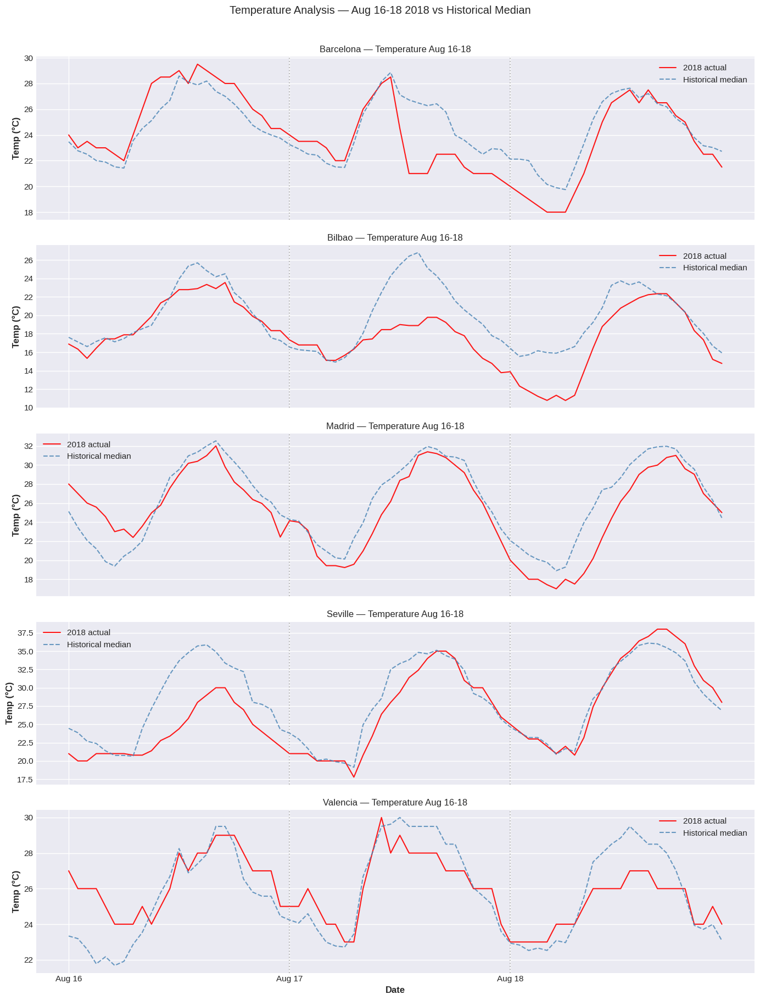

In [352]:
cities = ['barcelona', 'bilbao', 'madrid', 'seville', 'valencia']
days = [16, 17, 18]
month = 8

fig, axes = plt.subplots(len(cities), 1, figsize=(14, 18), sharex=True)

for ax, city in zip(axes, cities):
    col = f'{city}_temp'

    mask_2018 = (
        (whole_df.index.year == 2018) &
        (whole_df.index.month == month) &
        (whole_df.index.day.isin(days))
    )
    real_temps = whole_df.loc[mask_2018, col]

    mask_all = (
        (whole_df.index.month == month) &
        (whole_df.index.day.isin(days))
    )
    median_temps = whole_df.loc[mask_all, col].groupby(
        whole_df.loc[mask_all].index.hour +
        (whole_df.loc[mask_all].index.day - days[0]) * 24
    ).median()

    hours = range(len(real_temps))

    ax.plot(hours, real_temps.values, label='2018 actual', color='red', alpha=0.9)
    ax.plot(hours, median_temps.values, label='Historical median', color='steelblue', linestyle='--', alpha=0.8)
    ax.set_title(f'{city.capitalize()} — Temperature Aug 16-18')
    ax.set_ylabel('Temp (°C)')
    ax.legend()
    ax.set_xticks([0, 24, 48])
    ax.set_xticklabels(['Aug 16', 'Aug 17', 'Aug 18'])
    ax.axvline(x=24, color='gray', linestyle=':', alpha=0.5)
    ax.axvline(x=48, color='gray', linestyle=':', alpha=0.5)

axes[-1].set_xlabel('Date')
plt.suptitle('Temperature Analysis — Aug 16-18 2018 vs Historical Median', y=1.01)
plt.tight_layout()
plt.savefig('../report/figures/temp_analysis_aug.png', dpi=80, bbox_inches='tight')
plt.show()

<span style="color: darkblue;">Those days were a bit colder than the median, but not that colder to assume that it was due to a cold wave. Further research would be necesarry to perform in order to discover the reason behind this.</span>

<span style="color: darkblue;">As XGBoost only beats TSO on some punctual days, lets check if those days correspond to football events.</span>

In [347]:
liga_days = whole_df[whole_df['is_top_liga_match'] > 0].index.normalize().unique()
national_days = whole_df[whole_df['is_national_team_match'] > 0].index.normalize().unique()

print(f"Top Liga match days: {len(liga_days)}")
print(f"\nNational team match days: {len(national_days)}")

liga_wins = xgb_wins[xgb_wins.index.isin(liga_days.date)]
national_wins = xgb_wins[xgb_wins.index.isin(national_days.date)]

print(f"\nXGBoost beats TSO on {len(liga_wins)} Liga match days:")
print(liga_wins.to_string())

print(f"\nXGBoost beats TSO on {len(national_wins)} National team match days:")
print(national_wins.to_string())

Top Liga match days: 24

National team match days: 8

XGBoost beats TSO on 1 Liga match days:
2018-05-06    16.633656

XGBoost beats TSO on 0 National team match days:
Series([], )


<span style="color: darkblue;">There is one day that corresponds to a match from La Liga.</span>

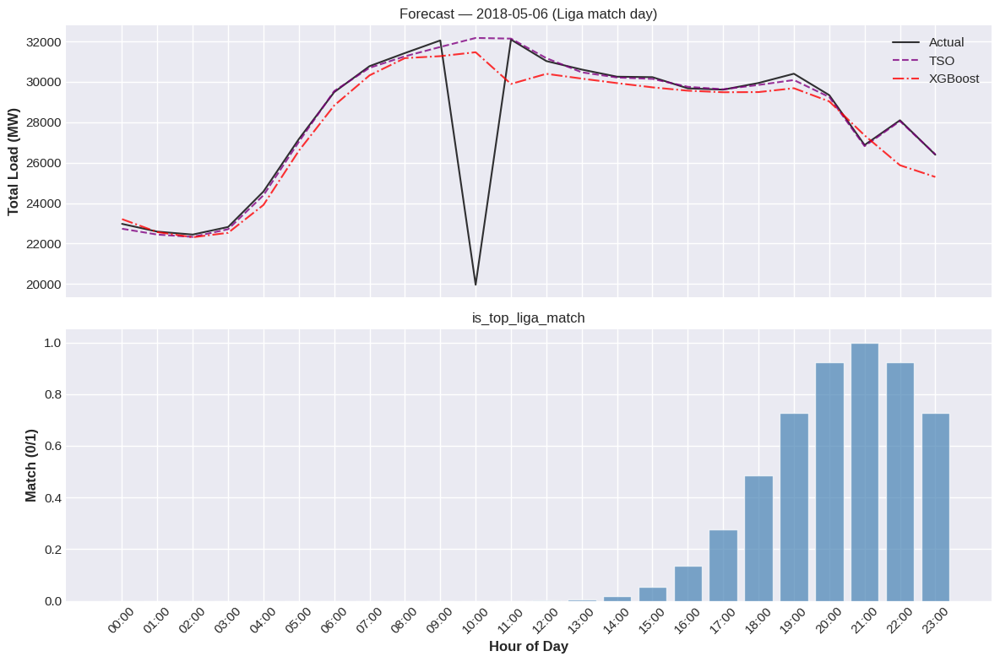

RMSE TSO    : 2495.71
RMSE XGBoost: 2479.08


In [353]:
day = pd.Timestamp('2018-05-06')

mask = y_test.index.normalize() == day.tz_localize(y_test.index.tz)
y_true_day = y_test[mask]
y_tso_day = y_pred_TSO[mask]
y_xgb_day = xgb_preds[mask]

liga_day = whole_df.loc[
    whole_df.index.normalize() == day.tz_localize(whole_df.index.tz),
    'is_top_liga_match'
]

hours = range(24)

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8), sharex=True)

# --- Top: forecast vs actual ---
ax1.plot(hours, y_true_day.values, label='Actual',  color='black',  alpha=0.8)
ax1.plot(hours, y_tso_day.values,  label='TSO',     color='purple', linestyle='--', alpha=0.8)
ax1.plot(hours, y_xgb_day.values,  label='XGBoost', color='red',    linestyle='-.', alpha=0.8)
ax1.set_title(f'Forecast — {day.date()} (Liga match day)')
ax1.set_ylabel('Total Load (MW)')
ax1.set_xticks(hours)
ax1.set_xticklabels([f'{h:02d}:00' for h in hours], rotation=45)
ax1.legend()

# --- Bottom: is_top_liga_match ---
ax2.bar(hours, liga_day.values, color='steelblue', alpha=0.7)
ax2.set_title('is_top_liga_match')
ax2.set_xlabel('Hour of Day')
ax2.set_ylabel('Match (0/1)')
ax2.set_xticks(hours)
ax2.set_xticklabels([f'{h:02d}:00' for h in hours], rotation=45)

plt.tight_layout()
plt.savefig('../report/figures/liga_day_analysis.png', dpi=80)
plt.show()

print(f"RMSE TSO    : {np.sqrt(mean_squared_error(y_true_day, y_tso_day)):.2f}")
print(f"RMSE XGBoost: {np.sqrt(mean_squared_error(y_true_day, y_xgb_day)):.2f}")

<span style="color: darkblue;">There is one day that corresponds to a match from La Liga, but we can see how the low peak on the demand doesn't correspond with the time of the match. Both models failed at that point, but ours just a bit less.</span>

# 9. Conclusions

<span style="color: darkblue;">During this notebook we have tested several different models. Statistical models like SARIMA and SARIMAX couldn't capture the complexity of the series, and data-hungry models like TCN and N-Hits overfitted due to the lack of data. The best results were obtained with something in-between: ML models. Prophet improved SARIMA and SARIMAX, but still commited quite big errors on its prediction. XGBoost resulted the best model by far, with a MAPE of 2'77%, although TSO forecast outperforms it (MAPE of 0'97%).</span>

<span style="color: darkblue;">The performance comparison and analysis between TSO and our XGBoost revealed that the boosting model beated TSO on some punctual days. Unfortunatelly, due to our lack of knowledge on this matter, we couldn't any significant reason for that behaviour. However, we found an interesting behaviour on the hourly and day-of-week scale: XGBoost performs better where TSO forecast performs worse. This may suggest that a XGBoost fitted on the TSO residuals or fitted with the TSO forecast (lagged by 24h at least) could reach better results. This would be a nice follow up work for future researches.</span>